<a href="https://colab.research.google.com/github/dolmani38/Summary2/blob/main/colab_english_model_SAM_WGAN_v3.7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAN based Korean summarizer using semi abstractive method


#4. Implementation


## 4.1 기본 설정...

In [1]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#!pip install keybert
!pip install sentence-transformers==0.3.0
!pip install transformers==3.0.2

#!pip install sentence-transformers

     |████████████████████████████████| 71kB 5.6MB/s 
     |████████████████████████████████| 1.9MB 8.4MB/s 
     |████████████████████████████████| 890kB 50.9MB/s 
     |████████████████████████████████| 3.2MB 53.5MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-0.3.0-cp37-none-any.whl size=86754 sha256=0df0d55b4fe5912c14baf1611491d2f62754c472d408a342f9668c4da1e06265
  Stored in directory: /root/.cache/pip/wheels/b8/23/85/85d6a9a6c68f0625a1ecdaad903bb0a78df058c10cf74f9de4
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp37-none-any.whl size=893262 sha256=09767843f8ec8699f1c888f4ce65ff6c97007b06736d17625692c7462bc474ae
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sentence-transformers sacremoses
     |████████████████████████████████| 778kB 8.0MB/s 
     |████████████████████████████████| 3.0MB 17.1MB/s 
     |████████████████████████████████| 1.2MB 53.2MB/s 
  Fo

In [3]:
import matplotlib.pyplot as plt
# set seeds for reproducability
from numpy.random import seed
seed(1)

import pandas as pd
import numpy as np
import string, os 

import urllib.request
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [4]:
import tensorflow as tf
# Get the GPU device name.
device_name = tf.test.gpu_device_name()

# The device name should look like the following:
if device_name == '/device:GPU:0':
    print('Found GPU at: {}'.format(device_name))
else:
    print('GPU device not found')

Found GPU at: /device:GPU:0


In [5]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [6]:
import random

SEED = 1

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [7]:
# Print iterations progress
class ProgressBar:

    def __init__(self,total=20, prefix = '', suffix = '', decimals = 1, length = 20, fill = '|', printEnd = "\r"):
        self.total = total
        self.prefix = prefix
        self.suffix = suffix
        self.decimals = decimals
        self.length = length
        self.fill = fill
        self.printEnd = printEnd
        self.ite = 0
        self.back_filledLength = 0

    def printProgress(self,iteration, text):
        self.ite += iteration
        percent = ("{0:." + str(self.decimals) + "f}").format(100 * (self.ite / float(self.total)))
        filledLength = int(self.length * self.ite // self.total)
        bar = self.fill * filledLength + '.' * (self.length - filledLength)
        if filledLength > self.back_filledLength or percent == 100:
            print(f'\r{self.prefix} |{bar}| {percent}% {self.suffix}  {text}', end="", flush=True)
            # Print New Line on Complete
            if self.ite == self.total: 
                print()
        self.back_filledLength = filledLength    

In [8]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

## CNN/Daily Mail dataset download...

In [9]:
import tensorflow_datasets as tfds
train_data, test_data = tfds.load(name="cnn_dailymail",split=(tfds.Split.TRAIN,tfds.Split.TEST),with_info=True)

Shuffling and writing examples to /root/tensorflow_datasets/cnn_dailymail/plain_text/3.0.0.incompleteIEQH52/cnn_dailymail-train.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cnn_dailymail/plain_text/3.0.0.incompleteIEQH52/cnn_dailymail-validation.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cnn_dailymail/plain_text/3.0.0.incompleteIEQH52/cnn_dailymail-test.tfrecord


Dataset cnn_dailymail downloaded and prepared to /root/tensorflow_datasets/cnn_dailymail/plain_text/3.0.0. Subsequent calls will reuse this data.


In [10]:
train_data[0]

<PrefetchDataset shapes: {article: (), highlights: ()}, types: {article: tf.string, highlights: tf.string}>

In [11]:
sentences_dataset = []
gold_summary = []
iterator = iter(train_data[0])
cnt = 0
for data in iterator:
    cnt += 1
    if cnt < 1000:
        sentences_dataset.append(data['article'].numpy().decode('UTF-8'))
        gold_summary.append(data['highlights'].numpy().decode('UTF-8'))
    else:
        break

In [12]:
print(len(sentences_dataset))

999


##4.2 Grammar Discriminator Class

In [13]:
from transformers import BertTokenizer, AutoTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler, TensorDataset, random_split

import time
import random
import datetime

# 간단한 전처리
def clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    txt = txt.replace('=','')
    txt = txt.replace('\"','')   
    txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    txt = txt.replace('..','')
    txt = txt.replace('...','')
    txt = txt.replace(' .','.')
    txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def shuffling(txt):
    txt_list = txt.split(' ')
    random.shuffle(txt_list)
    return ' '.join(txt_list)

def collect_training_dataset_for_grammar_discriminator(sentences_dataset):

    sentences = []
    labels = []

    for txtss in sentences_dataset:
        txtss = clean_text(txtss)
        txts = txtss.strip().split('.')
        for txt in txts:  
            txt = txt.strip()
            if len(txt) > 40:
                #ko_grammar_dataset.append([txt,1])
                txt = txt.replace('.','')
                tf = random.choice([True,False])
                # 정상 또는 비정상 둘중에 하나만 데이터셋에 추가
                if (tf):
                    sentences.append(txt) # '.'의 위치를 보고 True, False를 판단 하기 땜에...
                    labels.append(1)
                else:
                    sentences.append(shuffling(txt))
                    labels.append(0)

    return sentences,labels

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

class Grammar_Discriminator:


    def __init__(self, pre_trained_model_name='bert-base-uncased', input_dir=None):

        if input_dir is None:
            print('Loading BERT tokenizer...')
            self.tokenizer = BertTokenizer.from_pretrained(pre_trained_model_name, do_lower_case=True)
            self.discriminator = BertForSequenceClassification.from_pretrained(
                                    pre_trained_model_name, # Use the 12-layer BERT model, with an uncased vocab.
                                    num_labels = 2, # The number of output labels--2 for binary classification.
                                                    # You can increase this for multi-class tasks.   
                                    output_attentions = False, # Whether the model returns attentions weights.
                                    output_hidden_states = False, # Whether the model returns all hidden-states.
                                )            
        else:
            self.__load_model(input_dir)



    def set_dataset(self, sentences,labels):
        # Print the original sentence.
        print(' Original: ', sentences[0])

        # Print the sentence split into tokens.
        print('Tokenized: ', self.tokenizer.tokenize(sentences[0]))

        # Print the sentence mapped to token ids.
        print('Token IDs: ', self.tokenizer.convert_tokens_to_ids(self.tokenizer.tokenize(sentences[0])))   

        # Tokenize all of the sentences and map the tokens to thier word IDs.
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])
            
            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])

        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0)
        attention_masks = torch.cat(attention_masks, dim=0)
        labels = torch.tensor(labels)

        # Print sentence 0, now as a list of IDs.
        print('Original: ', sentences[0])
        print('Token IDs:', input_ids[0])

        # Training & Validation Split
        # Divide up our training set to use 90% for training and 10% for validation.

        # Combine the training inputs into a TensorDataset.
        dataset = TensorDataset(input_ids, attention_masks, labels)

        # Create a 90-10 train-validation split.

        # Calculate the number of samples to include in each set.
        train_size = int(0.9 * len(dataset))
        val_size = len(dataset) - train_size

        # Divide the dataset by randomly selecting samples.
        train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

        print('{:>5,} training samples'.format(train_size))
        print('{:>5,} validation samples'.format(val_size))

        # The DataLoader needs to know our batch size for training, so we specify it 
        # here. For fine-tuning BERT on a specific task, the authors recommend a batch 
        # size of 16 or 32.
        self.batch_size = 32

        # Create the DataLoaders for our training and validation sets.
        # We'll take training samples in random order. 
        self.train_dataloader = DataLoader(
                    train_dataset,  # The training samples.
                    sampler = RandomSampler(train_dataset), # Select batches randomly
                    batch_size = self.batch_size # Trains with this batch size.
                )

        # For validation the order doesn't matter, so we'll just read them sequentially.
        self.validation_dataloader = DataLoader(
                    val_dataset, # The validation samples.
                    sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
                    batch_size = self.batch_size # Evaluate with this batch size.
                )        



    def train(self,epochs=4):
        # Tell pytorch to run this model on the GPU.
        self.discriminator.cuda()

        # Get all of the model's parameters as a list of tuples.
        params = list(self.discriminator.named_parameters())

        print('The BERT model has {:} different named parameters.\n'.format(len(params)))

        print('==== Embedding Layer ====\n')

        for p in params[0:5]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== First Transformer ====\n')

        for p in params[5:21]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== Output Layer ====\n')

        for p in params[-4:]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))  

        # Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
        # I believe the 'W' stands for 'Weight Decay fix"
        self.optimizer = AdamW(self.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        # Number of training epochs. The BERT authors recommend between 2 and 4. 
        # We chose to run for 4, but we'll see later that this may be over-fitting the
        # training data.
        #epochs = 2

        # Total number of training steps is [number of batches] x [number of epochs]. 
        # (Note that this is not the same as the number of training samples).
        total_steps = len(self.train_dataloader) * epochs

        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(self.optimizer, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = total_steps)
            
        # This training code is based on the `run_glue.py` script here:
        # https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

        # Set the seed value all over the place to make this reproducible.
        seed_val = 42

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        # We'll store a number of quantities such as training and validation loss, 
        # validation accuracy, and timings.
        training_stats = []

        # Measure the total training time for the whole run.
        total_t0 = time.time()

        # For each epoch...
        for epoch_i in range(0, epochs):
            
            # ========================================
            #               Training
            # ========================================
            
            # Perform one full pass over the training set.

            print("")
            print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
            print('Training...')

            # Measure how long the training epoch takes.
            t0 = time.time()

            # Reset the total loss for this epoch.
            total_train_loss = 0

            # Put the model into training mode. Don't be mislead--the call to 
            # `train` just changes the *mode*, it doesn't *perform* the training.
            # `dropout` and `batchnorm` layers behave differently during training
            # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
            self.discriminator.train()

            # For each batch of training data...
            for step, batch in enumerate(self.train_dataloader):

                # Progress update every 40 batches.
                if step % 40 == 0 and not step == 0:
                    # Calculate elapsed time in minutes.
                    elapsed = format_time(time.time() - t0)
                    
                    # Report progress.
                    print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(self.train_dataloader), elapsed))

                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using the 
                # `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)

                # Always clear any previously calculated gradients before performing a
                # backward pass. PyTorch doesn't do this automatically because 
                # accumulating the gradients is "convenient while training RNNs". 
                # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
                self.discriminator.zero_grad()        

                # Perform a forward pass (evaluate the model on this training batch).
                # The documentation for this `model` function is here: 
                # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                # It returns different numbers of parameters depending on what arguments
                # arge given and what flags are set. For our useage here, it returns
                # the loss (because we provided labels) and the "logits"--the model
                # outputs prior to activation.
                loss, logits = self.discriminator(b_input_ids, 
                                    token_type_ids=None, 
                                    attention_mask=b_input_mask, 
                                    labels=b_labels)

                # Accumulate the training loss over all of the batches so that we can
                # calculate the average loss at the end. `loss` is a Tensor containing a
                # single value; the `.item()` function just returns the Python value 
                # from the tensor.
                total_train_loss += loss.item()

                # Perform a backward pass to calculate the gradients.
                loss.backward()

                # Clip the norm of the gradients to 1.0.
                # This is to help prevent the "exploding gradients" problem.
                torch.nn.utils.clip_grad_norm_(self.discriminator.parameters(), 1.0)

                # Update parameters and take a step using the computed gradient.
                # The optimizer dictates the "update rule"--how the parameters are
                # modified based on their gradients, the learning rate, etc.
                self.optimizer.step()

                # Update the learning rate.
                scheduler.step()

            # Calculate the average loss over all of the batches.
            avg_train_loss = total_train_loss / len(self.train_dataloader)            
            
            # Measure how long this epoch took.
            training_time = format_time(time.time() - t0)

            print("")
            print("  Average training loss: {0:.2f}".format(avg_train_loss))
            print("  Training epcoh took: {:}".format(training_time))
                
            # ========================================
            #               Validation
            # ========================================
            # After the completion of each training epoch, measure our performance on
            # our validation set.

            print("")
            print("Running Validation...")

            t0 = time.time()

            # Put the model in evaluation mode--the dropout layers behave differently
            # during evaluation.
            self.discriminator.eval()

            # Tracking variables 
            total_eval_accuracy = 0
            total_eval_loss = 0
            nb_eval_steps = 0

            # Evaluate data for one epoch
            for batch in self.validation_dataloader:
                
                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using 
                # the `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)
                
                # Tell pytorch not to bother with constructing the compute graph during
                # the forward pass, since this is only needed for backprop (training).
                with torch.no_grad():        

                    # Forward pass, calculate logit predictions.
                    # token_type_ids is the same as the "segment ids", which 
                    # differentiates sentence 1 and 2 in 2-sentence tasks.
                    # The documentation for this `model` function is here: 
                    # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                    # Get the "logits" output by the model. The "logits" are the output
                    # values prior to applying an activation function like the softmax.
                    (loss, logits) = self.discriminator(b_input_ids, 
                                        token_type_ids=None, 
                                        attention_mask=b_input_mask,
                                        labels=b_labels)
                    
                # Accumulate the validation loss.
                total_eval_loss += loss.item()

                # Move logits and labels to CPU
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()

                # Calculate the accuracy for this batch of test sentences, and
                # accumulate it over all batches.
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                

            # Report the final accuracy for this validation run.
            avg_val_accuracy = total_eval_accuracy / len(self.validation_dataloader)
            print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

            # Calculate the average loss over all of the batches.
            avg_val_loss = total_eval_loss / len(self.validation_dataloader)
            
            # Measure how long the validation run took.
            validation_time = format_time(time.time() - t0)
            
            print("  Validation Loss: {0:.2f}".format(avg_val_loss))
            print("  Validation took: {:}".format(validation_time))

            # Record all statistics from this epoch.
            training_stats.append(
                {
                    'epoch': epoch_i + 1,
                    'Training Loss': avg_train_loss,
                    'Valid. Loss': avg_val_loss,
                    'Valid. Accur.': avg_val_accuracy,
                    'Training Time': training_time,
                    'Validation Time': validation_time
                }
            )

        print("")
        print("Training complete!")

        print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
            

        return training_stats

    def save_model(self, output_dir = './model_save/'):
        # Create output directory if needed
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        print("Saving model to %s" % output_dir)

        # Save a trained model, configuration and tokenizer using `save_pretrained()`.
        # They can then be reloaded using `from_pretrained()`
        model_to_save = self.discriminator.module if hasattr(self.discriminator, 'module') else self.discriminator  # Take care of distributed/parallel training
        model_to_save.save_pretrained(output_dir)
        self.tokenizer.save_pretrained(output_dir)

        # Good practice: save your training arguments together with the trained model
        # torch.save(args, os.path.join(output_dir, 'training_args.bin'))

    def __load_model(self, input_dir = './drive/MyDrive/Colab Notebooks/summary/en_grammar_check_model'):
        print('Loading BERT tokenizer...')
        self.tokenizer = BertTokenizer.from_pretrained(input_dir)
        self.discriminator = BertForSequenceClassification.from_pretrained(input_dir)

    def transfer_learning(self, sentences, train_for = True):
        
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])

            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])
        
        if train_for:
            b_labels = torch.ones(len(sentences),dtype=torch.long).to(device)
        else:
            b_labels = torch.zeros(len(sentences),dtype=torch.long).to(device)
        #print(b_labels)
        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0).to(device)
        attention_masks = torch.cat(attention_masks, dim=0).to(device)    
        #if str(discriminator1.device) == 'cpu':
        #    pass
        #else:
        #    input_ids = input_ids.to(device)
        #    attention_masks = attention_masks.to(device)        

        loss, logits = self.discriminator(input_ids, 
                            token_type_ids=None, 
                            attention_mask=attention_masks, 
                                labels=b_labels)
        #return torch.sigmoid(outputs[0][:,1])
        #return outputs[0][:,1]
        return loss, logits


###4.2.1 CNN/Daily Mail dataset으로 영어 문법 학습

In [14]:
sentences,labels = collect_training_dataset_for_grammar_discriminator(sentences_dataset[0:1])

In [15]:
sentences_dataset[0]

"By . Associated Press . PUBLISHED: . 14:11 EST, 25 October 2013 . | . UPDATED: . 15:36 EST, 25 October 2013 . The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A . State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained 

In [16]:
k=5
print(labels[k])
print(sentences[k])

0
last newly The a for says attending in while he contaminated food the Italy through diocese conference infection bishops month contracted ordained


In [17]:
len(sentences_dataset)

999

In [18]:
use_pretrained_model = True

if use_pretrained_model:
    g_discriminator = Grammar_Discriminator(input_dir = '/content/drive/MyDrive/Colab Notebooks/summary/model_save')
else:
    sentences,labels = collect_training_dataset_for_grammar_discriminator(sentences_dataset)
    print(len(sentences))
    g_discriminator = Grammar_Discriminator()
    g_discriminator.set_dataset(sentences[0:500000],labels[0:500000])
    g_discriminator.train(epochs=2)
    g_discriminator.save_model()

Loading BERT tokenizer...


In [19]:
if False: ## 추가적인 fine-tuning
    sentences,labels = collect_training_dataset_for_grammar_discriminator(sentences_dataset)
    print(len(sentences))
    g_discriminator = Grammar_Discriminator()
    g_discriminator.set_dataset(sentences[0:500000],labels[0:500000])
    g_discriminator.train(epochs=1)
    g_discriminator.save_model()

##4.3 Static similarity discriminator class

In [20]:
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
import scipy


class Similarity_Discriminator:
    '''
    _instance = None
    _embedder = None
    def __new__(cls,pre_trained_model_name='stsb-roberta-large'):
        if cls._instance is None:
            print('Creating Similarity_Discriminator object')
            cls._instance = super(Similarity_Discriminator, cls).__new__(cls)
            # Put any initialization here.
            cls._embedder = SentenceTransformer(pre_trained_model_name)
        return cls._instance

    '''

    def __init__(self,pre_trained_model_name='stsb-roberta-large'):
        print('Creating Similarity_Discriminator object')
        # Put any initialization here.
        self._embedder = SentenceTransformer(pre_trained_model_name)  
        #self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def encode(self,texts):
        return self._embedder.encode(texts,show_progress_bar=False)

    def similarity(self, query_text, org_text_emb):
        queries = nltk.sent_tokenize(query_text)
        query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #print(queries)
        #print(org_text_emb)
        
        if len(query_embeddings) == 0:
            return 0.0

        cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_text_emb, "cosine")
        similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))
        '''
        for query, query_embedding in zip(queries, query_embeddings):
            distances = scipy.spatial.distance.cdist([query_embedding], [org_text_emb], "cosine")[0]
            results = zip(range(len(distances)), distances)
            for idx, distance in results:
                scores.append(1-distance)
        '''
        return similarity_score  
 

###4.3.1 영어 문장 유사도 pre-trained model 적용

In [21]:
s_discriminator = Similarity_Discriminator(pre_trained_model_name="stsb-bert-base")
#s_discriminator = Similarity_Discriminator()

Creating Similarity_Discriminator object


100%|██████████| 405M/405M [00:23<00:00, 17.2MB/s]


##4.4 Document source class

###4.4.1 keyBERT를 위한 pre-trained model의 적재

In [22]:
#!pip install keybert

In [23]:
#from keybert import KeyBERT
#key_model = KeyBERT('distilbert-base-nli-mean-tokens')

###4.4.2 frame term 추출을 위한 source class 구현

In [24]:


class Source:

    def __init__(self,org_text):
        self.org_text = org_text

    def __crean_text(self, txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        #txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        txt = txt.replace(' .','.')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()


    def extract_keywords(self,s_discriminator,key_model,comp_rate=0.2):
        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}
        index_table = {}
        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Token     ')
        for k in self.term_table.keys():
            print( f'  {str(k).ljust(5)}     {self.term_table[k]}')
        print('---------------------------------------------')
        '''
        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)
        '''
        # weight 들의 초기화
        terms = np.array(list(self.term_table.values()))

        word_filters=np.array([[0]])

        story_weights = np.zeros(self.org_source_length,)
        word_weights = np.zeros(self.org_source_length,)

        #terms = np.array(list(self.term_table.values()))

        # story에 지배적인 word를 찾는다.
        # 먼저 word의 강세 분석
        for filter in word_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='Frame token scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                #print('\n part_sen:',part_sen)
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                word_weights[t] += score 

        # story의 강세 분석
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='Frame token scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                story_weights[t] += score

        #각각의 peak를 산출
        word_peaks, _ = find_peaks(word_weights, height=0)
        story_peaks, _ = find_peaks(story_weights, height=0)

        #두개의 peak가 겹치는 word에 대해 한개 word가 유사도에 미치는 영향이 큰것으로 간주
        #해당 word를 유사도 판단 필터에서 제외하고 다시 필터링...
        #이를 통해 story에 대한 word를 최대한 추출 한다.

        dup_order = []
        for i in range(self.org_source_length):
            #lst = ""
            if (i in word_peaks) and (i in story_peaks):
                if terms[i].endswith('.'):
                    pass
                else:
                    dup_order.append(i)
                    
        # Story에 대한 weight을 추출하기 위해, word에 유독 강세가 있는 term을 제외 시킨다.
        print('Negative tokens:',terms[dup_order])
        '''

        top_n = int(len(self.term_table) * comp_rate)

        self.story_peaks = []
        keywords = key_model.extract_keywords(self.org_text,top_n=top_n)
        #print('keywords len',len(keywords))
        #print('keywords',keywords)
        for keyword,p in keywords:
            for k in self.term_table.keys():
                if self.term_table[k] == keyword: # and k not in dup_order:
                    self.story_peaks.append(k)

        self.story_peaks.append(len(self.term_table)-2)
        self.story_peaks = np.sort(np.asarray(self.story_peaks))
        print('story_peaks:',self.story_peaks)
        print('Peak count:',len(self.story_peaks))          


        # story skeleton 추출
        self.frame_text = ""
        for k in self.story_peaks:
            #print(k,term_weight[k],word_table[k])
            self.frame_text += self.term_table[k]+' '  

        print('Frame tokens:',self.frame_text)
        print('')
        print(f'Similarity : {self.s_discriminator.similarity(self.frame_text.strip(),self.org_text_emb)}')    

    def set_key_rate(self,s_discriminator,comp_rate=0.2):
        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}

        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word

        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)
        top_n = int(len(self.term_table) * comp_rate)
        #print('top_n',top_n)
        self.story_peaks = [i+1 for i in range(top_n)]

    def analysis_frame_terms(self,s_discriminator,story_filters=np.array([[0,1],[0,1,2],[0,1,2,3]]),peak_base_line = 0.0,comp_rate=0.2,except_key=True,display=False):

        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}

        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Token     ')
        for k in self.term_table.keys():
            print( f'  {str(k).ljust(5)}     {self.term_table[k]}')
        print('---------------------------------------------')
        '''

        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)

        # weight 들의 초기화
        terms = np.array(list(self.term_table.values()))

        word_filters=np.array([[0]])

        story_weights = np.zeros(self.org_source_length,)
        word_weights = np.zeros(self.org_source_length,)

        #terms = np.array(list(self.term_table.values()))

        if except_key:
            # story에 지배적인 word를 찾는다.
            # 먼저 word의 강세 분석
            for filter in word_filters:
                #print(filter)
                last_idx = len(terms)-(max(filter)+1)
                pb = ProgressBar(last_idx,prefix='Frame token scan:')
                for conv in range(last_idx,0,-1):
                    pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                    t = np.array(filter) + conv
                    part_sen = ' '.join(terms[t]) 
                    score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                    word_weights[t] += score 

            # story의 강세 분석
            for filter in story_filters:
                #print(filter)
                last_idx = len(terms)-(max(filter)+1)
                pb = ProgressBar(last_idx,prefix='Frame token scan:')
                for conv in range(last_idx,0,-1):
                    pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                    t = np.array(filter) + conv
                    part_sen = ' '.join(terms[t]) 
                    score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                    story_weights[t] += score

            #각각의 peak를 산출
            word_peaks, _ = find_peaks(word_weights, height=0)
            story_peaks, _ = find_peaks(story_weights, height=0)

            #두개의 peak가 겹치는 word에 대해 한개 word가 유사도에 미치는 영향이 큰것으로 간주
            #해당 word를 유사도 판단 필터에서 제외하고 다시 필터링...
            #이를 통해 story에 대한 word를 최대한 추출 한다.

            dup_order = []
            for i in range(self.org_source_length):
                #lst = ""
                if (i in word_peaks) and (i in story_peaks):
                    if terms[i].endswith('.'):
                        pass
                    else:
                        dup_order.append(i)
                        
            # Story에 대한 weight을 추출하기 위해, word에 유독 강세가 있는 term을 제외 시킨다.
            print('Negative tokens:',terms[dup_order])
            if except_key:
                terms[dup_order] = '---'
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code         Token      ')
        print('')
        for index, word in zip(range(len(terms)),terms):
            print( f'  {str(index).ljust(8)}    {word}')
        print('---------------------------------------------')
        '''
        self.story_weights = np.zeros(self.org_source_length,)
        # 그리고 다시 story 분석 스캔
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='Frame token scan:')
            for conv in range(last_idx):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                #part_sen = part_sen.replace('소녀','---')
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                self.story_weights[t] += score        


        # base line
        base_line = peak_base_line
        # 다시 peak 추출
        story_peaks, _ = find_peaks(self.story_weights, height=base_line)

        top_n = int(len(self.term_table) * comp_rate)

        if len(story_peaks) > top_n:
            peak_dict = {}
            for i,peak in zip(range(len(story_peaks)),story_peaks):
                peak_dict[peak] = self.story_weights[peak]
            #print(peak_dict)
            peaks = sorted(peak_dict, key=peak_dict.get, reverse=True)
            #print(peaks)
            peaks = peaks[:top_n]
            #print(peaks)
            peaks.sort()
            story_peaks = peaks
            #print(story_peaks)

        #print('top_n:',top_n,'story_peaks:',len(story_peaks))
        #print(story_peaks)
        
        self.story_peaks = np.append(story_peaks,len(story_weights)-2)
        #print(self.story_peaks)
        # story density 표출
        if display:
            plt.figure(figsize=(12, 6))
            plt.plot(self.story_weights)
            plt.plot(self.story_peaks, self.story_weights[self.story_peaks], "x")
            plt.plot(np.zeros_like(self.story_weights)+base_line, "--", color="gray")
            plt.show() 
        print('Peak count:',len(self.story_peaks))          


        # story skeleton 추출
        self.frame_text = ""
        for k in self.story_peaks:
            #print(k,term_weight[k],word_table[k])
            self.frame_text += self.term_table[k]+' '  

        print('Frame tokens:',self.frame_text)
        print('')
        print(f'Similarity : {self.s_discriminator.similarity(self.frame_text.strip(),self.org_text_emb)}')      
        ''' 
        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
   
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Score        Token              ')
        print('')
        for k in self.term_table.keys(): 
            print( f'  {str(k).ljust(5)}   {str(round(self.story_weights[k],4)).ljust(8)}  {self.term_table[k]}')

        print('---------------------------------------------') 
        '''
    def get_org_sample(self, num):
        return self.org_sentences[np.random.choice(len(self.org_sentences), num)]

    def get_source_embedded_code(self):
        return self.org_text_emb

##4.5 Generator class

In [25]:
from functools import reduce

class Generator(nn.Module):
    """
        Simple Generator w/ MLP
    """
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*2),
            nn.LeakyReLU(0.2),
            
            nn.Linear(input_size*2, input_size*3),
            nn.LeakyReLU(0.2),
            nn.Linear(input_size*3, input_size*2),
            nn.LeakyReLU(0.2),

            nn.Linear(input_size*2, input_size),
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )
    '''
    def forward(self, x, story_peaks, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y_[:,story_peaks] += bias
        y_ = nn.Sigmoid()(y_)
        #reduce(torch.add, [y_,bias]) / 2
        return y_
    '''

    
    def forward(self, x, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y = torch.add(y_,bias)
        #y = nn.Sigmoid()(y)

        return y, y_

    '''    
    def forward(self, x):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        #y = torch.add(y_,bias)
        y = nn.Sigmoid()(y_)

        return y, y_    
    '''    

##4.6 Summarizer class (GAN training)

In [85]:
import random
import math
import numpy as np
from scipy.special import expit

class SAM_Summarizer:

    def __init__(self,g_discriminator,s_discriminator):
        self.g_discriminator = g_discriminator
        self.s_discriminator = s_discriminator
        self.m = nn.Sigmoid()

    def ready(self,source):
        self.source = source  
        #self.source.analysis_frame_terms(self.s_discriminator)
        self.generator = Generator(input_size=self.source.org_source_length)

        return self

    def summarize(self,epochs=10,batch_size=2,frame_expansion_ratio = 0.8,init_bias = 1.0,learning_rate=2e-4, display = False):
        self.frame_expansion_ratio = frame_expansion_ratio
        history = self.__train(epochs,batch_size,init_bias,learning_rate,display)
        if display:
            plt.figure(figsize=(12, 6))
            plt.plot(history['gen_g_loss'],label='generator grammar loss')
            plt.plot(history['gen_s_loss'],label='generator similarity loss')
            #if 'dis_loss' in history:
            #    plt.plot(history['dis_loss'],label='discriminator grammar loss')
            plt.legend()
            plt.show()

        return self

    # text의 생성 for torch
    def __text_gen2(self, noise, gen_length):
        gtext = []
        sorted_noise, i = torch.sort(noise, descending=True)
        order, i = torch.sort(i[:gen_length], descending=False)
        #print(len(order))
        assert len(order) == gen_length
        order = order.cpu().detach().numpy()
        for k in order:
            gtext.append((self.source.term_table[k],k))
        return gtext

    def __discrete_gradient(self,weights,gen_length,beta,use_gpu=False, verbose=0):
        fake_gen_out = torch.zeros(weights.shape).to(device)
        fake_sim_out = torch.zeros(weights.shape).to(device)

        real_text = self.source.get_org_sample(weights.shape[0])
        fake_outs = []
        real_outs = []
        apply_order = []
        for i, noise in enumerate(weights):
            gtext = self.__text_gen2(noise,gen_length)
            tw = ""
            tk = []
            fake_scores = []
            for (w,k) in gtext:
                tw += w + ' '
                tk.append(k)
                if w.endswith('.'):
                    fake_outs.append(tw.strip())
                    real_outs.append(real_text[i])
                    apply_order.append((i,tk))
                    tw = ""
                    tk = []
                    
            if len(tk) > 0:
                fake_outs.append(tw.strip())
                real_outs.append(real_text[i])
                apply_order.append((i,tk))

        D_z_loss, fake_gmr_out=self.g_discriminator.transfer_learning(fake_outs,train_for = False)
        D_x_loss, real_gmr_out=self.g_discriminator.transfer_learning(real_outs,train_for = True)   # not use of 'real_gmr_out'

        f_sim_out = []
        for fake_text in fake_outs:
            f_sim_out.append(self.s_discriminator.similarity(fake_text,self.source.org_text_emb))

        #if use_gpu:
        #    apply_order = torch.FloatTensor(apply_order).to(device)  
        
        #print(fake_dis_out)
        
        for j, (i,tk) in enumerate(apply_order):
            #fake_gen_out[i,tk] += fake_dis_out[j].numpy() --> 이거는 tf 용...
            #fake_gen_out[i,tk] += fake_dis_out[j] #.cpu().detach().numpy()
            # 
            try:
                #print('fake_gmr_out:',fake_gmr_out[j,1])
                #print('real_gmr_out:',real_gmr_out[j,1])
                #fake_gen_out[i,tk] += torch.sigmoid(fake_gmr_out[j,1])

                fake_gen_out[i,tk] += torch.tanh( fake_gmr_out[j,1])
                fake_sim_out[i,tk] += f_sim_out[j] * beta
                
            except Exception as ex:
                print(j,i,tk)
                print(fake_gmr_out)
                raise ex

        return fake_gen_out, fake_sim_out, D_z_loss, D_x_loss


    def __train(self, epochs=10,batch_size=10,init_bias = 1.0,learning_rate=2e-4, display = False):
        # In the Deepmind paper they use RMSProp however then Adam optimizer
        # improves training time
        #generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        # This method returns a helper function to compute cross entropy loss
        #cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

        # Set the seed value all over the place to make this reproducible.
        seed_val = 10

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)
        
        criterion = nn.BCELoss()
        #D_opt = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
        G_opt = torch.optim.Adam(self.generator.parameters(), lr=learning_rate)
        D1_opt = AdamW(self.g_discriminator.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        
        gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        pb = ProgressBar(epochs,prefix='Train...')
        gen_gmr_loss_history = []
        gen_sim_loss_history = []
        dis_loss_history = []    

        #model 들은 cuda로 보낸다.
        self.g_discriminator.discriminator.to(device)
        self.g_discriminator.discriminator.eval() # 학습하지 않는다...

        self.generator.to(device)       
        self.generator.train()

        self.bias_w = init_bias
        initial_bias = 0
        G_s_loss = torch.tensor(0)
        G_g_loss = torch.tensor(0)

        beta = 1

        for i in range(epochs):
            '''
            noise = torch.randn(batch_size,self.source.org_source_length).to(device)
            bias = torch.zeros_like(noise).to(device)
            bias[:,self.source.story_peaks] += self.bias_w 
            with torch.no_grad():        
                sw, sw0 = self.generator(noise,bias)

            self.g_discriminator.discriminator.train()          #discriminator는 evaluation 모드로 전환
            fake_gmr_out, fake_sim_out, D_z_loss, D_x_loss = self.__discrete_gradient(sw,gen_length)
            
            D_loss = D_x_loss + D_z_loss      

            self.g_discriminator.discriminator.zero_grad()
            D_loss.backward()
            D1_opt.step()
            self.g_discriminator.discriminator.eval()
            '''
            if True:
                noise = torch.randn(batch_size,self.source.org_source_length).to(device)
                bias = torch.zeros_like(noise).to(device)
                bias[:,self.source.story_peaks] += self.bias_w

                sw, sw0 = self.generator(noise,bias)

                with torch.no_grad():                
                    fake_gmr_out, fake_sim_out, D_z_loss, D_x_loss = self.__discrete_gradient(sw,gen_length,beta)
                
                '''
                if int(i/10)%2 == 0:  # grammar와 similarity를 각각 한번씩 교대로 학습한다?
                    sw1 = sw * fake_sim_out
                    G_s_loss = -torch.mean(sw1)
                    G_loss = G_s_loss    
                else: #if i%2 == 1:
                    sw1 = sw * fake_gmr_out
                    G_g_loss = -torch.mean(sw1)
                    G_loss = G_g_loss
                '''
                sw1 = sw * fake_sim_out
                G_s_loss = -torch.mean(sw1)
                sw2 = sw * fake_gmr_out
                G_g_loss = -torch.mean(sw2)

                G_loss =  G_g_loss + G_s_loss
                
                self.generator.zero_grad()
                G_loss.backward()
                #print('backward:')
                G_opt.step()
                #self.generator.eval()
            #print('step:')
            gen_gmr_loss_history.append(G_g_loss.cpu().detach().numpy())
            gen_sim_loss_history.append(G_s_loss.cpu().detach().numpy())
            #dis_loss_history.append(D_loss.cpu().detach().numpy())

            beta = self.m(-(G_g_loss-G_s_loss)*10) * 4

            if math.isnan(beta) or beta > 5:
                beta = 1

            pb.printProgress(+1,f'{i+1}/{epochs} epochs, beta:{beta} Generator / grammar loss:{G_g_loss}   similarity loss:{G_s_loss}') #,   Discriminator grammar_loss:{D_loss}        ')
            
            
        self.generator.eval()
        self.g_discriminator.discriminator.eval()
        if display:
            plt.figure(figsize=(12, 6))
            plt.plot(sw0[0].cpu().detach().numpy(),label='before activation weights')
            plt.plot(sw[0].cpu().detach().numpy(),label='after activation weights')
            plt.plot(bias[0].cpu().detach().numpy(),label='bias weights')
            plt.legend()        
            plt.show()

        return  {'gen_g_loss':gen_gmr_loss_history,'gen_s_loss':gen_sim_loss_history} #,'dis_loss':dis_loss_history }

    def get_summary(self, count):
        texts = []
        self.generator.cpu()
        self.generator.eval()
        gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        #bias = torch.randn(1,self.source.org_source_length)
        bias[:,self.source.story_peaks] += self.bias_w #self.last_bias_max.cpu().detach().numpy()
        #bias = 0
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
            #sw,sw0 = self.generator(noise)

        for noise in sw:
            gtext = self.__text_gen2(noise,gen_length)
            text = ' '.join([w for (w,k) in gtext])
            #print(text)
            texts.append(text)
        return texts

#5. Experiment

## 비교 대상 요약 알고리즘 준비

In [27]:
!pip install rouge-score

In [28]:
from rouge_score import rouge_scorer

scorer = rouge_scorer.RougeScorer(['rouge1','rouge2', 'rougeL'], use_stemmer=True)
scores = scorer.score('The quick brown fox jumps over the lazy dog',
                      'The quick brown dog jumps on the log.')

In [29]:
print('rouge1', scores['rouge1'].fmeasure)
print('rouge2', scores['rouge2'].fmeasure)
print('rougeL', scores['rougeL'].fmeasure)


rouge1 0.7058823529411765
rouge2 0.26666666666666666
rougeL 0.5882352941176471


In [30]:
def similarity(query_text, org_text):
    sentences = nltk.sent_tokenize(org_text)
    #print("Num sentences:", len(sentences))
    querys = nltk.sent_tokenize(query_text)
    #print("Num querys:", len(querys))

    #Compute the sentence embeddings
    org_embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)
    query_embeddings = s_discriminator._embedder.encode(querys,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_embeddings, "cosine")
    similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))

    return similarity_score

def grammarity(text):
    
    input_ids = []
    attention_masks = []

    sentences = np.asarray(nltk.sent_tokenize(text))
    # For every sentence...
    for sent in sentences:
        # `encode_plus` will:
        #   (1) Tokenize the sentence.
        #   (2) Prepend the `[CLS]` token to the start.
        #   (3) Append the `[SEP]` token to the end.
        #   (4) Map tokens to their IDs.
        #   (5) Pad or truncate the sentence to `max_length`
        #   (6) Create attention masks for [PAD] tokens.
        encoded_dict = g_discriminator.tokenizer.encode_plus(
                            sent,                      # Sentence to encode.
                            add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                            max_length = 64,           # Pad & truncate all sentences.
                            pad_to_max_length = True,
                            return_attention_mask = True,   # Construct attn. masks.
                            return_tensors = 'pt',     # Return pytorch tensors.
                            truncation = True,
                       )
        # Add the encoded sentence to the list.    
        input_ids.append(encoded_dict['input_ids'])

        # And its attention mask (simply differentiates padding from non-padding).
        attention_masks.append(encoded_dict['attention_mask'])

    # Convert the lists into tensors.
    input_ids = torch.cat(input_ids, dim=0).to(device)
    attention_masks = torch.cat(attention_masks, dim=0).to(device)
    g_discriminator.discriminator.to(device)
    #if str(discriminator1.device) == 'cpu':
    #    pass
    #else:
    #    input_ids = input_ids.to(device)
    #    attention_masks = attention_masks.to(device)        

    with torch.no_grad():        
        outputs = g_discriminator.discriminator(input_ids, 
                               token_type_ids=None, 
                               attention_mask=attention_masks)
    #return torch.sigmoid(outputs[0][:,1])
    return torch.mean(outputs[0][:,1]).detach().cpu().numpy()
    #return outputs

In [31]:
import pandas as pd
import numpy as np

def evaluate(method_name, text, g_summ, org_text_1,org_text_2,org_text_3):
    result = {}
    result['method'] = [method_name]
    org_text = org_text_1 + ' ' + org_text_2 + ' ' + org_text_3
    result['comp ratio'] = [len(text)/len(org_text)]
    result['intro'] = [similarity(text,org_text_1)]
    result['body'] = [similarity(text,org_text_2)]
    result['ending'] = [similarity(text,org_text_3)]
    result['var'] = [np.var([result['intro'][0],result['body'][0],result['ending'][0]])]
    result['total'] = [similarity(text,org_text)]
    result['grammar'] = [np.tanh(float(grammarity(text)))]
    scores = scorer.score(g_summ,text)
    result['R1'] = [scores['rouge1'].fmeasure]
    result['R2'] = [scores['rouge2'].fmeasure]
    result['RL'] = [scores['rougeL'].fmeasure]
    return pd.DataFrame(result),result

In [32]:
"""
LexRank implementation
Source: https://github.com/crabcamp/lexrank/tree/dev
"""

import numpy as np
from scipy.sparse.csgraph import connected_components

def degree_centrality_scores(
    similarity_matrix,
    threshold=None,
    increase_power=True,
):
    if not (
        threshold is None
        or isinstance(threshold, float)
        and 0 <= threshold < 1
    ):
        raise ValueError(
            '\'threshold\' should be a floating-point number '
            'from the interval [0, 1) or None',
        )

    if threshold is None:
        markov_matrix = create_markov_matrix(similarity_matrix)

    else:
        markov_matrix = create_markov_matrix_discrete(
            similarity_matrix,
            threshold,
        )

    scores = stationary_distribution(
        markov_matrix,
        increase_power=increase_power,
        normalized=False,
    )

    return scores


def _power_method(transition_matrix, increase_power=True):
    eigenvector = np.ones(len(transition_matrix))

    if len(eigenvector) == 1:
        return eigenvector

    transition = transition_matrix.transpose()

    while True:
        eigenvector_next = np.dot(transition, eigenvector)

        if np.allclose(eigenvector_next, eigenvector):
            return eigenvector_next

        eigenvector = eigenvector_next

        if increase_power:
            transition = np.dot(transition, transition)


def connected_nodes(matrix):
    _, labels = connected_components(matrix)

    groups = []

    for tag in np.unique(labels):
        group = np.where(labels == tag)[0]
        groups.append(group)

    return groups


def create_markov_matrix(weights_matrix):
    n_1, n_2 = weights_matrix.shape
    if n_1 != n_2:
        raise ValueError('\'weights_matrix\' should be square')

    row_sum = weights_matrix.sum(axis=1, keepdims=True)

    return weights_matrix / row_sum


def create_markov_matrix_discrete(weights_matrix, threshold):
    discrete_weights_matrix = np.zeros(weights_matrix.shape)
    ixs = np.where(weights_matrix >= threshold)
    discrete_weights_matrix[ixs] = 1

    return create_markov_matrix(discrete_weights_matrix)


def graph_nodes_clusters(transition_matrix, increase_power=True):
    clusters = connected_nodes(transition_matrix)
    clusters.sort(key=len, reverse=True)

    centroid_scores = []

    for group in clusters:
        t_matrix = transition_matrix[np.ix_(group, group)]
        eigenvector = _power_method(t_matrix, increase_power=increase_power)
        centroid_scores.append(eigenvector / len(group))

    return clusters, centroid_scores


def stationary_distribution(
    transition_matrix,
    increase_power=True,
    normalized=True,
):
    n_1, n_2 = transition_matrix.shape
    if n_1 != n_2:
        raise ValueError('\'transition_matrix\' should be square')

    distribution = np.zeros(n_1)

    grouped_indices = connected_nodes(transition_matrix)

    for group in grouped_indices:
        t_matrix = transition_matrix[np.ix_(group, group)]
        eigenvector = _power_method(t_matrix, increase_power=increase_power)
        distribution[group] = eigenvector

    if normalized:
        distribution /= n_1

    return distribution


* Hands-on Guide To Extractive Text Summarization With BERTSum<br>
https://analyticsindiamag.com/hands-on-guide-to-extractive-text-summarization-with-bertsum/ <br>
https://pypi.org/project/bert-extractive-summarizer/

In [33]:
!pip install bert-extractive-summarizer

In [34]:
def bert_lexrank_sum(g_summ,org_text,n_top=5):
    input_text = org_text[0] + org_text[1] + org_text[2]
    #Split the document into sentences
    sentences = nltk.sent_tokenize(input_text)
    #print("Num sentences:", len(sentences))

    #Compute the sentence embeddings
    embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(embeddings, embeddings, "cosine")
    #util.pytorch_cos_sim(embeddings, embeddings).numpy()
    #print(cos_scores)
    #Compute the centrality for each sentence
    centrality_scores = degree_centrality_scores(cos_scores, threshold=None)

    #We argsort so that the first element is the sentence with the highest score
    most_central_sentence_indices = np.argsort(-centrality_scores)

    #Print the 5 sentences with the highest scores
    summary_text = ""
    for idx in most_central_sentence_indices[0:n_top]:
        summary_text += sentences[idx].strip()
    print('bert_lexrank summary:')
    print(summary_text)
    print('-'*50)
    df,arr = evaluate('BERT+LexRank',summary_text,g_summ,org_text[0],org_text[1],org_text[2])
    return df,arr


In [35]:

from summarizer import Summarizer


model1 = Summarizer()


def besm(g_summ,org_text):
    result = model1(org_text[0] + org_text[1] + org_text[2], num_sentences=3)
    summary_text = "".join(result)
    print('besm summary:')
    print(summary_text)
    print('-'*50)    
    df,arr = evaluate('BESM',summary_text,g_summ,org_text[0],org_text[1],org_text[2])
    return df,arr

In [36]:
from transformers import AutoConfig,AutoTokenizer,AutoModel

#SQUAD_MODEL = "monologg/kobert"

SQUAD_MODEL = "bert-large-uncased"
# Load model, model config and tokenizer via Transformers
custom_config = AutoConfig.from_pretrained(SQUAD_MODEL)
custom_config.output_hidden_states=True
custom_tokenizer = AutoTokenizer.from_pretrained(SQUAD_MODEL)
custom_model = AutoModel.from_pretrained(SQUAD_MODEL, config=custom_config)

model2 = Summarizer(custom_model=custom_model, custom_tokenizer=custom_tokenizer)

def besm_bert(g_summ,org_text):
    result = model2(org_text[0].lower() + org_text[1].lower() + org_text[2].lower(), num_sentences=3)
    summary_text = "".join(result)
    print('besm_bert summary:')
    print(summary_text)
    print('-'*50)      
    df,arr = evaluate('BESM+kobert',summary_text,g_summ,org_text[0],org_text[1],org_text[2])
    return df,arr

## Absrtract method

In [37]:
from transformers import pipeline

# using pipeline API for summarization task
summarization = pipeline("summarization")

In [38]:
from transformers import T5ForConditionalGeneration, T5Tokenizer, AutoTokenizer

# initialize the model architecture and weights
t5_sum_model = T5ForConditionalGeneration.from_pretrained("t5-base")
# initialize the model tokenizer
# tokenizer = T5Tokenizer.from_pretrained("t5-small")  --> 계속 에러...
t5_sum_tokenizer = AutoTokenizer.from_pretrained("t5-base") #deepset/bert-base-cased-squad2")

You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [39]:
original_text = """
Paul Walker is hardly the first actor to die during a production. 
But Walker's death in November 2013 at the age of 40 after a car crash was especially eerie given his rise to fame in the "Fast and Furious" film franchise. 
The release of "Furious 7" on Friday offers the opportunity for fans to remember -- and possibly grieve again -- the man that so many have praised as one of the nicest guys in Hollywood. 
"He was a person of humility, integrity, and compassion," military veteran Kyle Upham said in an email to CNN. 
Walker secretly paid for the engagement ring Upham shopped for with his bride. 
"We didn't know him personally but this was apparent in the short time we spent with him. 
I know that we will never forget him and he will always be someone very special to us," said Upham. 
The actor was on break from filming "Furious 7" at the time of the fiery accident, which also claimed the life of the car's driver, Roger Rodas. 
Producers said early on that they would not kill off Walker's character, Brian O'Connor, a former cop turned road racer. Instead, the script was rewritten and special effects were used to finish scenes, with Walker's brothers, Cody and Caleb, serving as body doubles. 
There are scenes that will resonate with the audience -- including the ending, in which the filmmakers figured out a touching way to pay tribute to Walker while "retiring" his character. At the premiere Wednesday night in Hollywood, Walker's co-star and close friend Vin Diesel gave a tearful speech before the screening, saying "This movie is more than a movie." "You'll feel it when you see it," Diesel said. "There's something emotional that happens to you, where you walk out of this movie and you appreciate everyone you love because you just never know when the last day is you're gonna see them." There have been multiple tributes to Walker leading up to the release. Diesel revealed in an interview with the "Today" show that he had named his newborn daughter after Walker. 
Social media has also been paying homage to the late actor. A week after Walker's death, about 5,000 people attended an outdoor memorial to him in Los Angeles. Most had never met him. Marcus Coleman told CNN he spent almost $1,000 to truck in a banner from Bakersfield for people to sign at the memorial. "It's like losing a friend or a really close family member ... even though he is an actor and we never really met face to face," Coleman said. "Sitting there, bringing his movies into your house or watching on TV, it's like getting to know somebody. It really, really hurts." Walker's younger brother Cody told People magazine that he was initially nervous about how "Furious 7" would turn out, but he is happy with the film. "It's bittersweet, but I think Paul would be proud," he said. CNN's Paul Vercammen contributed to this report.
"""
summary_text = summarization(original_text)[0]['summary_text']
print("Summary:", summary_text)

Summary:  Paul Walker died in November 2013 after a car crash in Los Angeles . The late actor was one of the nicest guys in Hollywood . The release of "Furious 7" on Friday offers a chance to grieve again . There have been multiple tributes to Walker leading up to the film's release .


In [40]:
def abstract_method_1(g_summ,org_text):
    original_text = org_text[0] + org_text[1] + org_text[2]
    summary_text = summarization(original_text)[0]['summary_text']
    print('transformer summary:')
    print(summary_text)
    print('-'*50)         
    df,arr = evaluate('transformer',summary_text,g_summ,org_text[0],org_text[1],org_text[2])
    return df,arr

In [41]:
def abstract_method_2(g_summ,org_text):
    original_text = org_text[0] + org_text[1] + org_text[2]
    inputs = t5_sum_tokenizer.encode("summarize: " + original_text, return_tensors="pt", max_length=512, truncation=True)
    outputs = t5_sum_model.generate(
        inputs, 
        max_length=150, 
        min_length=40, 
        length_penalty=2.0, 
        num_beams=4, 
        early_stopping=True)
    # just for debugging
    #print(outputs)
    summary_text = t5_sum_tokenizer.decode(outputs[0])
    print('T5 summary:')
    print(summary_text)
    print('-'*50)         
    df,arr = evaluate('T5',summary_text,g_summ,org_text[0],org_text[1],org_text[2])
    return df,arr

## CNN / Daily Mail 실험

In [42]:
sentences_dataset[0]

"By . Associated Press . PUBLISHED: . 14:11 EST, 25 October 2013 . | . UPDATED: . 15:36 EST, 25 October 2013 . The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A . State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained 

In [43]:
gold_summary[0]

'Bishop John Folda, of North Dakota, is taking time off after being diagnosed .\nHe contracted the infection through contaminated food in Italy .\nChurch members in Fargo, Grand Forks and Jamestown could have been exposed .'

In [44]:
def __crean_text(txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        #txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        txt = txt.replace(' .','.')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()

def clear_article(txt):
    article = []
    txt= __crean_text(txt)
    for l in txt.split('.'):
        if len(l) > 30:
            article += l+'.'
    txt = (''.join(article)).strip()
    pt = txt.split('.')
    lt = len(pt)
    intro_size = int(lt*0.2+0.5)
    body_size = int(lt*0.5+0.5)
    end_size = int(lt*0.3+0.5)
    #print(intro_size,body_size,end_size)
    intro = pt[0:intro_size]
    body = pt[intro_size:intro_size+body_size]
    end = pt[intro_size+body_size:]
    #print(intro_size,body_size,end_size)
    #for l in txt.split('.'):
    
    return  ('.'.join(intro)).strip()+'.',('.'.join(body)).strip()+'.',('.'.join(end)).strip()

In [45]:
intro,body,end = clear_article(sentences_dataset[50])
print(intro)
print(body)
print(end)

Fears are growing that Britains jails are becoming a hotbed of extremism after it was revealed today that nearly half the inmates of one top security prison are Muslim. Some 42 per cent of those housed at Category A Whitemoor jail - and more than a quarter of those in London prisons - consider themselves to be of Islamic faith. Experts now fear large numbers are being radicalised on the inside, where they say the spread of Jihadist ideas is rife. Figures show more than a quarter of inmates in London jails are Muslim, with one Category A jail revealing 42 per cent of its convicts follow the Islamic faith.
Whitemoor inmate Zia Al Haq, left, was jailed for 18 for planning bomb attacks in London while Nezar Hindawi, right, was handed a 45-year sentence for plotting to blow up a jet. A source at Cambridgeshire jail Whitemoor told the Sunday People: Whitemoor is now effectively run by Muslims, many of whom are Jihadis. A 2012 probe into the jail branded it a Taliban recruiting ground and sai

In [46]:
org_text_1,org_text_2,org_text_3 = clear_article(sentences_dataset[4])
g_summ = gold_summary[4]

In [47]:
def sam_wgan(g_summ,org_text,init_bias=0.0, display = False):
    source = Source(org_text[0] + org_text[1] + org_text[2])
    if init_bias > 0:
        source.analysis_frame_terms(s_discriminator,comp_rate=0.05,except_key=True,display=display)
    else:
        #source.extract_keywords(s_discriminator,key_model, comp_rate=0.1)
        source.set_key_rate(s_discriminator,comp_rate=0.05)
    summarizer = SAM_Summarizer(g_discriminator,s_discriminator)
    summarizer.ready(source)
    summarizer.summarize(epochs=500,batch_size=1,frame_expansion_ratio = 2.0, init_bias=init_bias,learning_rate=5e-5,display=display)
    summary_text = summarizer.get_summary(3)[0]
    print('-'*50)
    print('gold summary:')
    print(g_summ)    
    print('-'*50)
    print('sam_wgan summary:')
    print(summary_text)
    print('-'*50)
    df,arr = evaluate('SAM+WGAN',summary_text,g_summ,org_text[0],org_text[1],org_text[2])
    return df,arr

Test용 Data 준비

------------------------------------------------------------------
There are a number of job descriptions waiting for Darren Fletcher when he settles in at West Brom but the one he might not have expected is Saido Berahino’s nanny. Fletcher’s unveiling as the deadline day signing from Manchester United was almost eclipsed by the 21-year-old striker, who is acquiring the habit of talking himself into trouble. Ten years Berahino’s senior, Fletcher will be expected to mentor a player who told the world this week that he wanted to play for a bigger club. Tony Pulis has advised Saido Berahino to focus on his performances at West Brom. Darren Fletcher has signed for the baggies where he will be asked to provide a role model for young players. On it, the Scotland midfielder wants to prove he is good enough to cut the mustard in the Premier League after finding starts harder and harder to come by at Old Trafford. Head coach Tony Pulis believes that Fletcher, who has agreed a three-and-a-half y

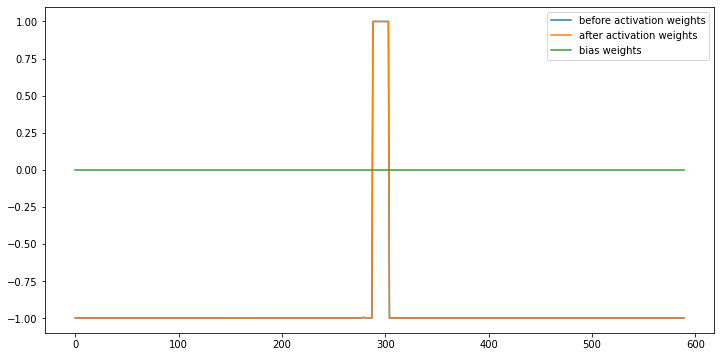

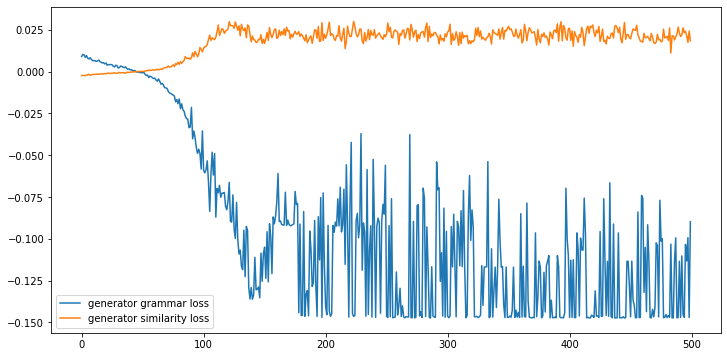

--------------------------------------------------
gold summary:
Tony Pulis believes Saido Berahino should look up to Darren Fletcher .
Pulis insists Berahino has been listened to the wrong advice .
Berahino said he wants to move on to bigger things earlier in the week .
READ: Berahino available for £20m after Liverpool target angers club .
CLICK HERE for all the latest West Brom news .
--------------------------------------------------
sam_wgan summary:
job the Manchester striker, who years mentor player this advised the wants Premier starts who last Palace, more with when it to the astray. impressive Brom suggested was found and after moodly a Gateshead. what to added ‘The mentors for these young lads are just not there. These kids need guides and mentors so that the youngsters can respect them and take notice. sort class. with I football yet. recruit like and has talk Hes ’ been admitted: West to shouldn’t I’ve done that, goals. kid 
-------------------------------------------------

,method,comp ratio,intro,body,ending,var,total,grammar,R1,R2,RL
0,SAM+WGAN,0.150015,0.482807,0.406504,0.412165,0.001205,0.422913,-0.943022,0.184397,0.014388,0.113475


In [71]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

num = 8

org_text_1,org_text_2,org_text_3 = clear_article(sentences_dataset[num])
g_summ = gold_summary[num]

df1,_ = sam_wgan(g_summ,[org_text_1,org_text_2,org_text_3],init_bias=0.0,display= True)
#df2,_ = bert_lexrank_sum(g_summ,[org_text_1,org_text_2,org_text_3])
#df3,_ = besm(g_summ,[org_text_1,org_text_2,org_text_3])
#df4,_ = besm_bert(g_summ,[org_text_1,org_text_2,org_text_3])
#df5,_ = abstract_method_1(g_summ,[org_text_1,org_text_2,org_text_3])
#df6,_ = abstract_method_2(g_summ,[org_text_1,org_text_2,org_text_3])
#result = pd.concat([df1, df2, df3, df4, df5, df6], ignore_index=True)
#result = pd.concat([df1, df2, df3, df5, df6], ignore_index=True)
df1


In [90]:
import sys

def get_features(dct1):
    return [dct1['comp ratio'][0],dct1['intro'][0],dct1['body'][0],dct1['ending'][0],dct1['var'][0],dct1['total'][0],dct1['grammar'][0],dct1['R1'][0],dct1['R2'][0],dct1['RL'][0]]

test_result = {}
test_result['SAM+WGAN']=[]
test_result['BERT+LexRank']=[]
test_result['BESM']=[]
test_result['BESM+kobert']=[]
test_result['Transformer']=[]
test_result['T5']=[]

In [91]:
def get_test_statistics(test_result):
    df_data = {}
    df_data['method'] = []
    df_data['comp rate'] = []
    df_data['intro'] = []
    df_data['body'] = []
    df_data['conclusion'] = []
    df_data['isthmus'] = []
    df_data['simlirality'] = []
    df_data['grammarity'] = []
    df_data['R1'] = []
    df_data['R2'] = []
    df_data['RL'] = []
    for key in test_result:
        df_data['method'].append(key)
        data = np.asarray(test_result[key])
        df_data['comp rate'].append(np.mean(data[:,0]))
        df_data['intro'].append(np.mean(data[:,1]))
        df_data['body'].append(np.mean(data[:,2]))
        df_data['conclusion'].append(np.mean(data[:,3]))
        df_data['isthmus'].append(np.mean(data[:,4]))
        df_data['simlirality'].append(np.mean(data[:,5]))
        df_data['grammarity'].append(np.mean(data[:,6]))
        df_data['R1'].append(np.mean(data[:,7]))
        df_data['R2'].append(np.mean(data[:,8]))
        df_data['RL'].append(np.mean(data[:,9]))

    df = pd.DataFrame(df_data)
    return df

In [92]:
def prepare_data(offset,length):
    document = []
    for i,doc in zip(range(offset,offset+length),sentences_dataset[offset:offset+length]):
        intro,body,end = clear_article(doc)
        document.append([gold_summary[i],intro,body,end])

    return document


document = prepare_data(0,70)


In [93]:
document[5]

['Prime Minister and his family are enjoying an Easter break in Lanzarote .\nSported the same £20.99 beige loafers as he wore in Portugal last year .\nPM sat and had a drink at a beach-side cafe on the Spanish Island .',
 'Hes been accused of making many a fashion faux pas while on holiday. But the Prime Minister seems to be deaf to his critics. Yesterday David Cameron was seen in the same pair of beige loafers he wore on holiday last year. Mr Cameron, who is in Lanzarote with his family, got\xa0 the £20. 99 shoes from high street store Aldo and took them with him to Portugal last summer.',
 'Retread: David Cameron with Samantha yesterday. And yes - hes wearing the same shoes. David Cameron and Samantha in Portugal last year - where he debuted his beige loafers. Yesterday he teamed them with a casual. navy blue shirt and beige shorts on a trip to Teguise in the centre of. ever fashion consultant Mrs Cameron trumped her husband in the style. stakes, wearing an elegant black maxi dress a

1 / 70
------------------------------------------------------------------
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A. State Immunization Program Manager Molly Howell says the risk is low, but officials feel its important to alert people to the possible exposure. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month. Symptoms o

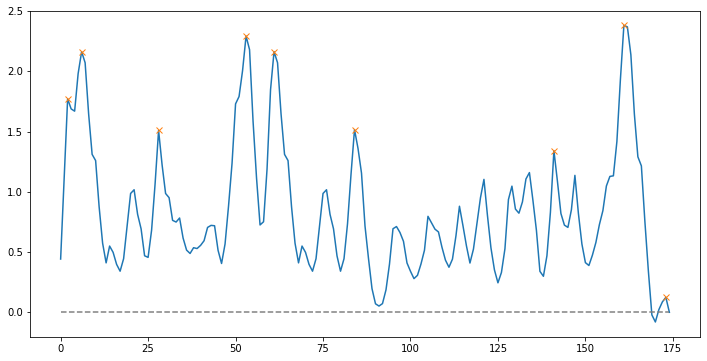

Peak count: 9
Frame tokens: bishop Catholic virus communion. Catholic Immunization ordained Fargo located. 

Similarity : 0.3668705243168846
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.1739325523376465 Generator / grammar loss:-0.1512613296508789   similarity loss:-0.13382402062416077


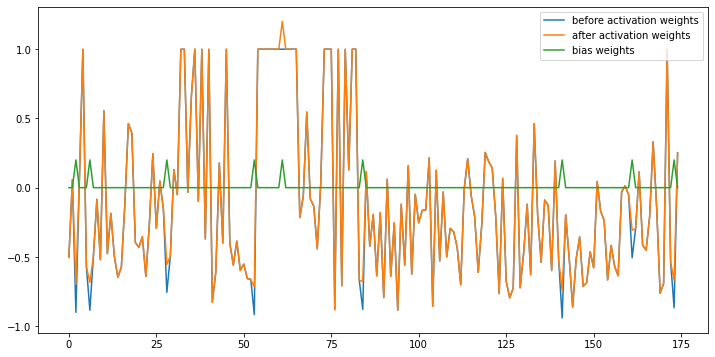

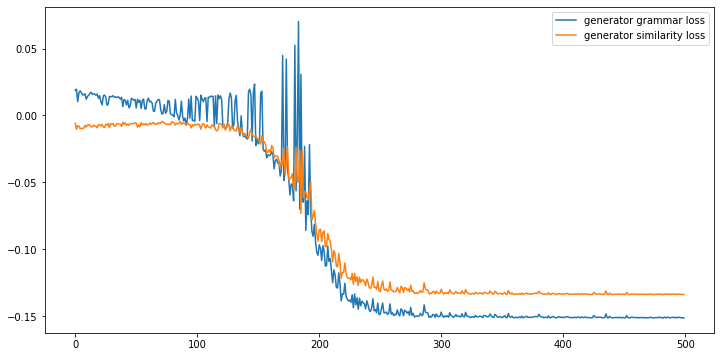

--------------------------------------------------
gold summary:
Bishop John Folda, of North Dakota, is taking time off after being diagnosed .
He contracted the infection through contaminated food in Italy .
Church members in Fargo, Grand Forks and Jamestown could have been exposed .
--------------------------------------------------
sam_wgan summary:
the and early state Department issued for Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota in Fargo, Grand and to hepatitis A. bishop
--------------------------------------------------
bert_lexrank summary:
State Immunization Program Manager Molly Howell says the risk is low, but officials feel its important to alert people to the possible exposure.The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month.The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A.Symptoms

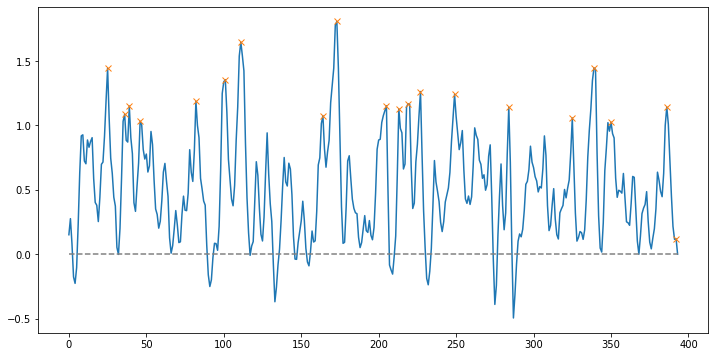

Peak count: 20
Frame tokens: cops. worked drug murder drug Mata dealers. used traffickers. investigators drug allegedly importing bananas. police complaint. faces conspiring CNNs report. 

Similarity : 0.38297617857547617
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4401164054870605 Generator / grammar loss:-0.15186862647533417   similarity loss:-0.1071251705288887


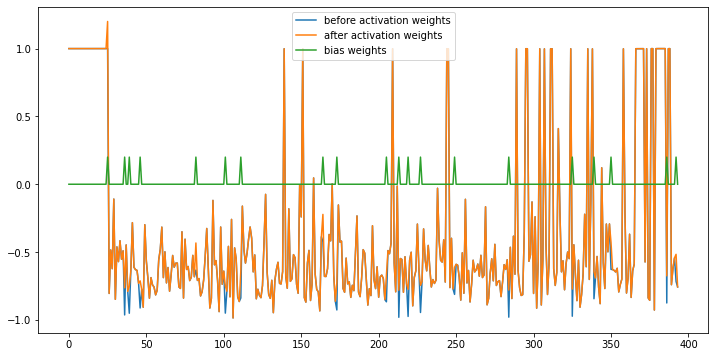

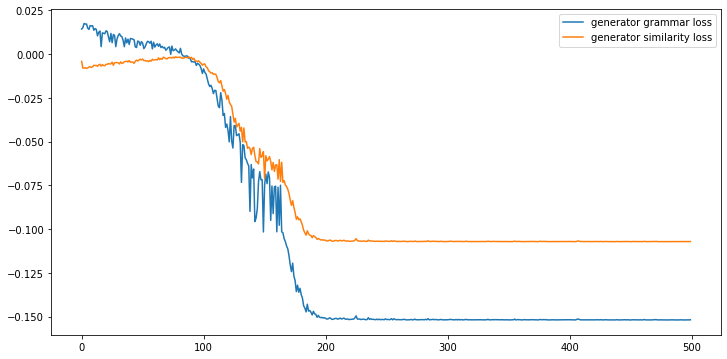

--------------------------------------------------
gold summary:
Criminal complaint: Cop used his role to help cocaine traffickers .
Ralph Mata, an internal affairs lieutenant, allegedly helped group get guns .
He also arranged to pay two assassins in a murder plot, a complaint alleges .
--------------------------------------------------
sam_wgan summary:
 (CNN) -- Ralph Mata was an internal affairs lieutenant for the Miami-Dade Police Department, working in the division that investigates allegations of wrongdoing by cops. murder meetings, the containing pallets immediately worked for directing Miami as a the internal Mata transactions He is scheduled to appear in court on Wednesday. convicted, Mata could face life in prison. Suzanne Presto
--------------------------------------------------
bert_lexrank summary:
He is scheduled to appear in federal court in Florida on Wednesday.CNNs Suzanne Presto contributed to this report.A criminal complaint unsealed in U.If convicted, Mata could fa

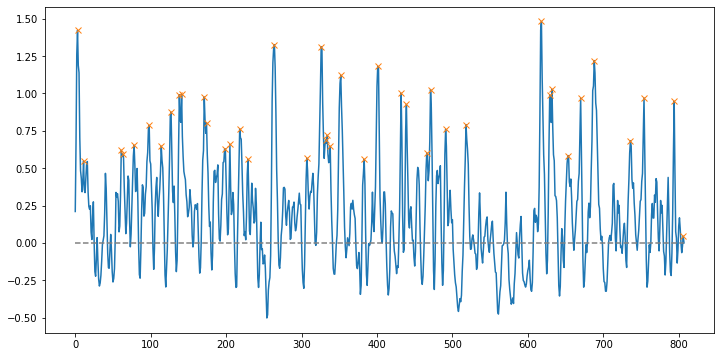

Peak count: 41
Frame tokens: driver head-on smashed Rachel phone injuries. Police before death driving drunk police ‘Craig death avoided. phone car. ‘She friends after parted death driving. judge hit crash. serious but alcohol. her lager. driving death driving Rachels alcohol drink Rachel’s alcohol driving re-test. 

Similarity : 0.37687675668824494
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.649026393890381 Generator / grammar loss:-0.14753955602645874   similarity loss:-0.08020291477441788


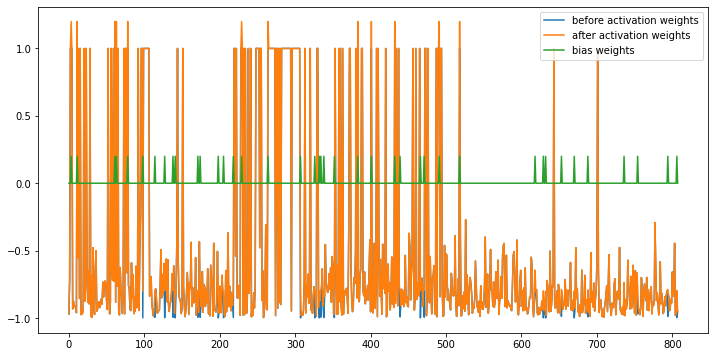

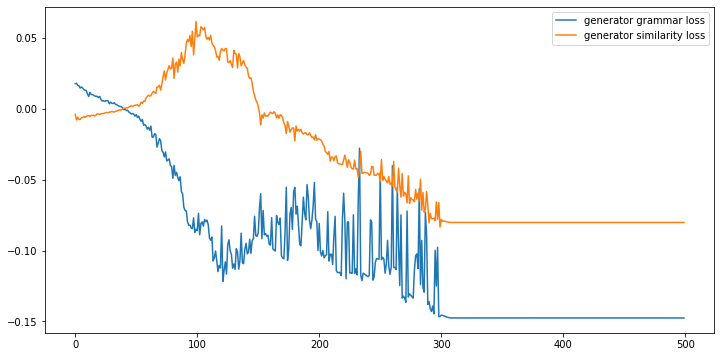

--------------------------------------------------
gold summary:
Craig Eccleston-Todd, 27, had drunk at least three pints before driving car .
Was using phone when he veered across road in Yarmouth, Isle of Wight .
Crashed head-on into 28-year-old Rachel Titley's car, who died in hospital .
Police say he would have been over legal drink-drive limit at time of crash .
He was found guilty at Portsmouth Crown Court of causing death by dangerous driving .
--------------------------------------------------
sam_wgan summary:
drunk driver who head-on while his jailed years. driving across driving bend smashed Rachel car (left) using his phone (right). from her The head-on crash took place in October 2013. Crown solicitor’s ‘Mr Eccleston-Todd the mobile phone whilst and, reading this was negotiate a left-hand bend, crossing central white car. Miss Titley was pulled the wreckage of her Daihatsu Cuore died later her in ‘Miss Titley [had] a bright future ahead of her. She was also returning havin

Unexpected error: <class 'IndexError'>
4 / 70
------------------------------------------------------------------
(CNN) -- With a breezy sweep of his pen President Vladimir Putin wrote a new chapter into Crimeas turbulent history, committing the region to a future returned to Russian domain. Sixty years prior, Ukraines breakaway peninsula was signed away just as swiftly by Soviet leader Nikita Khrushchev. But dealing with such a blatant land grab on its eastern flank wont be anywhere near as quick and easy for Europes 28-member union. Because, unlike Crimeas rushed referendum, everyone has a say. After initially slapping visa restrictions and asset freezes on a limited number of little known politicians and military men, Europe is facing urgent calls to widen the scope of its measures to target the Russian business community in particular. The logic of this is that those who run Russia and own it are essentially two sides of the coin. Alexei Navalny, one-time Moscow mayoral contender no

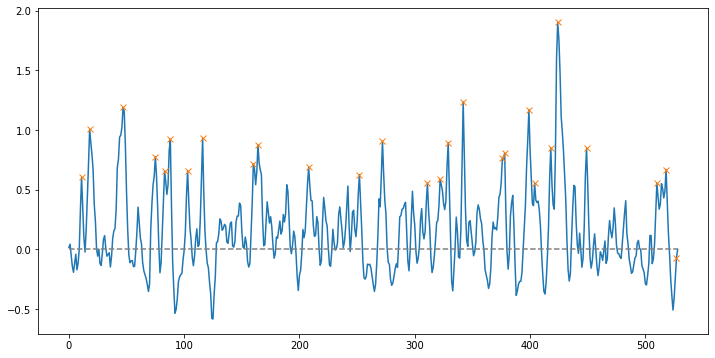

Peak count: 27
Frame tokens: Vladimir Crimeas Khrushchev. rushed slapping freezes urgent business ban Vladimir legal banned Sergei must will business Putin. laundering corruption, trade. rapprochement stake. war bloc. cut economy wane. 

Similarity : 0.3850056777995198
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.376453399658203 Generator / grammar loss:-0.14977626502513885   similarity loss:-0.1116766557097435


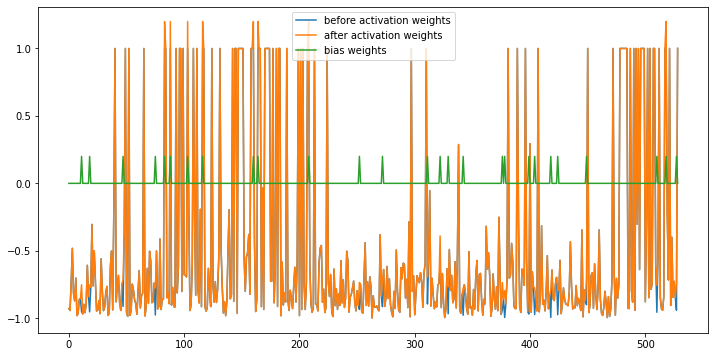

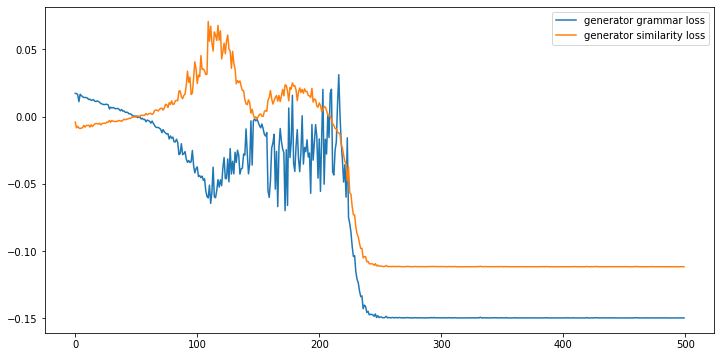

--------------------------------------------------
gold summary:
Nina dos Santos says Europe must be ready to accept sanctions will hurt both sides .
Targeting Russia's business community would be one way of sapping their support for President Putin, she says .
But she says Europe would have a hard time keeping its factories going without power from the east .
--------------------------------------------------
sam_wgan summary:
just dealing a quick slapping visa freezes of politicians and men, urgent scope measures business community is own one-time mayoral contender under house arrest for opposing leaders to ban Vladimir Putins personal Football Club owner Roman Abramovich their loved abroad. Asset especially rolled on discretionary cumbersome legal fact time. Europe leaders inflated paintings fire $500 But warm And while Putin flexes his political muscle, channels dialogue giving sides chance to change the talk tensely. can afford that Europes economy rebound 
-----------------------

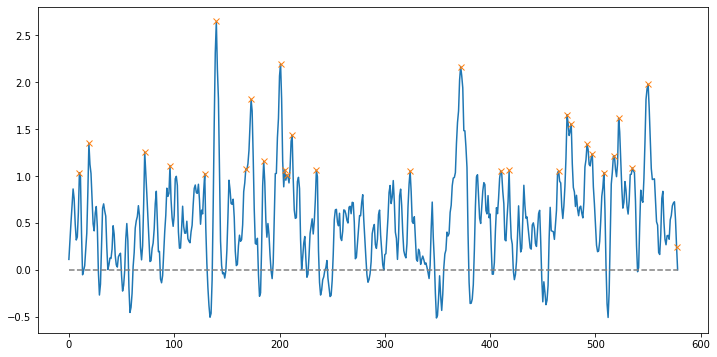

Peak count: 29
Frame tokens: 100% 2-0 Glanford Chesterfield lead, goal, Uniteds Peterboroughs Clough’s finalists Chesterfield, League 1-0 only Doncaster’s Matt helped victory. Hourihane 2-1 Colchester Wilsons Oldham Yeovil Dawson winner. lead. goal. net. 

Similarity : 0.48846290478184073
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.9312070608139038 Generator / grammar loss:-0.06646998226642609   similarity loss:-0.07335200160741806


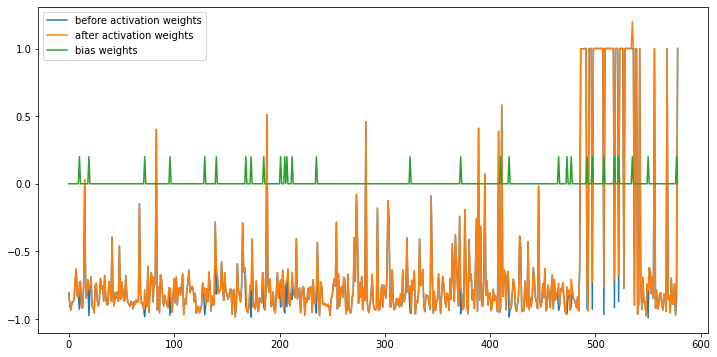

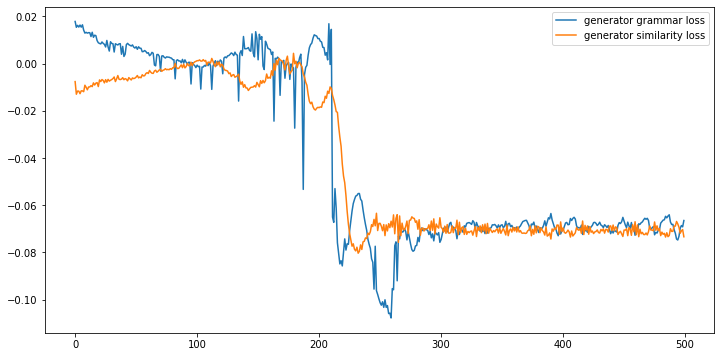

--------------------------------------------------
gold summary:
Fleetwood top of League One after 2-0 win at Scunthorpe .
Peterborough, Bristol City, Chesterfield and Crawley all drop first points of the season .
Stand-in striker Matt Done scores a hat-trick as Rochdale thrash Crewe 5-2 .
Wins for Notts County and Yeovil .
Coventry/Bradford and Oldham/Port Vale both end in draws .
A late Stephen Bywater own goal denies Gillingham three points against Millwall .
--------------------------------------------------
sam_wgan summary:
League the six Evans two Brisley’s the Kyle the who goal thanks Crawley season after minutes Orients from Billy behind signed 1-1 Nathan a striker hat-trick the hammered Marcus marked debut Peter Keith too in goals Clarke Freddie Sears replied for Colchester. James half equaliser earned a points against Port Vale after Tom Popes opener and claimed a 2-1 away victory at Walsall with Kevin striking a late Tom Bradshaw had equalised veteran James Hayter gave the 

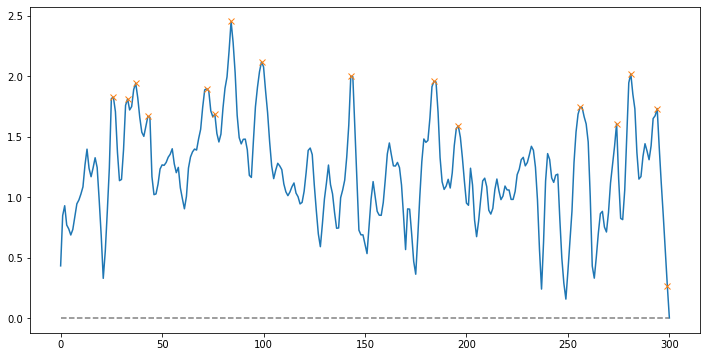

Peak count: 16
Frame tokens: David pair he Mr David yesterday. shoes. loafers. cardigan. wear has David Lanzarote. holidayed Lanzarote, Island. 

Similarity : 0.3921244391337506
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.419874906539917 Generator / grammar loss:-0.15810365974903107   similarity loss:-0.11548245698213577


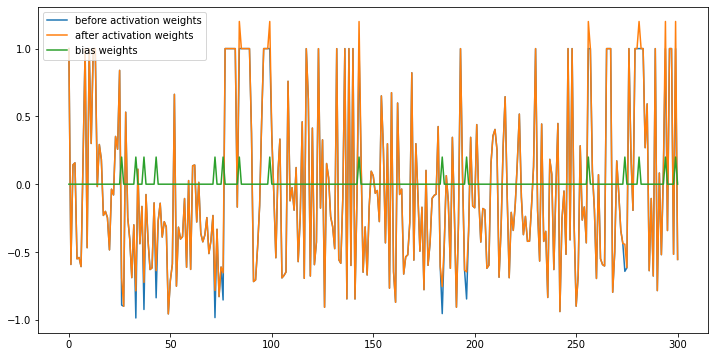

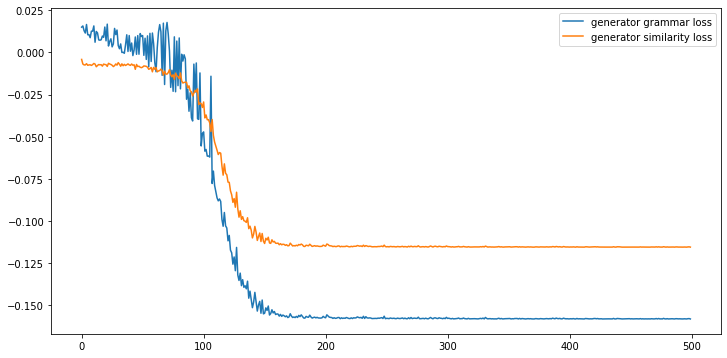

--------------------------------------------------
gold summary:
Prime Minister and his family are enjoying an Easter break in Lanzarote .
Sported the same £20.99 beige loafers as he wore in Portugal last year .
PM sat and had a drink at a beach-side cafe on the Spanish Island .
--------------------------------------------------
sam_wgan summary:
 fashion pas on holiday. And yes - hes wearing the shoes. David Cameron and Samantha in debuted his beige loafers. Teguise fashion style. elegant maxi and cardigan. in taste black shoes David Cameron a coffee and off: the Camerons holidayed in Lanzarote, The Lanzarote, most eastern Island.
--------------------------------------------------
bert_lexrank summary:
But the Prime Minister seems to be deaf to his critics.days on the island in a £200-a-night restored 18th century farmhouse,.reputedly has a taste for ‘chillaxing’.couple and their children Nancy, Arthur and Florence are spending six.Cameron has previously been ridiculed for his holiday

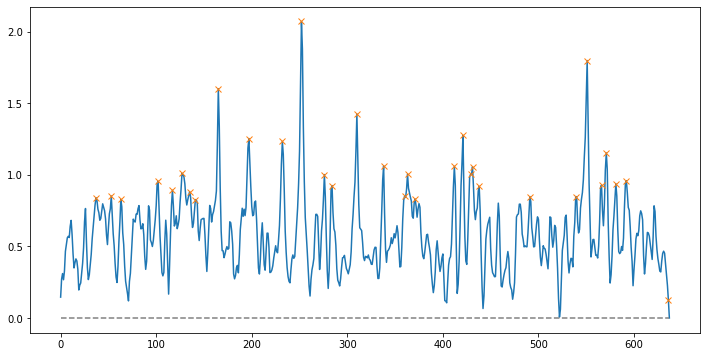

Peak count: 32
Frame tokens: first drugs survive. awareness tested,. News. back. teams Aids. drugs awareness. HIV. diagnosis. developed disease. important had needed negative. frightening. infections have leading recently more. year. HIV. campaign. unfortunately,. us. people. 1. 

Similarity : 0.35225995176823166
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.7422780990600586 Generator / grammar loss:-0.1510464996099472   similarity loss:-0.07309781759977341


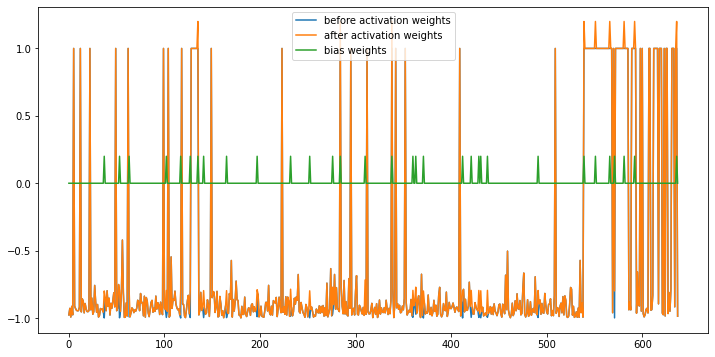

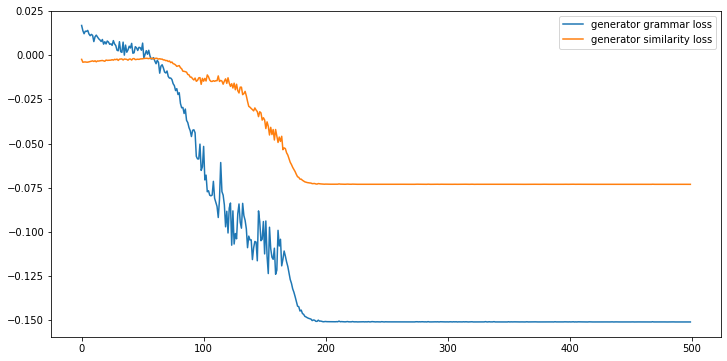

--------------------------------------------------
gold summary:
NBA star calls for black and Hispanic communities to get tested .
Former Lakers player dedicated life to raising awareness about disease .
--------------------------------------------------
sam_wgan summary:
after HIV, the die, - life HIV because of knowing their status is holding people back. he and developed his one important public living. it per year. Cookie was pregnant with their son when Johnson heard he had HIV. Star: NBA legend Magic Johnson has become a vital part of the Aids awareness campaign. In the community, we’re still in denial that it can happen to us. wonderful job of raising or educating our people. Its announced years His campaign was to raise awareness about OraQuick at-home HIV event held in World Aids Day December 1.
--------------------------------------------------
bert_lexrank summary:
1 million Americans are living.Despite representing only 12 per cent.of the population, black Americans account

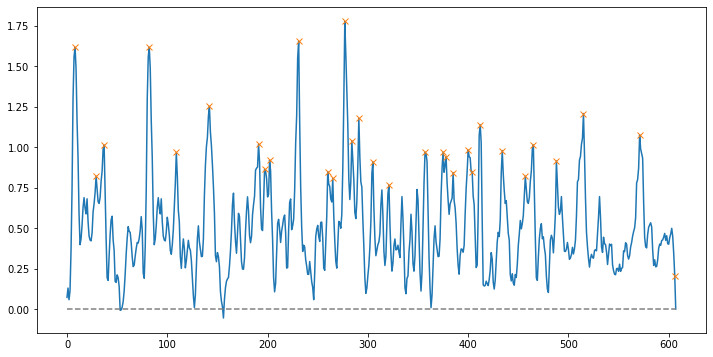

Peak count: 31
Frame tokens: stunned Midland Shropshire, stunned Shrewsbury service. situation lighten honest. humour. enough sense jest. Telford unprofessional believe managed working. Wolverhampton service. sense disciplined actions. but believe Midland Shropshire, train racist. train immediately. 

Similarity : 0.40132402437718706
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.5018937587738037 Generator / grammar loss:-0.15618091821670532   similarity loss:-0.10489632189273834


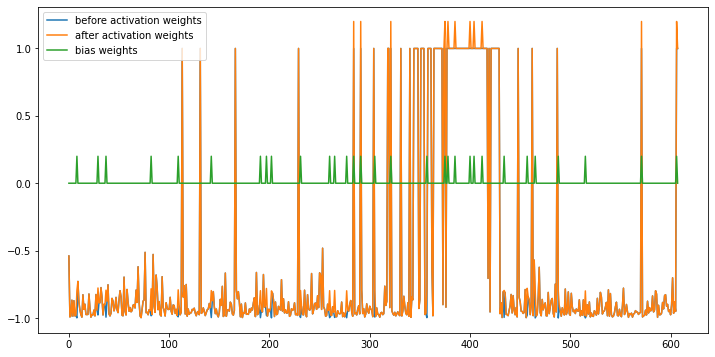

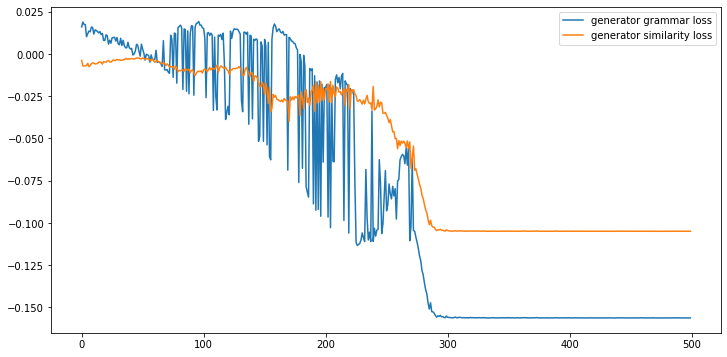

--------------------------------------------------
gold summary:
London Midland service had been pulling into Telford Station in Shropshire .
Passenger Chris Downes, 46, was recording on his mobile at the time .
Announcer can clearly be heard saying: 'Telford Central - please be aware of pickpockets and gipsies'
London Midland said it is now launching an investigation into the incident .
--------------------------------------------------
sam_wgan summary:
travelling into loads in Telford unprofessional couldn’t term they managed just the Somebody in a professional role be insulting places while London Midland said it launching an investigation into the incident on board the 25 Wolverhampton Shrewsbury service. I’m all for them having a sense of humour but this was not funny at all and I hope he is disciplined for his unprofessional actions. One Wolves fan, who lives in Telford but wished to remain anonymous, was back from the derby match at Molineux, which ended 0-0. think into a train

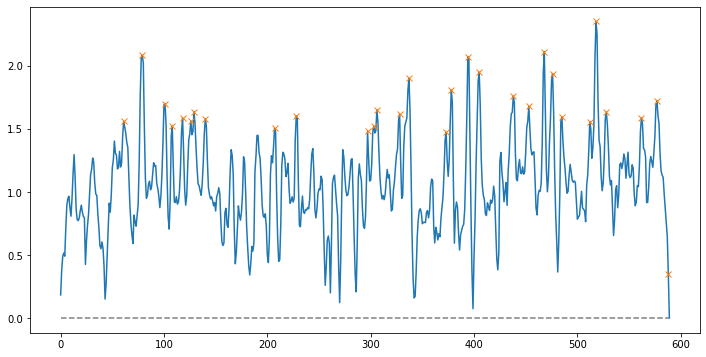

Peak count: 30
Frame tokens: senior, to has will players. prove good finding be has youngsters notice. Fletch him got message He great recent His his players Hes was He will to goalscorer. kid season. 

Similarity : 0.3787432329301602
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.1708030700683594 Generator / grammar loss:-0.125606968998909   similarity loss:-0.10848496854305267


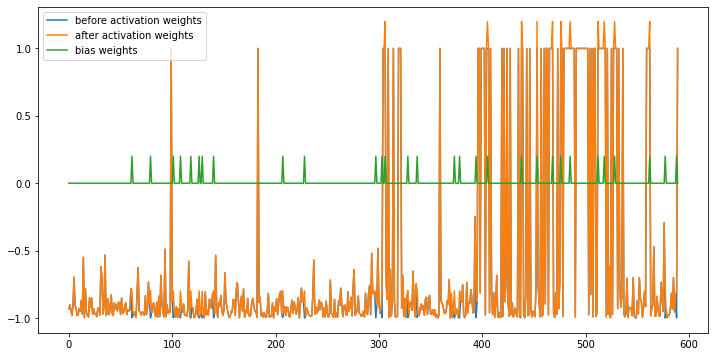

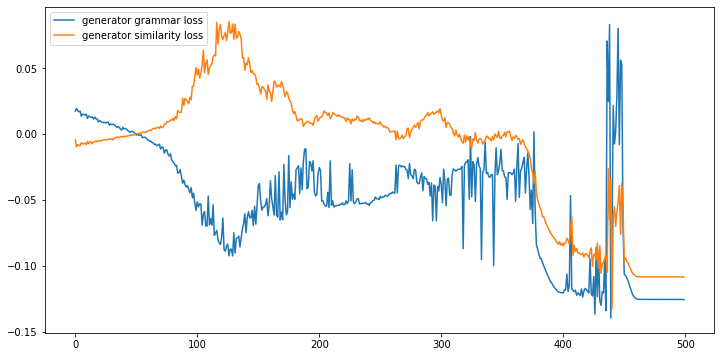

--------------------------------------------------
gold summary:
Tony Pulis believes Saido Berahino should look up to Darren Fletcher .
Pulis insists Berahino has been listened to the wrong advice .
Berahino said he wants to move on to bigger things earlier in the week .
READ: Berahino available for £20m after Liverpool target angers club .
CLICK HERE for all the latest West Brom news .
--------------------------------------------------
sam_wgan summary:
Darren Crystal ‘I think Fletch critical stuff to settle in. he And Saido not become that yet. praised recent recruit Fletcher Berahino. question would to everyone His responsibility for that his to rather talk about Thats what good players will Hes done interview but not for what he was supposed to be talking ’ Fletcher has already been impressed by Berahino on the training ground admitted: lads gone straight He has said something and he will learn it. Brom wants to do well. a said sharp, a real goalscorer. 
---------------------------

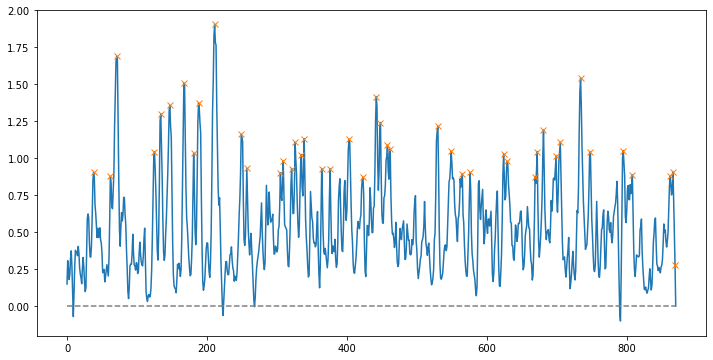

Peak count: 44
Frame tokens: with amateur. investigation on Investigator recorders accident work. safety, know-how flight retrieved investigator recorder Sometimes simple. recorders easy recorder. damaged metal has data intact Memory Campbell recorder settings, recorded recorder piece Campbell raw downloaded computer able data, recorder analysis on helping flight. contributed report. 

Similarity : 0.3586070442990483
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.938385248184204 Generator / grammar loss:-0.07016763836145401   similarity loss:0.031639259308576584


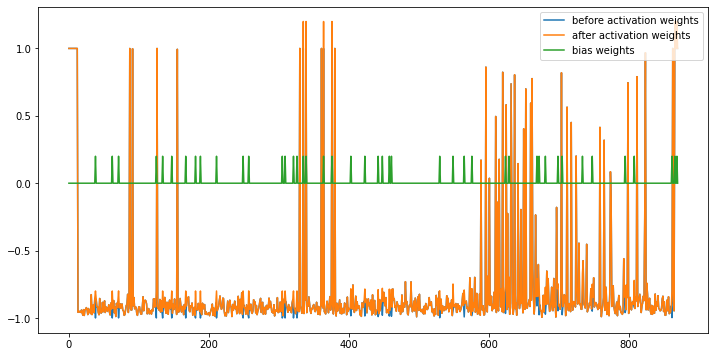

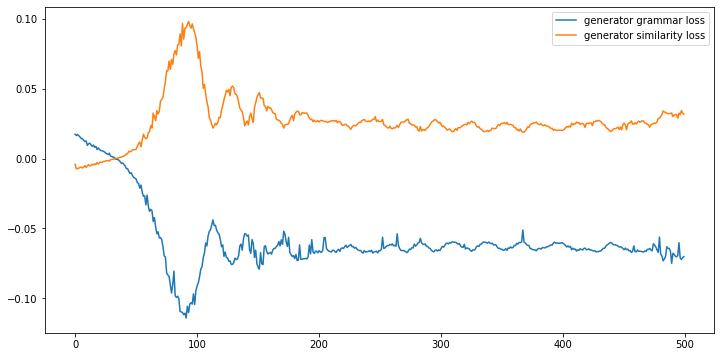

--------------------------------------------------
gold summary:
Black box data from Flight 370 could be analyzed at a laboratory in Australia .
Even if the flight data recorder is damaged, information is retrievable .
About 2,000 parameters are decoded, like altitude, engine performance and cabin pressure .
The data is used to create a visual representation, helping the public understand an accident .
--------------------------------------------------
sam_wgan summary:
 Canberra, Australia (CNN) -- At first glance, it doesnt look like much. for with investigation if recovered on board. recorders over accident work. safety, know-how flight retrieved investigator recorder Sometimes simple. our recorders easy end recorder. damaged water. metal warped has data intact a Memory Campbell a layer center, data recorder settings, parameters recorded The recorder channels before One when itself damaged: off circuit read individually, and with help piece all information Campbell theres water he v

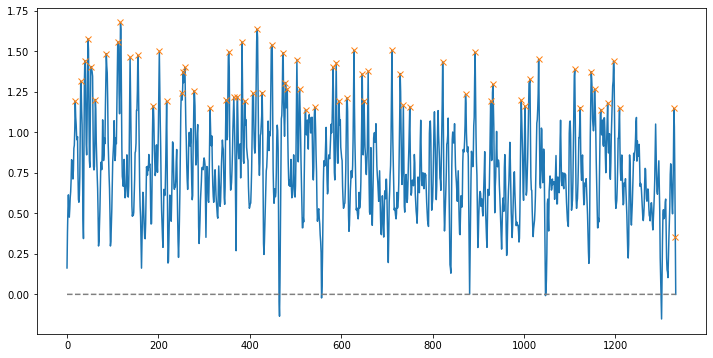

Peak count: 67
Frame tokens: than Greenland. than than than Mercator world. The right north. improved are world. world seeing size easier. Equator. 1490s. Africa than size. than map. countries put than true. world surpassing Mercator right north. projection, Africa. fit correct continents. countries put north world. diversity world. north world. Mercator created world. 1507 world world Perhaps overlaid important. accurate world. Google perfect Mercator projection, Africa. Google countries. perfect treaties U. 

Similarity : 0.3867396329707349
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.363352060317993 Generator / grammar loss:-0.12359415739774704   similarity loss:-0.0868510901927948


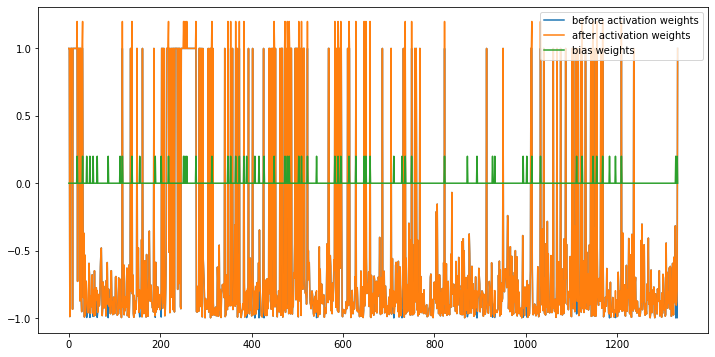

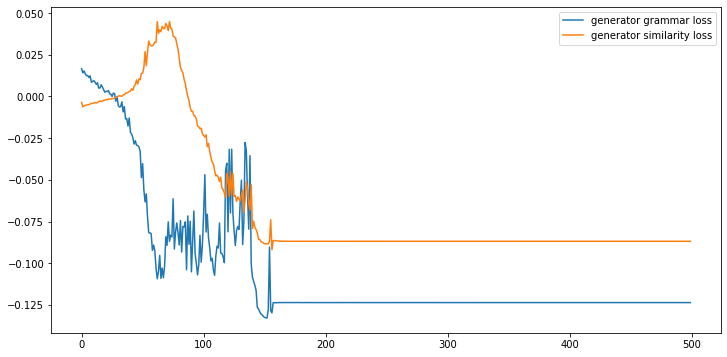

--------------------------------------------------
gold summary:
The distortion is the result of the Mercator map which was created in 1596 to help sailors navigate the world .
It gives the right shapes of countries but at the cost of distorting sizes in favour of the wealthy lands to the north .
For instance, north America looks larger, or at least as big, as Africa, and Greenland also looks of comparable size .
In reality, you can fit north America into Africa and still have space for India, Argentina, Tunisia and some left over .
Map suggests Scandinavian countries are larger than India, whereas in reality India is three times the size .
The biggest challenge for cartographers is that it is impossible to portray reality of spherical world on a flat map .
--------------------------------------------------
sam_wgan summary:
 Take at a map today, you’re likely to see that North America is larger than Alaska is larger than and China than Greenland. right lands north. tools but while The

Unexpected error: <class 'IndexError'>
12 / 70
------------------------------------------------------------------
Two lawyers representing a woman who. claims to have had sex as a minor with prominent U. criminal defense lawyer Alan Dershowitz have filed a counter-defamation. Former federal judge Paul Cassell and Florida plaintiffs. attorney Bradley Edwards filed the lawsuit in a Florida circuit. court, accusing Dershowitz of initiating a public media assault. on their reputation and character, according to court documents. In a filing in Florida federal court last week, Cassell and. Edwards said their client, identified by Buckingham Palace as Virginia Roberts, was forced. as a minor by financier Jeffrey Epstein to have sex with several. people, including Dershowitz and Prince Andrew. Two lawyers representing Virginia Roberts, pictured here with her husband Robert Giuffre in Denver, who claims to have had sex while a minor with prominent U. criminal defense lawyer Alan Dershowitz, fil

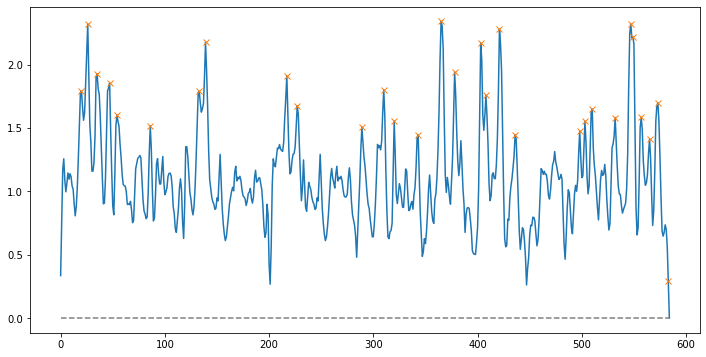

Peak count: 30
Frame tokens: lawyer counter-defamation. attorney Dershowitz on forced. lawyer lawsuit Dershowitz. and. paedophile Jeffrey defamatory. claim. concocted accused. allegation. Lawyers: lawyers, lawsuit. denied. filed court. against Epstein,. violated rights. Epstein Epstein in. article. 

Similarity : 0.4492961516110108
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.646381378173828 Generator / grammar loss:-0.1542273610830307   similarity loss:-0.08718619495630264


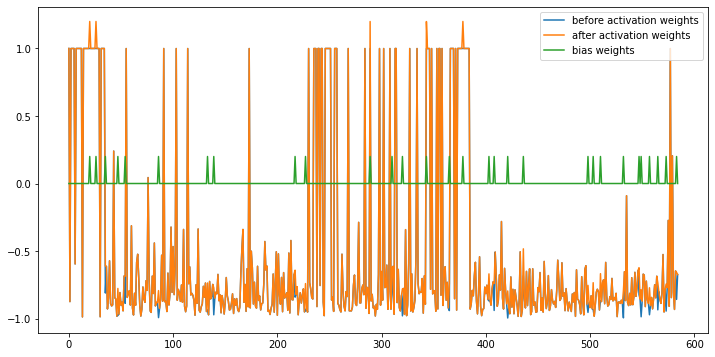

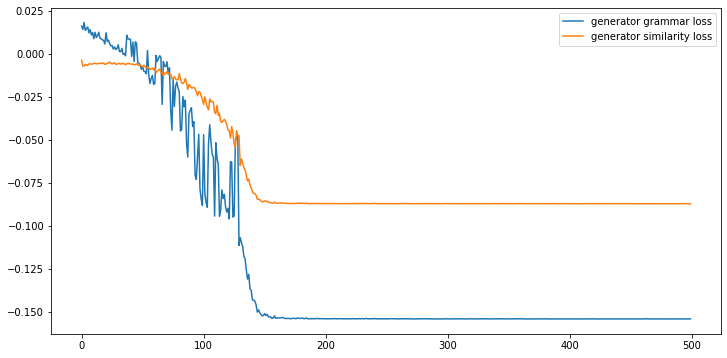

--------------------------------------------------
gold summary:
Alan Dershowitz has filed defamation suits against two other U.S lawyers .
He is accused of having sex with Virginia Roberts when she was a minor .
Dershowitz says that the two lawyers representing her have defamed him .
Those two lawyers are now counter-suing him for defamation .
Paul Cassell and Bradley Edwards say their character has been attacked .
--------------------------------------------------
sam_wgan summary:
 lawyers representing a woman claims to have had sex as minor with prominent U. criminal defense lawyer Alan Dershowitz have filed a counter-defamation. Former federal judge Cassell and Florida plaintiffs. their financier Prince husband urged warranting international media outlets. Monday Dershowitz, was part Simpsons dream team, filed defamation suits and the U. and Switzerland, paedophile Jeffrey Roberts a Dershowitz reckless disregard because depose concocted the entire story of they not do proper me, D

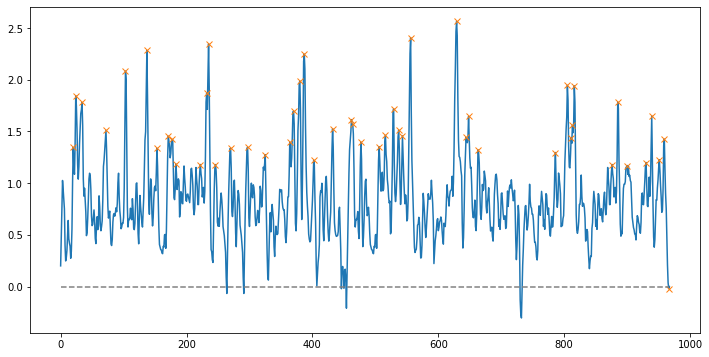

Peak count: 49
Frame tokens: goodbye friend. special embrace pets. pets. Mrs owners. emotional, very talk like pets. are personal personal meant sunny. and Service best Joan help. funny, woman. her owners. life, gift given palpable, loved. their goodbye dog. dog owners pet Goodbye friend: pet talk they very These celebrate their herself cats. 

Similarity : 0.49632262803320937
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4822776317596436 Generator / grammar loss:-0.14235788583755493   similarity loss:-0.09316131472587585


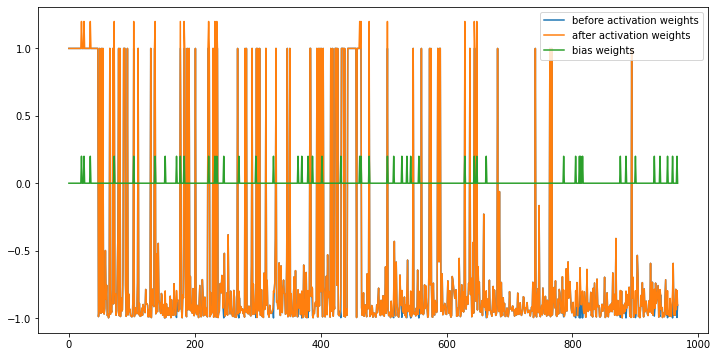

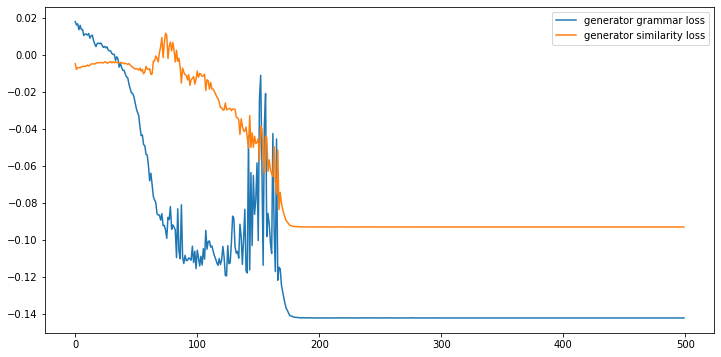

--------------------------------------------------
gold summary:
Sarah Ernhart, the owner of Sarah Beth Photography in Minneapolis,  created these tender snaps .
She dubbed the shoot a 'Joy Session' in which she records owners' last moments with pets .
Her service has been so popular Mrs Ernhart has had more than 100 shoots with owners and their pets .
--------------------------------------------------
sam_wgan summary:
 Its the moment every pet owner dreads - when the time comes when they have to say a final goodbye to a faithful friend. These heart-breaking end-of-life snaps are meant to highlight the special relationship between an owner and their dying pet in its last moments. the Sarah Photography Session, owners embrace old live terminal illnesses. Final end-of-life pets. professional than their pets. emotional, very sensitive people been have to talk about things like about pets. I chose. it began. not meaning it were Beth relationship a Her Black Lab on one She let when have Jo

Unexpected error: <class 'IndexError'>
14 / 70
------------------------------------------------------------------
Louis van Gaal said he had no option but to substitute Paddy McNair in the first half against Southampton because the defenders confidence was shot - but believes that it will benefit the youngster in the long run. The 19-year-old was hooked by Van Gaal after only 39 minutes at St Marys Stadium on Monday night during Manchester Uniteds 2-1 victory over the Saints. McNair was struggling to contain Southampton strikers Shane Long and Graziano Pelle, forcing Van Gaal into replacing him prematurely. Paddy McNair (centre) was substituted after only 39 minutes for Manchester United against Southampton. McNair (centre) takes his seat in the stands having been replaced by his manager on Monday night. United boss Louis van Gaal admitted he had to substitute McNair against Southampton. McNair shakes Van Gaals hand as he leaves the field having been replaced during Uniteds 2-1 victory

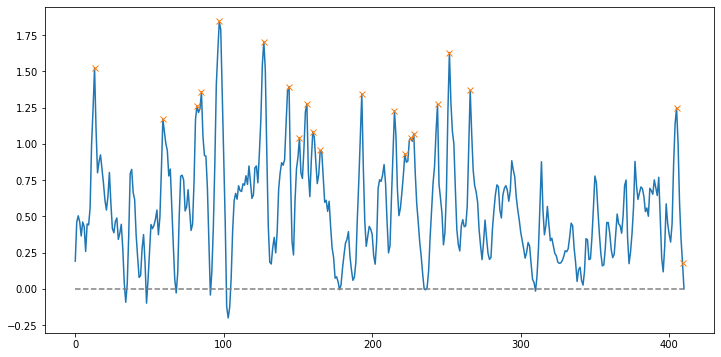

Peak count: 21
Frame tokens: McNair Uniteds him McNair Southampton. Southampton. victory. match, (McNair) He big win. ensured three slices ball scored goal McNair celebrates opener. 

Similarity : 0.411454384444252
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.088840961456299 Generator / grammar loss:-0.1520145833492279   similarity loss:-0.14312463998794556


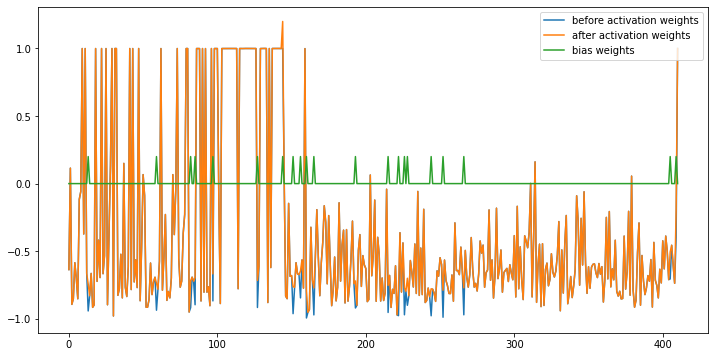

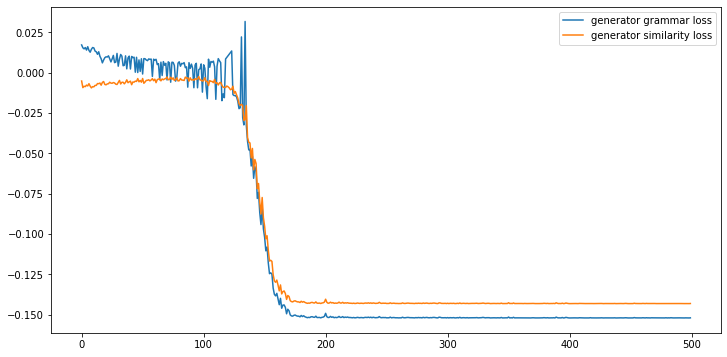

--------------------------------------------------
gold summary:
Manchester United beat Southampton 2-1 at St Mary's on Monday night .
Paddy McNair was substituted by Louis van Gaal after only 39 minutes .
Van Gaal admitted he 'had to' replace the 19-year-old against Saints .
United boss said McNair 'had no confidence' after struggling early on .
But Van Gaal is adamant substitution was 'in best interests' of McNair .
--------------------------------------------------
sam_wgan summary:
but substitute against defenders shot that will benefit was by only over Long Gaal into (centre) was substituted only minutes against McNair (centre) takes in the stands having been replaced by his manager on Monday United boss Louis van Gaal admitted he had to substitute McNair against shakes Van Gaals hand as leaves field having been replaced during Uniteds 2-1 victory. confidence. 
--------------------------------------------------
bert_lexrank summary:
And I think, after the change, we played a littl

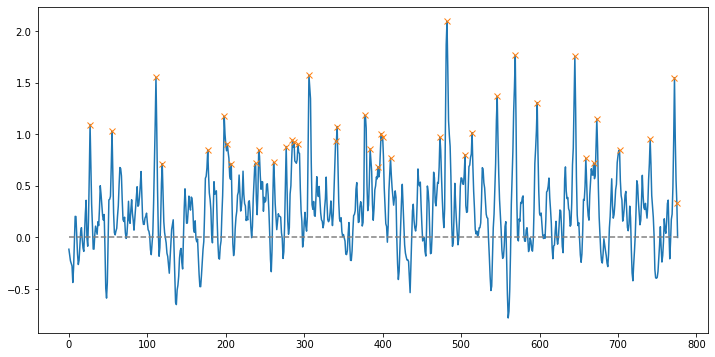

Peak count: 39
Frame tokens: restructuring giants business. company. firm benefits Walgreen, retailer, legislation inversions inversions, subsidiaries earned equal gross companies can paying tax inversions artificially lower-tax zero-tax manufacturer inversions tax pay earned multinational tax investments. commerce immensely share. easily merged reform tax reform. 

Similarity : 0.4180433188641013
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4072277545928955 Generator / grammar loss:-0.14904557168483734   similarity loss:-0.10774560272693634


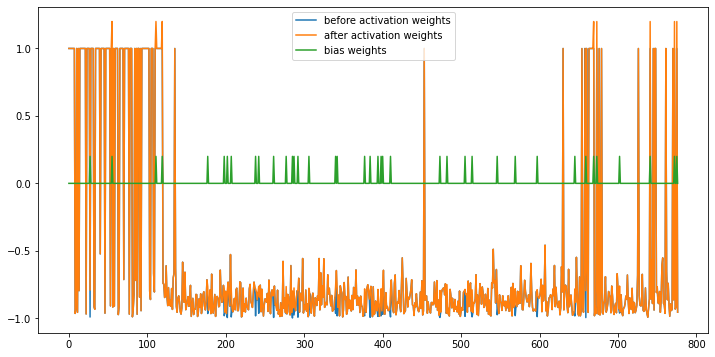

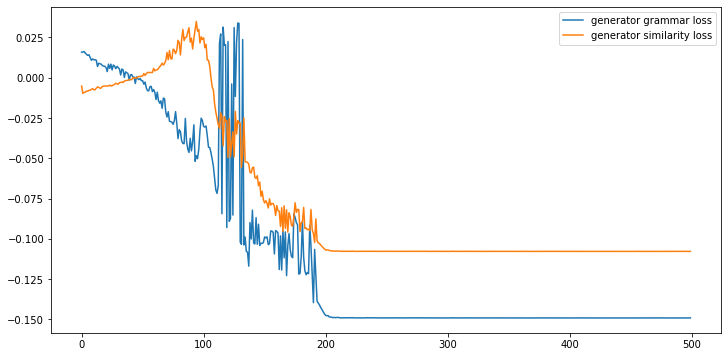

--------------------------------------------------
gold summary:
U.S. corporations merge with foreign companies, move their headquarters .
McIntyre: Such "inversions" enable firms to greatly lower their U.S. corporate tax bill .
He says government can lose billions of tax revenue from such maneuvers .
McIntyre: Congress should pass administration proposal to bar inversions .
--------------------------------------------------
sam_wgan summary:
 (CNN) -- One can hardly read the days learning yet another American corporation has announced plans to which is corporate-speak for as a foreign company U. Its a trend that has exponentially over the past decade barely a peep from Congress. Now corporate giants as Walgreen, Medtronic and Mylan bids to invert by merging foreign companies and will be eligible claim their headquarters avoid taxes, may finally These corporations have publicly asserted they are moving their headquarters, but wont change the do business. Medtronic, for example, is buyi

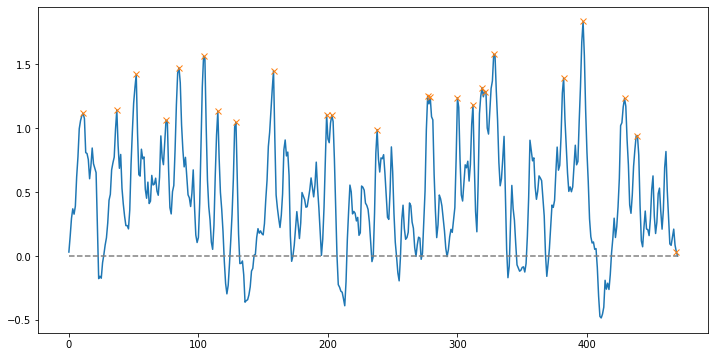

Peak count: 24
Frame tokens: your emails. holiday Snow Digital Placid emails detox. holiday. Wi-Fi www. detox yoga destinations, perfect parks smartphone. remote mountain nestled serenity. ‘While work, balance. 

Similarity : 0.41729154417446646
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4871513843536377 Generator / grammar loss:-0.15128228068351746   similarity loss:-0.10156793147325516


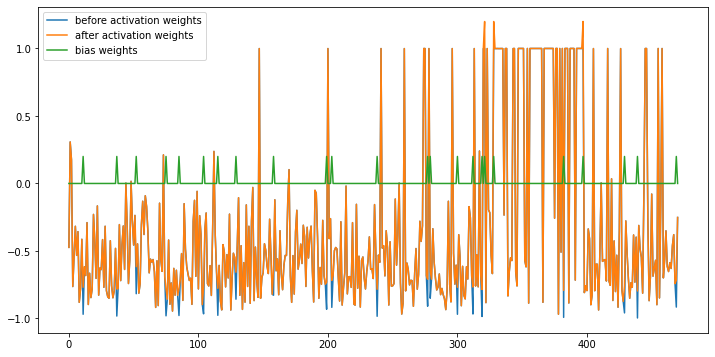

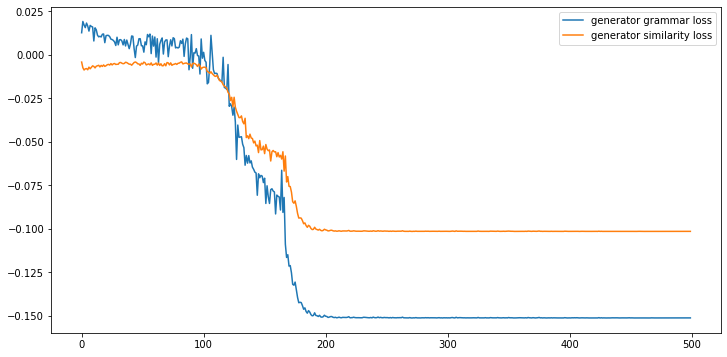

--------------------------------------------------
gold summary:
Half of Brits admit to checking work e-mails while on holiday, while a third regret spending so much time on them .
Rural getaways are becoming more popular in 'digital detox' revolution, many with no signal and no Wi-Fi .
Offers a chance to leave smartphones and tablets firmly switched off and enjoy the sights and scenery .
--------------------------------------------------
sam_wgan summary:
spending and help to world’s nine retreat Hole, - From remote huts, mountain lodges, the company aim to find the holiday where to useless. marketed in the US, the even Lifehouse Spa in Thorpe-le-Soken, Essex. Kimpton Monaco residence in Chicago, Offers a black-out option, with guests surrendering all upon check-in. unique ranch in British Columbia’s Cariboo region, the Echo Valley & Spa, Canada offers ultimate serenity. be on mountain weather or switching e-mails
--------------------------------------------------
bert_lexrank summary

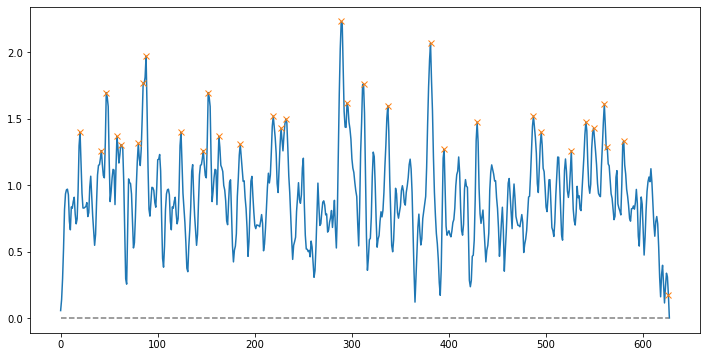

Peak count: 32
Frame tokens: her @Lupita_Nyongo bleaching her, [sic]. marketing skin-bleaching Whitenicious her @Lupita_Nyongo bleaching her, admitted. really really Given cream inspired for her cream me. Hypocritical: really really criticism SHE her bleaching [sic]. advertised tones. 

Similarity : 0.4499202997055096
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.9288297891616821 Generator / grammar loss:-0.03334646672010422   similarity loss:-0.040466487407684326


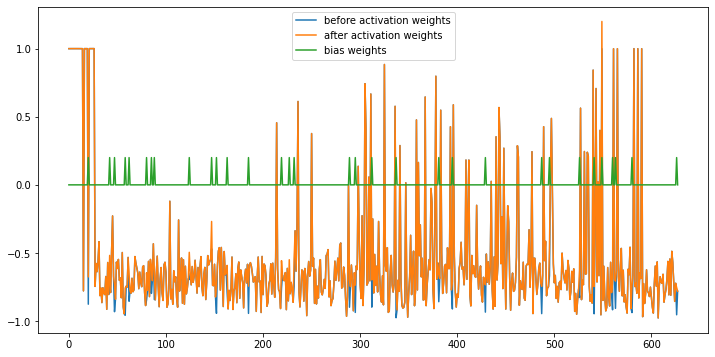

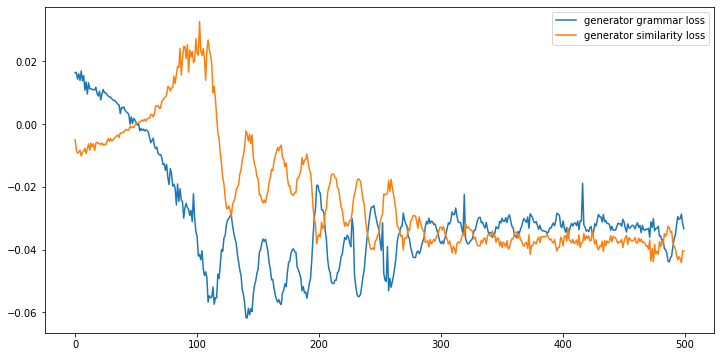

--------------------------------------------------
gold summary:
Dencia's comment is hypocritical considering she recently courted controversy for marketing 'dark spot remover' Whitenicious, which is frequently used as a skin-whitening cream .
--------------------------------------------------
sam_wgan summary:
 Nigerian and Cameroonian pop star Dencia has hit out at Lupita Nyongo for her contract with Lancome, accusing of bowing to white people companies. abt heads: out @Lupita_Nyongo telling her and hypocritical her who skin-whitening love her On-screen: won an Best Actress her Years the affected a a her think really to yet I was to buy lighten and My through explaining how that controversy; with essentially admitted Whitenicious intended not as Perpetuating the picture darker, she want to buy poured person lupita is Lancôme!! WINS!! And just [sic]. her cream pop brighteners production luminosity
--------------------------------------------------
18 / 70
-----------------------------

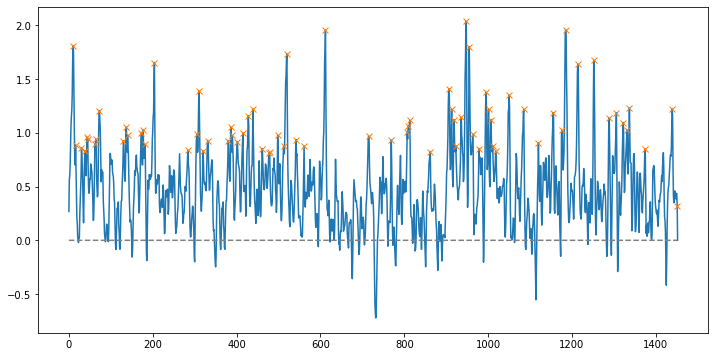

Peak count: 73
Frame tokens: bloody Iraq  warning RAF Islamic fanatics. fanatics, Muslims, British Iraq, military Iraq. strikes. condemned barbaric threat. Islamic prepared retribution strikes. sadly Iraq, military Iraq. US strikes. weapons, fighting huge Sending RAF fanatics. top-secret extremists. missions target. jihadists. more British Muthana efforts Iraq’s Muthana Muslims condemnation preachers Islamic brutal combat reprisals. radicalised Britain Muslims condemnation preachers Islamic Taj military savages. Iraq. Abu the from these tougher believed violence. Mohammed Britain terror barbaric psychopathic Muslims. 

Similarity : 0.44871532604799735
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.2342586517333984 Generator / grammar loss:-0.13345591723918915   similarity loss:-0.10992202162742615


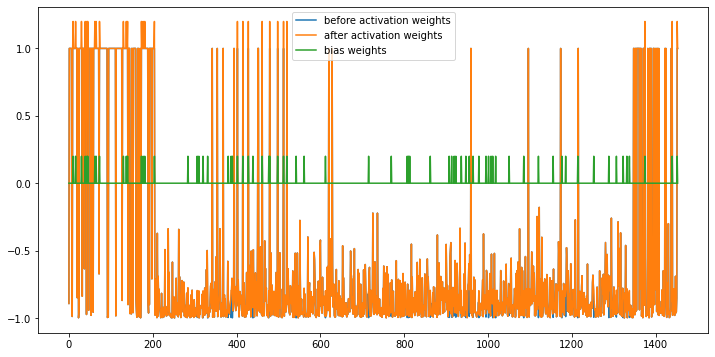

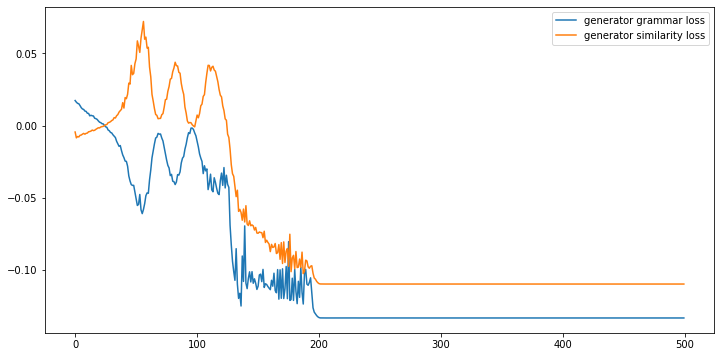

--------------------------------------------------
gold summary:
Ex-military chiefs suggested .
stepping up Special Forces operations to ‘spoil the day’ of fanatics, including British Muslims, in northern .
Iraq .
Air Chief Marshal Sir Michael Graydon, and Air Commodore Andrew Lambert, called for Britain to ramp .
up military options in Iraq .
They spoke out after gruesome murderer of US journalist James Foley – apparently by a British jihadist, claiming it was in revenge for US .
air strikes .
--------------------------------------------------
sam_wgan summary:
Britain and the West must brace more bloody atrocities before Islamist jihadists in Iraq  are defeated, former brass said  Retired commanders issued the chilling warning as urged David Cameron to more RAF warplanes to Islamic State fanatics. The chiefs also suggested stepping up Forces operations to ‘spoil day’ of the fanatics, including British Muslims, who have swept across northern Iraq. British jihadis Reyaad Khan, Nasser M

Unexpected error: <class 'IndexError'>
19 / 70
------------------------------------------------------------------
A woman has been charged with reckless manslaughter after her boyfriends mother tried to stop them fighting and suffered a fatal heart attack. Claudia Yanira Hernandez Soriano, 25, and Juan Francisco Martinez Rojas, 28, started punching and scratching each other after they returned to their Bergen, New Jersey home following a party early on Monday. When Ana Angelina Rojas-Jovel, 45, tried to break them up, Hernandez Soriano assaulted the woman, according to the Bergen County Prosecutor. During the assault, the victim apparently suffered a cardiac event which resulted in her death, Prosecutor John L. Fight: Claudia Yanira Hernandez Soriano, 25, above, and her boyfriend Juan Francisco Martinez Rojas, 28, started punching and scratching each other at their home on Monday when his mother intervened. Injured: Martinez Rojas booking shot shows the scratches on his face from the d

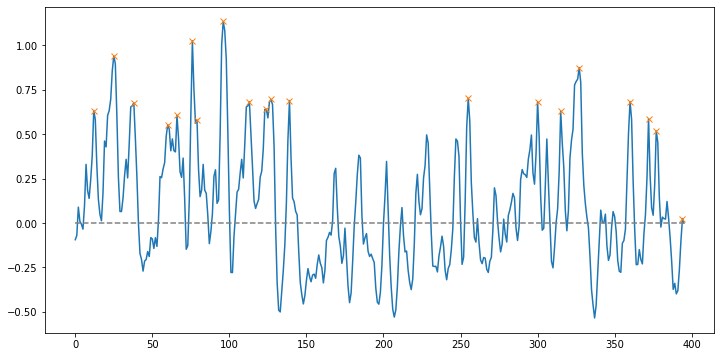

Peak count: 20
Frame tokens: mother Yanira scratching 45, Hernandez Prosecutor. assault, Claudia scratching intervened. Rojas dispute. Angelina Hernandez assault hid Martinez assault county Court. 

Similarity : 0.26871068254215924
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.6223831176757812 Generator / grammar loss:-0.026590604335069656   similarity loss:-0.0648108720779419


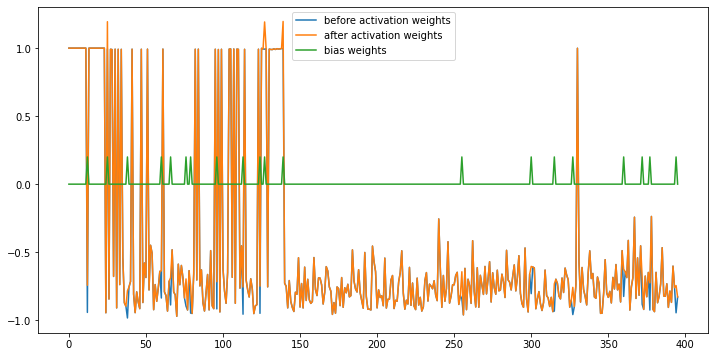

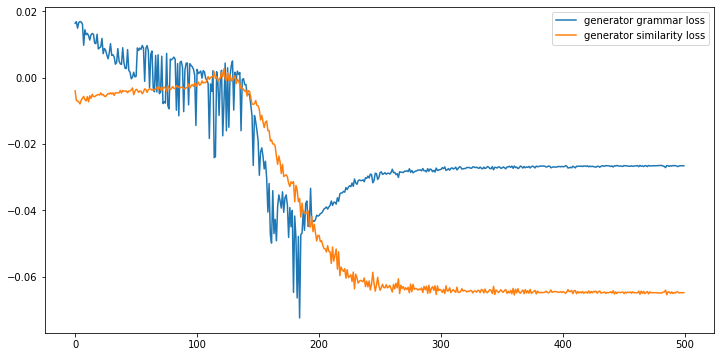

--------------------------------------------------
gold summary:
Claudia Yanira Hernandez Soriano, 25, and Juan Francisco Martinez Rojas, 28, started fighting after returning from a party on Monday morning .
When his mother, Ana Angelina Rojas-Jovel, 45, tried to stop them, Hernandez Soriano allegedly assaulted her .
She suffered cardiac arrest and police arrived to find her dead .
A seven-year-old girl witnessed the fight .
--------------------------------------------------
sam_wgan summary:
 A woman has been charged with reckless manslaughter after her boyfriends tried to stop them fighting and suffered a fatal heart attack. Yanira Soriano, 25, Juan Martinez 28, after New a tried apparently a Fight: Yanira Soriano, boyfriend Juan Martinez 28, started each mother Injured: Martinez Rojas booking shows the scratches on his face from the domestic dispute. but
--------------------------------------------------
bert_lexrank summary:
She was held at the Bergen County Jail on $250,000 bail.A

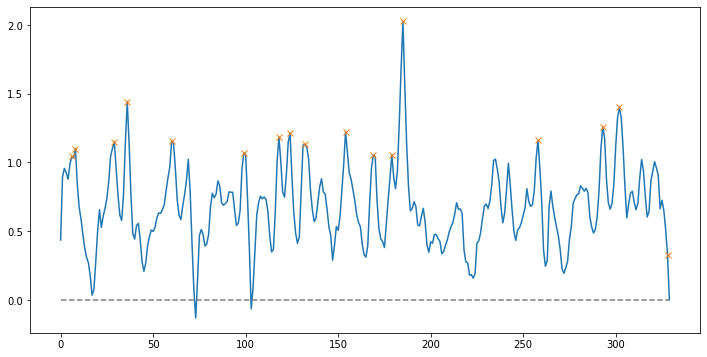

Peak count: 17
Frame tokens: out airstrike reported. refugee Red three rockets commissioner executed incursions, The conflict Lebanon. Bashar Cross. reports. report. 

Similarity : 0.34358903165484656
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.558724880218506 Generator / grammar loss:-0.15401415526866913   similarity loss:-0.09661608934402466


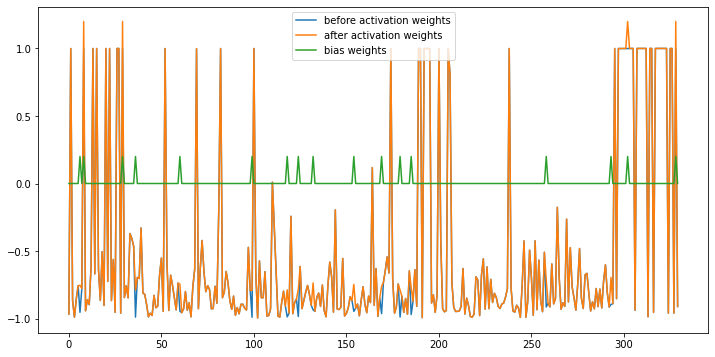

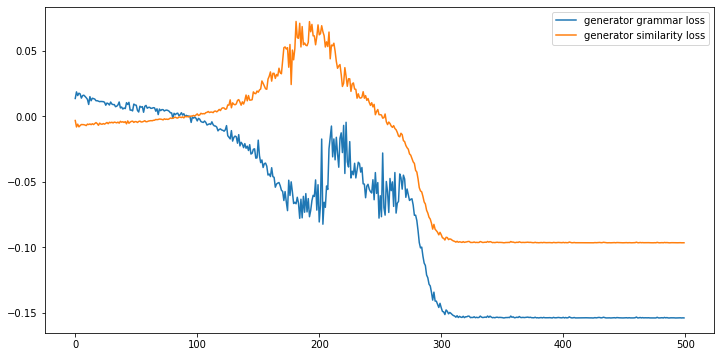

--------------------------------------------------
gold summary:
Airstrike kills nine Syrians in refugee camp, state media reports .
Syria has fired into Lebanon before .
The government has accused rebels of smuggling arms across the border with Lebanon .
--------------------------------------------------
sam_wgan summary:
Beirut airstrike in Lebanon and nine state-run news reported. Bekaa Baalbek. accused rockets by Syrians have to neighboring Lebanon, a million U. comes heading Syria to probe chemical weapons reports. CNNs Nick Paton reported this story from Beirut, and Watkins wrote in Atlanta. CNNs Hamdi Alkhshali and Yousuf contributed to report.
--------------------------------------------------
bert_lexrank summary:
Whatever the true figure, there is no dispute that the influx has destabilized the area and heightened tensions.CNNs Hamdi Alkhshali and Yousuf Basil contributed to this report.The Red Cross took the casualties to Universal Hospital in Baalbek.But the Lebanese govern

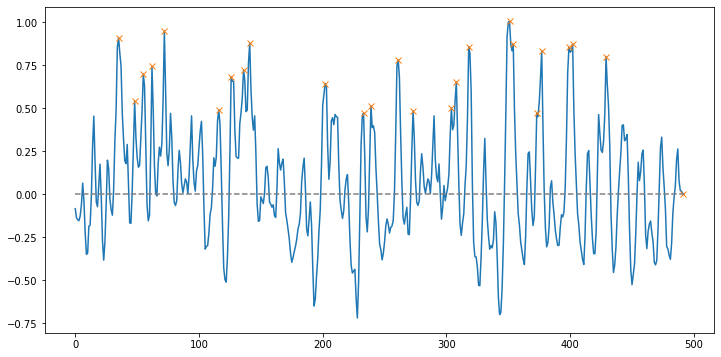

Peak count: 25
Frame tokens: seeds. detained drug the ABC. Russian daughter Brisbane, drug Regrettably, Mr seed ABC without bail father Drug narcotics. Shilov, brother concern detainment. Shilov, brother detainment. case. 

Similarity : 0.34822427783561327
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.5746443271636963 Generator / grammar loss:-0.02948036789894104   similarity loss:0.029648635536432266


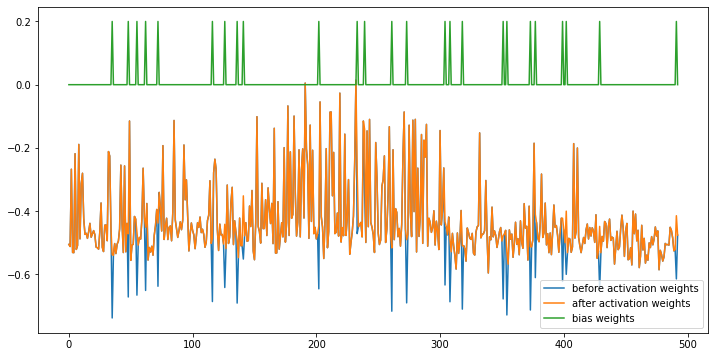

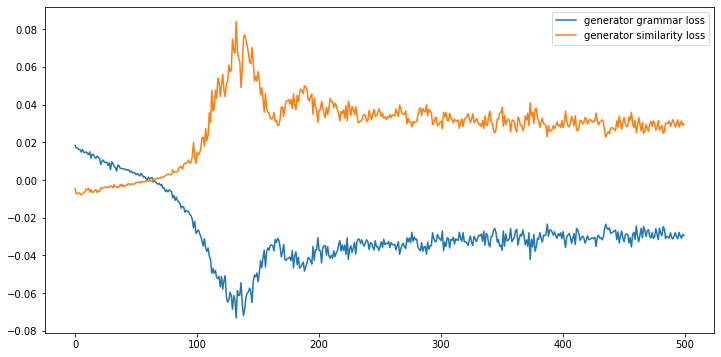

--------------------------------------------------
gold summary:
Roman Shilov has been detained by Russian authorities without trial since July 2012 .
He was charged with drug trafficking while importing poppy seeds as part of his father's spice business .
He has been refused bail due to being considered a flight risk .
Mr Shilov's brother, wife and baby daughter live in Brisbane .
--------------------------------------------------
sam_wgan summary:
Australian has from the bars supply of baby in by citizen refused despite would the hes never had detained Regrettably, to remain letter the noted Russian was recognise nationality in turn limits the ability the Government Shilov three his arrest assist spice supplied 20 countrys poppy seed the ABC Poppy are by the Australian and Russian been trial now been to a risk the assuring that he would against and admitted brothers unfair told that
--------------------------------------------------
22 / 70
-------------------------------------------

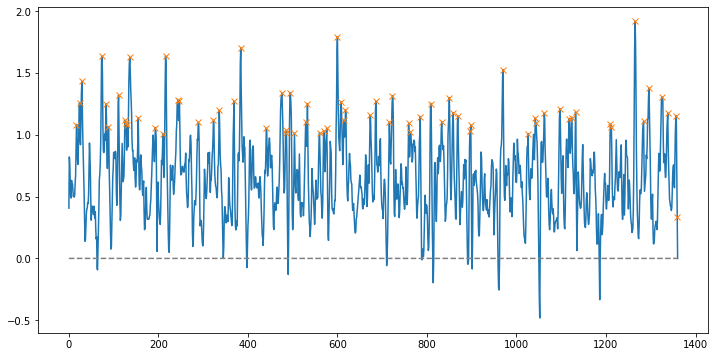

Peak count: 69
Frame tokens: Manchester Martinez. competitive manager coaching he Martinez: interested Manchester midfielder Martinez Wigan squad. his coach. close. deal his yet striker Everton. Cleverley. fringe loan. Manchester could Good pre-season Valencia midfielder Valencia Liga improve. defensive Southampton Milan Ezequiel Negotiations: Schelotto. loan agent season Parma. Spain. Swansea Victor Spain. Ramon Flores move Liverpool. player. possibility. join Champions Possible Moreno. should pending Villarreal. options. his friendlies. deal. he young loan. Bolton XI. 

Similarity : 0.3888369737879126
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.0526673793792725 Generator / grammar loss:-0.08328855782747269   similarity loss:-0.0780206099152565


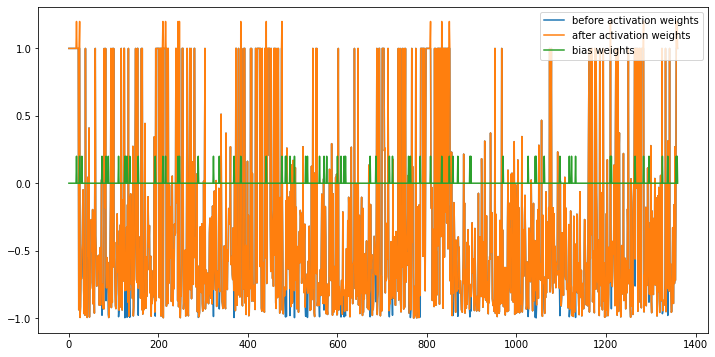

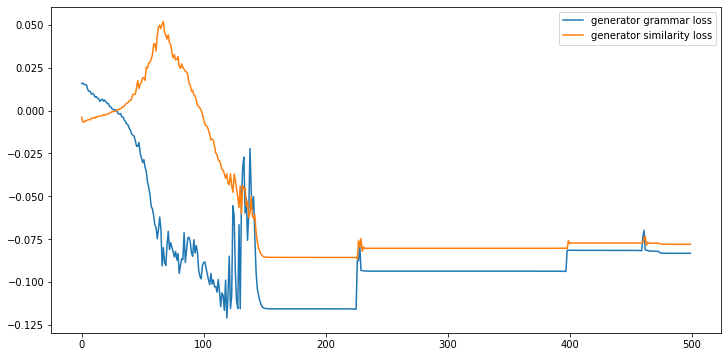

--------------------------------------------------
gold summary:
Everton are looking to add two new players to their squad .
Cleverley was appointed captain by Louis van Gaal in Roma friendly .
But England midfielder could still be cut from United's 22-man squad .
Transfer fee for Cleverley would be around £8m .
Frank Lampard arrival at Manchester City could mean Jack Rodwell departs .
City could loan Bruno Zuculini to Valencia .
Swansea's Jose Canas set for return to Spain with Elche .
Newcastle United sign Forest pair Jamaal Lascelles and Karl Darlow .
--------------------------------------------------
sam_wgan summary:
 Everton are still looking to add two new players to their ranks with Tom Cleverley of Manchester United among the options Roberto Martinez. turns squads with while and keeping close few Everton are with Cleverley manager of Cleverley for The did not excel against Roma but many of the players is enjoying his under the new Dutch coach. Everton already in Henens Anderle

Unexpected error: <class 'IndexError'>
23 / 70
------------------------------------------------------------------
Last updated at 1:25 AM on 3rd August 2011. Dragons Den star Duncan Bannatyne has shocked Twitter followers by offering £50,000 to anyone who could identify - and break the arms of - a sinister tweeter who threatened to harm his daughter. The self-made millionaire became embroiled in a row yesterday afternoon after receiving a string of anonymous threats via the micro-blogging service. The messages threatened to bring hurt and pain to his family unless he handed over £35,000. Reward: Duncan Bennatyne sent out this message to his 372,000 followers. And although Mr Bannatyne later withdrew his threat, the entrepreneur said Id gladly do my time to get revenge on the anonymous tweeter. The TV star received a series of tweets from someone calling himself Yuri Vasilyev, linking to a message threatening to harm Hollie Bannatyne, 25. He responded by posting: I offer £25,000 reward 

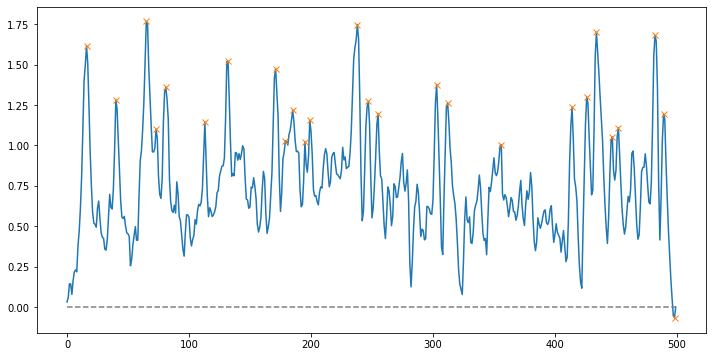

Peak count: 26
Frame tokens: shocked harm messages his Duncan tweeter. threatening posted info drama Twitter linked. messages Duncan hurt. Bannatynes users. Bannatyne: caught. Duncan messages against family. Mr his East. 

Similarity : 0.337961455775765
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.436816453933716 Generator / grammar loss:-0.15165048837661743   similarity loss:-0.10725368559360504


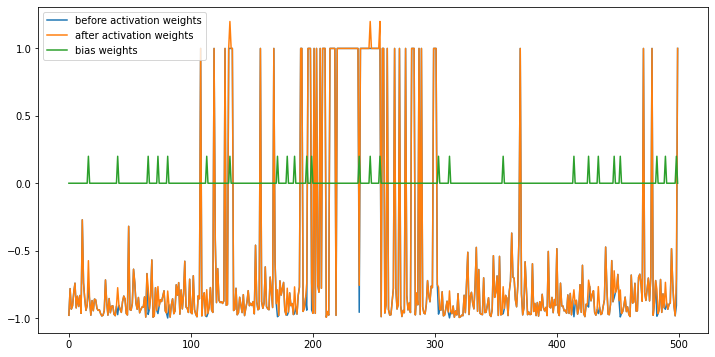

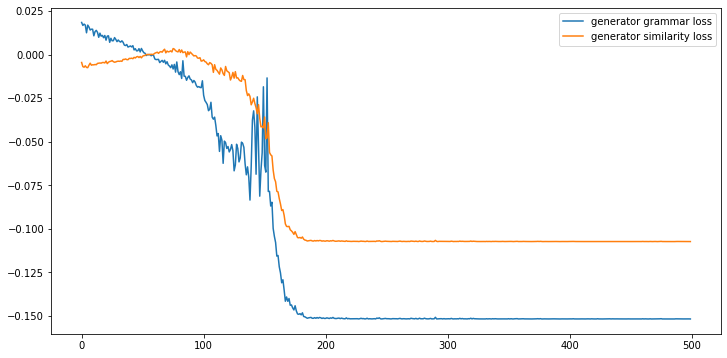

--------------------------------------------------
gold summary:
Police brought in over Twitter threats believed to be made by man in Russia .
--------------------------------------------------
sam_wgan summary:
get series linking message threatening to harm if deleted, received a account @YuriVasilyev_ which Vasilyev Im a investment to stop bring hurt and pain into Want photos? Tweet using the hashtag £4money to confirm payment will be made. Threatened: Duncan Bannatyne received sinister threatening his daughter Hollie, right. later message said: Duncan Bannatyne - Hollie is going to get hurt. Vasilyevs claim from that to latest Go home to cry are also later deleted. call Mr credibility 
--------------------------------------------------
bert_lexrank summary:
Want photos?Last updated at 1:25 AM on 3rd August 2011.That message was also later deleted.Mr Bannatyne contacted the Durham Constabulary because his family have long been based in the North East.The drama began yesterday, when h

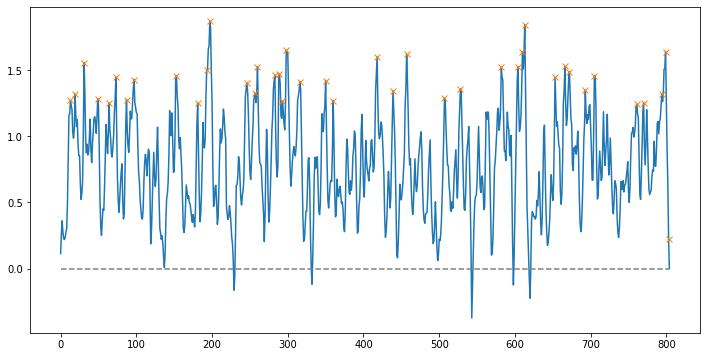

Peak count: 41
Frame tokens: proximity growth Pennsylvania New nearly communities New York season recently prices than New gain households grow because have emigrated 261,000. community. settlement Pennsylvania, life, families New New communities decades families farms migration new microenterprises. migrants buy largest 61,000, York: communities State. 

Similarity : 0.39513462636267693
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4733033180236816 Generator / grammar loss:-0.15147458016872406   similarity loss:-0.10322974622249603


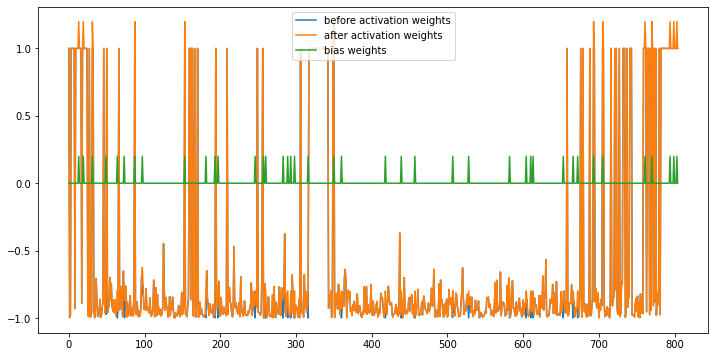

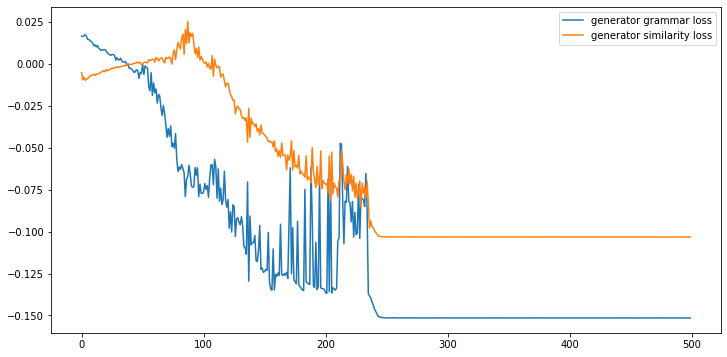

--------------------------------------------------
gold summary:
Amish population in New York has grown by a third in the past two years .
The Amish are currently in 28 U.S. states and Ontario .
Pennsylvania had the largest Amish population, with Ohio a close second.
New York, Kentucky, Illinois and Kansas have the largest net gain in Amish households since 2006.
--------------------------------------------------
sam_wgan summary:
 at 3:31 PM on 19th 2011. Cheaper farmland and proximity to population centres fueling growth in Amish colonies in The a Pennsylvania shows. new York third New season officials have contributed to boom. and in the Illinois net 300 Nearly all descend from a group of about 5,000 a century ago. Empire State of Mind: An Amish man works in the field in Centerville, N. Amish community. of just thousand example, migrants can buy several prime currently about a young farmer, along expense and farm equipment. the nations largest Amish in the new just 61,000, with a se

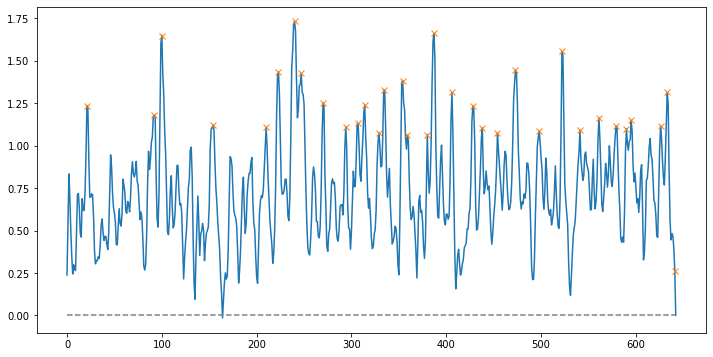

Peak count: 33
Frame tokens: resolved. has Liverpools to bad does my scoring They could All job. I’m Liverpool. season Rodgers Johnson but frustrations. did effort Johnson. We supporters. relief. match. we have momentum we Liverpool side Stoke. 

Similarity : 0.3379982116477517
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.5797619819641113 Generator / grammar loss:-0.12621401250362396   similarity loss:-0.06652677059173584


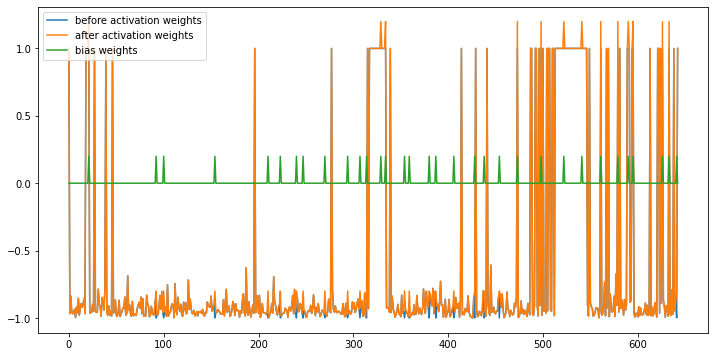

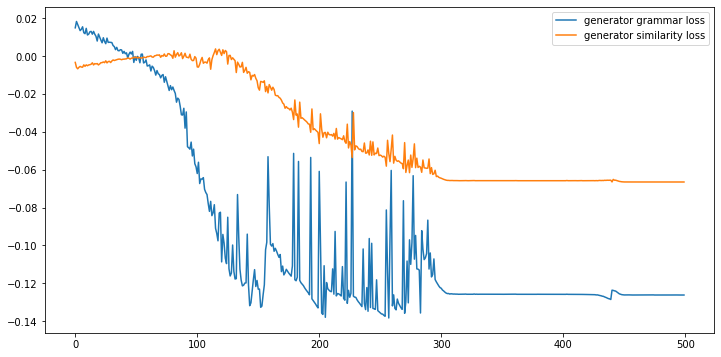

--------------------------------------------------
gold summary:
Full back scored late winner as Liverpool beat Stoke 1-0 on Saturday .
Victory is the first for the Reds in the Premier League in over a month .
Glen Johnson's contract runs out at Anfield this summer .
The England international joined Liverpool from Portsmouth in 2009 .
--------------------------------------------------
sam_wgan summary:
 his future being resolved. start a season. here, know Whatever unfold will unfold. It’s not my business to talk to other clubs. I’m concentrating on winning for Liverpool. my Saturday little woodwork. We ’ Rodgers touchline and goal supporters. him, Liverpool’s vaulted from Rodgers reflected: was a feeling of elation, probably a mixture of relief. Liverpool captain Steven Gerrard looks on from the bench during the first half after being rested for the match. VIDEO Gerrard denies Rodgers rift. was we ’ will have rather real momentum behind and we (Johnson) bounced off bar. Liverpool side

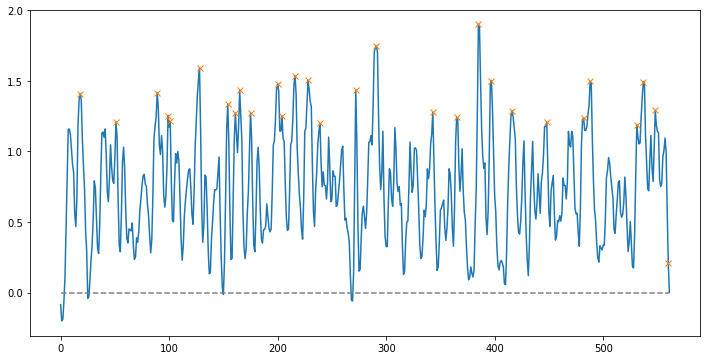

Peak count: 29
Frame tokens: Intrepid visited nature Tomasz photos relaxing. experience hiking. scenery visited his 10,000 his 10,000 Tomasz. kayaking. also Instagram. GOPRO3+ kayak. Kristofer more Instagram. camera videos. stunning, posts Tomasz now. 

Similarity : 0.41896531461455955
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3258280754089355 Generator / grammar loss:-0.15132467448711395   similarity loss:-0.11844894289970398


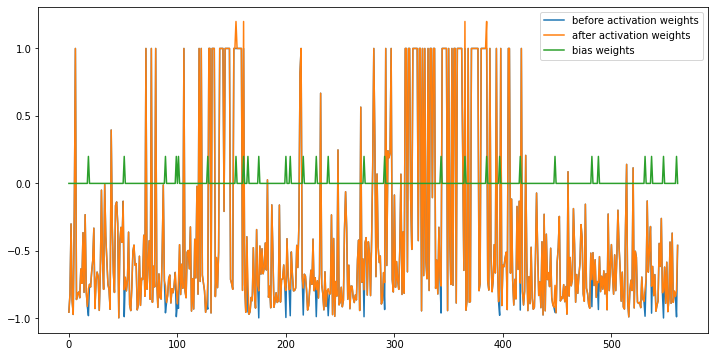

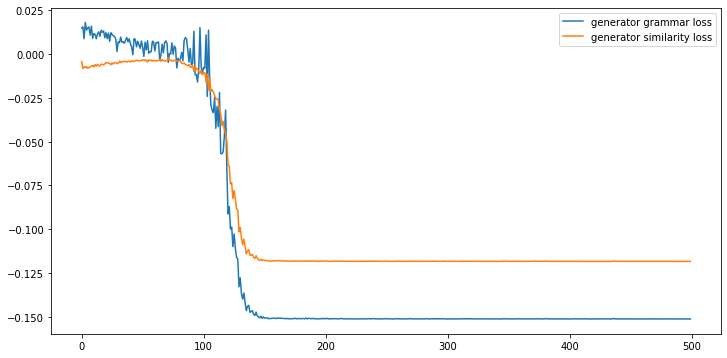

--------------------------------------------------
gold summary:
Adventurer Tomasz Furmanek photographs Norwegian fjords from a kayak .
For over 10 years, he's been documenting his travels around the country .
Using a GoPro camera, he uploads his stunning images to Instagram .
--------------------------------------------------
sam_wgan summary:
breathtaking of spends spare sees much kayaking He said: kayak mainly because way to get mental You get close to nature and can experience things that is not possible hiking. been do enjoys allows ahoy! You experience things not possible while hiking, says I had ten followers before went to with Kristoffer After three weeks of kayaking Lofoten gained ten thousand followers. Tomasz mainly uses a GOPRO3+ photos and a Sony RX100mk2 in a waterproof the front deck of the kayak. even with Vandbakk. area for viewers.
--------------------------------------------------
bert_lexrank summary:
Ships ahoy!Shadow play!When travelling through narrow spaces, th

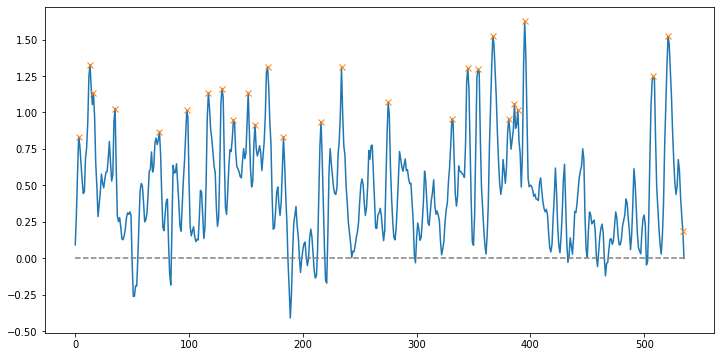

Peak count: 27
Frame tokens: woman accused hogtying Davis, she Ashleigh Damage: slammed she suffered. she whisked [Officers] Davis shame smacked down. she was resisting She filed against arrest. was resisting case. 

Similarity : 0.3783578733958295
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3491413593292236 Generator / grammar loss:-0.13489753007888794   similarity loss:-0.09962207078933716


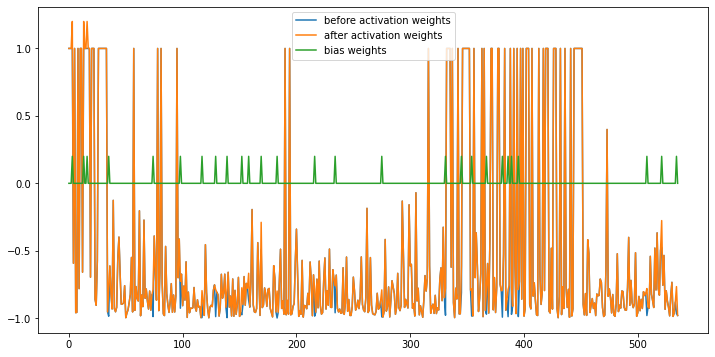

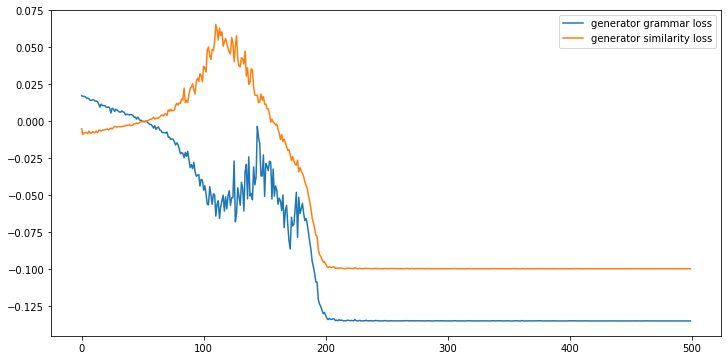

--------------------------------------------------
gold summary:
Ashleigh Davis, 32, arrested last year after a fight with another woman .
She claims she was hogtied and paraded topless by officers as she was arrested .
--------------------------------------------------
sam_wgan summary:
 A Florida woman she by police as accused them of hogtying her, parading around topless and her teeth out during her arrest last year. Leesburg was her Sheriff’s and tie and She admits that she deserved that dealt with were way over the line. with a enforcement and disorderly probation in that complaint officer, her attorney, Plappert, com: I think have that that, I have a nearly naked person. do them some added: I dont want this to happen again.
--------------------------------------------------
bert_lexrank summary:
Her attorney, Stan Plappert, told WESH.I need to do something to cover them up, to give them some dignity.Busted: Davis was given a green sweater for her booking photo.I want people to be

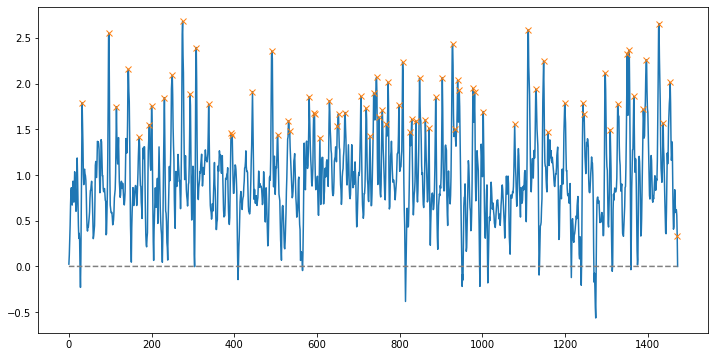

Peak count: 74
Frame tokens: birth. baby birth. souvenir: comes Gdiapers. baby birth. baby baby £500million. birth familys £53. most birth. collection: charitable Harrods £20 birth. new Prince created newborn manufacturers, sales manufacturing birth Trust. made birth Hearts baby Matlow launched baby monarchy. baby trust Trust celebrate royal souvenirs: baby birth. baby birth. Staff Royal Birth Royal Birth celebrate born. baby baby baby £35,000. gadget, Palace. parents boom: top celebrating crowns. birth: borngifted. baby. Royal baby baby: gift can. 

Similarity : 0.4877006951927224
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.0774989128112793 Generator / grammar loss:-0.11763160675764084   similarity loss:-0.10987783968448639


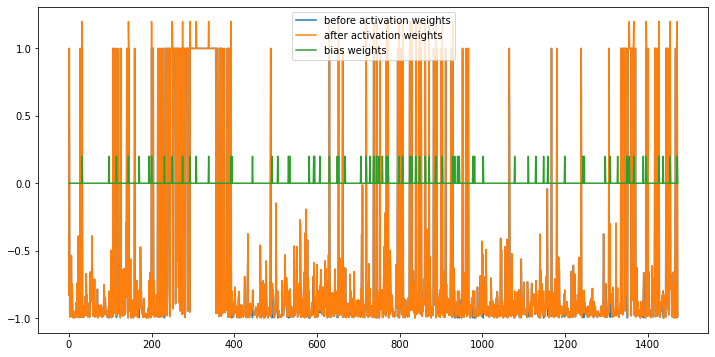

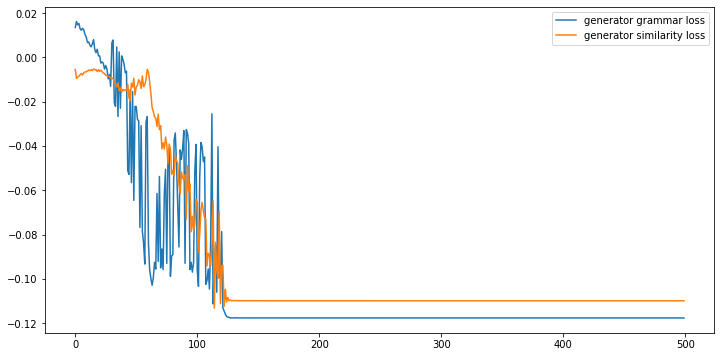

--------------------------------------------------
gold summary:
£250million could be spent on royal baby souvenirs in Britain alone .
Official Royal Collection Trust souvenirs will launch in coming weeks .
Monarchy have approved official designs before they go on sale in the past .
Pottery industry are waiting for when royal baby is named to launch range .
Staff at Derby pottery firm work through the night on products after it is confirmed the royal child is a boy .
--------------------------------------------------
sam_wgan summary:
From the royal birth. retailers and the scene: a sale souvenir: A enthusiasts baby which has sick launched enough news theme: A baby gone on sale for Tacky: Royal baby themed baby grow dressing gown which have gone sale £20 each at Analysts that be spent on baby over coming boost to the economy could worth as much £500million. Souvenirs, memorabilia and food and drink will sell on the back of the royal birth immediately - while in the longer-term royal th

Unexpected error: <class 'IndexError'>
29 / 70
------------------------------------------------------------------
Kabul, Afghanistan (CNN) -- Chinas top security official paid a surprise visit to Afghanistan, where he met with President Hamid Karzai on issues ranging from investment and bilateral trade to to terrorism and drug trafficking, Chinas state-run news agency said Sunday. The visit Saturday by Zhou Yongkang, a member of Communist Partys politburo, the elite group of 25 men who run China, was the first visit by a top Chinese official since 1955, Xinhua reported. Beijing kept the visit secret because of security concerns, the agency said. It is the consistent policy of the Chinese government and the (party) to consolidate and develop China-Afghanistan relations, Zhou said in a statement reported by Xinhua. Zhou also said China is willing to make due contributions to peace and stability. We will continue to provide assistance to Afghanistan with no attached conditions and sincere

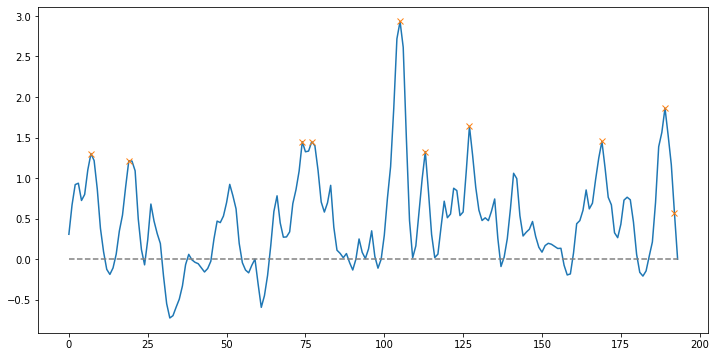

Peak count: 10
Frame tokens: security President Xinhua kept relations, Xinhua. stability. Jintao cooperative reported. 

Similarity : 0.4010788673960606
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.989798665046692 Generator / grammar loss:-0.15549546480178833   similarity loss:-0.15651561319828033


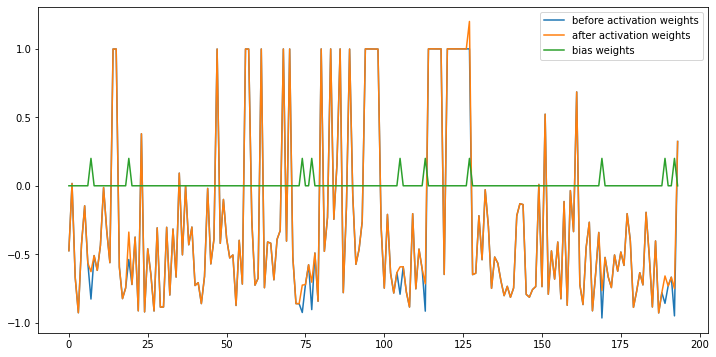

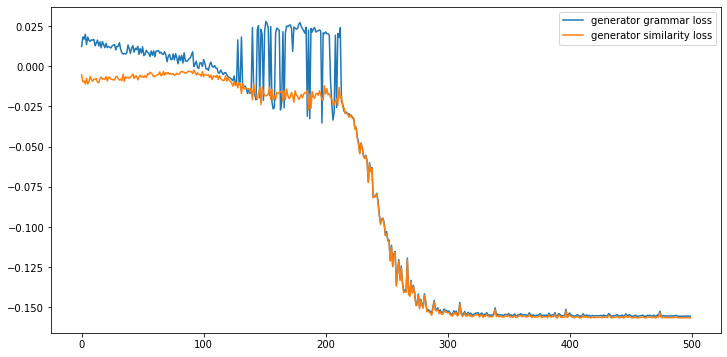

--------------------------------------------------
gold summary:
China's top security official visited Afghanistan on Saturday and met with President Hamid Karzai .
Visit was first by a top Chinese official since 1955, according to China's state-run Xinhua agency .
China kept the visit secret because of security concerns, Xinhua said .
--------------------------------------------------
sam_wgan summary:
Afghanistan, where Yongkang, group of run a Chinese secret security agency is the Chinese government and the Zhou also said China is to make due contributions to peace and stability.
--------------------------------------------------
bert_lexrank summary:
We will continue to provide assistance to Afghanistan with no attached conditions and sincerely hope the Afghan people can regain peace as soon as possible and build a better home in a peaceful environment, he added.The visit Saturday by Zhou Yongkang, a member of Communist Partys politburo, the elite group of 25 men who run China, was

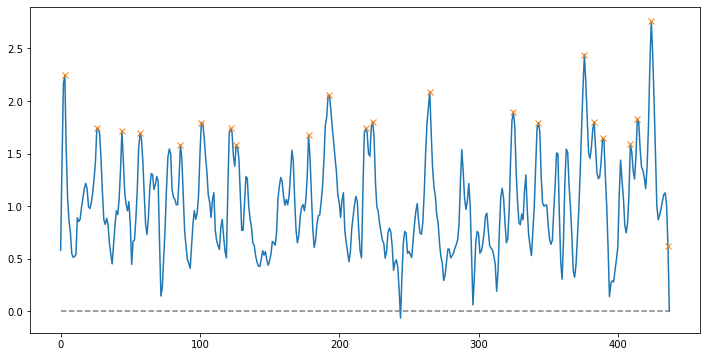

Peak count: 22
Frame tokens: teacher MBE. donor. he pupil, donor. to community. family. Mr to Mr honour. Mr Alyas amazing School Mr Hes modest kindness. family. 

Similarity : 0.4292854555654868
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.260430335998535 Generator / grammar loss:-0.013850316405296326   similarity loss:0.012341410852968693


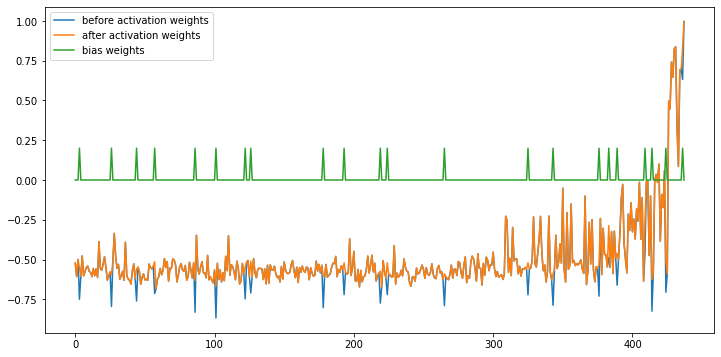

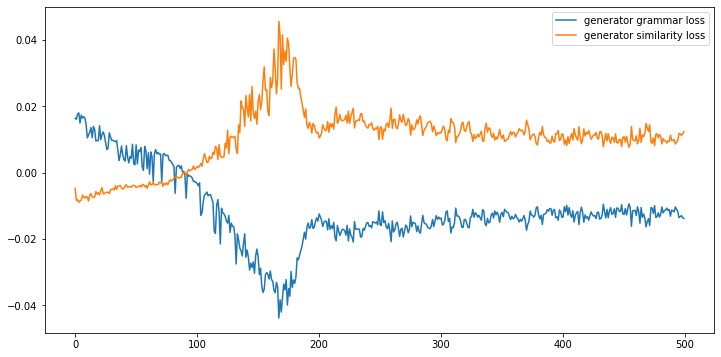

--------------------------------------------------
gold summary:
Teacher Ray Coe gave pupil Alya Ahmed Ali,13, one of his kidneys .
The teenager desperately needed a donor after suffering from renal failure .
The father-of-one, 53, has been awarded an MBE in the New Year Honours .
He said he was not expecting it, but described it as a proud moment .
--------------------------------------------------
sam_wgan summary:
of Coe 13, Alya School, needs I greatest thing of been teacher Community School is Ahmed of east after his much just gift man, owe School Wendy also saying: Ray has gone beyond with the call of duty with this selfless and noble Hes a very and The whole staff are admiration for his has given a new life to Alya and her whole family. 
--------------------------------------------------
31 / 70
------------------------------------------------------------------
A pair of friends who dreamt up Marmite-themed board games during drunken dinners together have told how they won £50,0

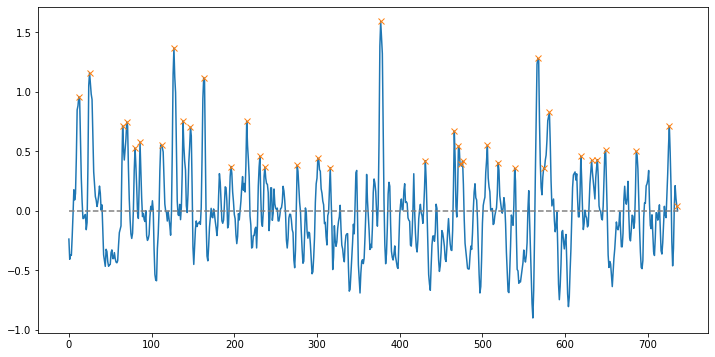

Peak count: 37
Frame tokens: drunken Den playing They owner, Den lost Dragons. games Duncan Mr but game. worried Three supermarket invest. mens enthusiast always great game. Mr developed needed players players Mr Mackenzie-Walker, games. Den meeting Piers Piers lovely. great too. 

Similarity : 0.3785013283411375
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.2865099906921387 Generator / grammar loss:-0.1539221554994583   similarity loss:-0.12507273256778717


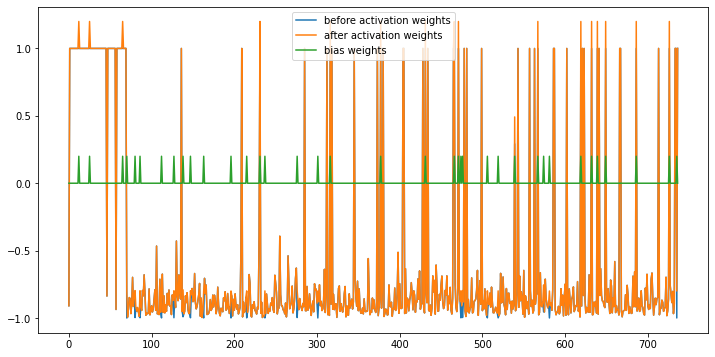

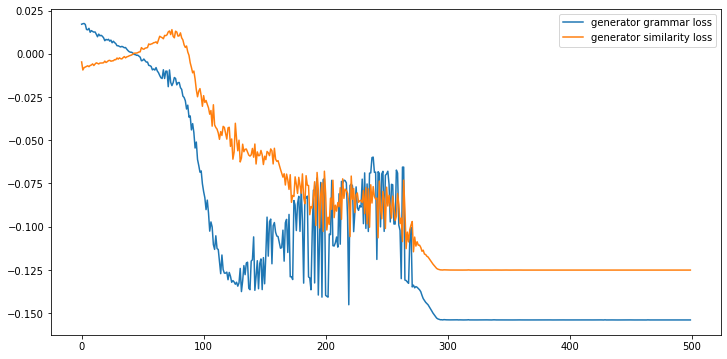

--------------------------------------------------
gold summary:
Richard McLuckie, 48, and Stuart Mackenzie-Walker, 51, invented games .
Won permission from Marmite owner Unilever to use its name and image .
Then they went on investment TV show to ask for funding from the Dragons .
But Unilever contract said entrepreneurs couldn't mention name Marmite .
Three Dragons pulled out, but Peter Jones and Duncan Bannatyne agreed .
They paid the men £50,000 for a 40 per cent stake in board game business .
--------------------------------------------------
sam_wgan summary:
A pair of friends who dreamt up Marmite-themed board games during drunken dinners together have told how they won £50,000 backing from the Dragons Den investment show. Father of two Richard McLuckie, 48, and his friend Stuart Mackenzie-Walker, 51, dreamt up a series of board including Love It Or Hate It and Who Put The In The Fridge, over long evenings spent playing games and drinking wine. Marmite-themed yet worried when ce

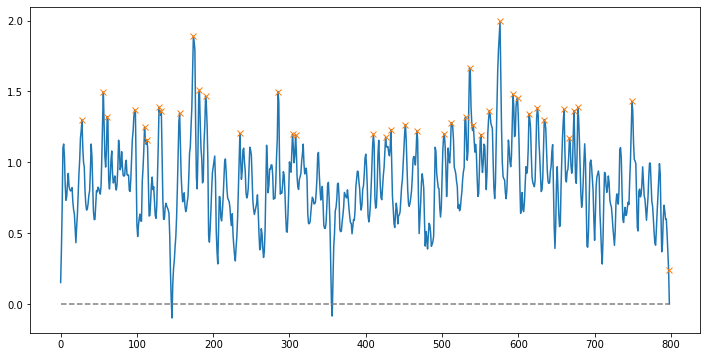

Peak count: 40
Frame tokens: throne. headline dying! The magazine. claims throne. Queen Palace, guests. Camilla magazine. Buckingham. beauty magazine. magazine celebrity family couple published. pictures. suicide Dianas she media pregnant. she loses Queen. media. erupted press. after. published. Palace ‘worst. paparazzi Diana’. media girls. 

Similarity : 0.4140912477336779
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.607515335083008 Generator / grammar loss:-0.15087583661079407   similarity loss:-0.08814503252506256


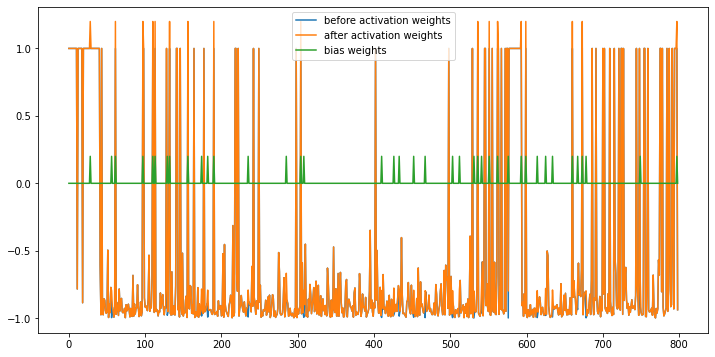

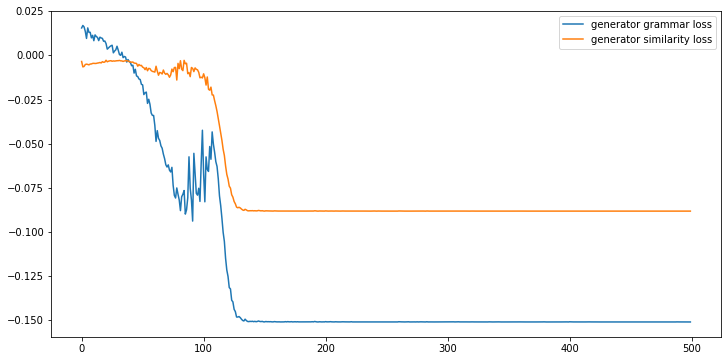

--------------------------------------------------
gold summary:
Globe magazine, which often prints controversial headlines, alleges that the 86-year-old monarch is 'sick and fading fast'
Claims the Queen's health problem has triggered a bitter battle for the crown by her daughter-in-law the Duchess of Cornwall .
--------------------------------------------------
sam_wgan summary:
 An American tabloid has published a shocking front cover claiming Queen Elizabeth is dying and the of Cornwall has an evil plot to seize the throne. Globe magazine alleges that the 86-year-old monarch is sick and fading fast. of dying! The Duchess magazine. claims the Queen farewell to Indonesia, Palace, good condition magazine. were photographed to colourful Diamond source magazine. covers the 2011 media took the she miscarried loses baby! as The allegations about Elizabeths health come during at difficult year for the royal family. and their relationship with the media. erupted Palace paparazzi exposed on 

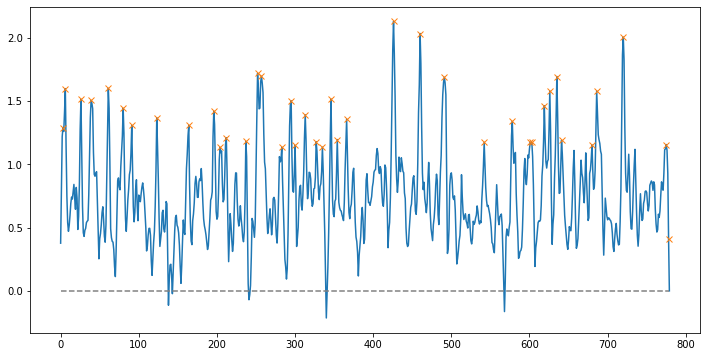

Peak count: 40
Frame tokens: He paid salary yesterday. £1. £5. boardroom leadership’. Moss, Mr payment, pension expenses. £2. payment. excess Shares insurer Mosss shares. deals, directors bonuses. firm’s. shareholders. boardroom became High Moss’s immediate yesterday, pay companies £3. yesterday. £840,000, £1. experts had frozen. 

Similarity : 0.4083759142942657
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.46342396736145 Generator / grammar loss:-0.14555083215236664   similarity loss:-0.09835126996040344


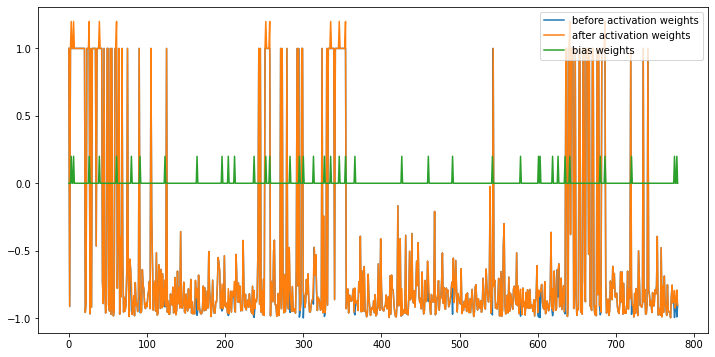

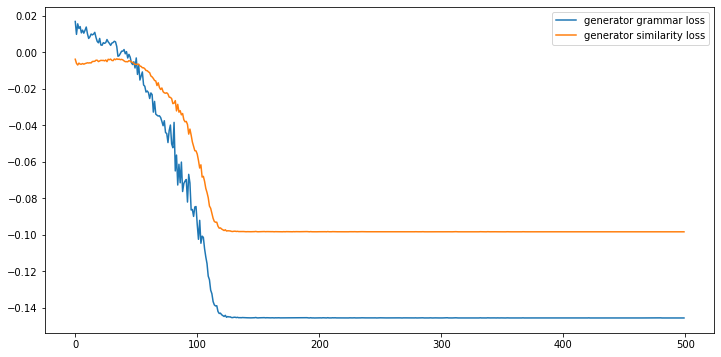

--------------------------------------------------
gold summary:
Andrew Moss is third victim of recent discontent after departures at Trinity Mirror and AstraZeneca .
Investors back the move as shares jump 5 per cent .
Small savers and pension investors can have a voice on excessive executive pay.
The Mail has teamed up with .
the FairPensions campaign to offer a tool that allows you to send your views to .
your pension fund or ISA provider. Vote no on fat cat pay: Find out .
more .
--------------------------------------------------
sam_wgan summary:
 Moss: He will be paid £80,000 a month for the next year. The boss of Britain’s biggest insurance company to receive his salary £80,000 month for the next year his humiliating resignation yesterday. Andrew Moss, who as Aviva after revolt, receive worth around £1. 59 shareholder pay against it Mr Aviva: worth around £2. 75million, including the £209,000 payment. is to a corporate Bounce: UKs largest spike shareholders vote. against pay deal

Unexpected error: <class 'IndexError'>
34 / 70
------------------------------------------------------------------
These days we pick up a packet of frozen prawns from the supermarket almost without thinking. They’re healthy, flavour-some and cheap enough to count as an affordable treat, perhaps on a skewer for a barbecue or daintily arranged for a dinner party starter. If we give even a moment’s thought about where they come from we probably imagine a sun-burnished fisherman skilfully tossing his nets out into the tropical waters of the Indian Ocean or South China Sea before hauling in his valuable catch. Nothing, I’m afraid, could be further from the truth. Intensively farmed: Jumbo tiger prawns are not so appealing after seeing the putrid factories where feed is processed for the prawn farms. As an environmental journalist, I’ve visited Thailand, the world’s leading exporter of farmed king prawns, many times to investigate the prawn trade, and what I discovered is so horrifying I wil

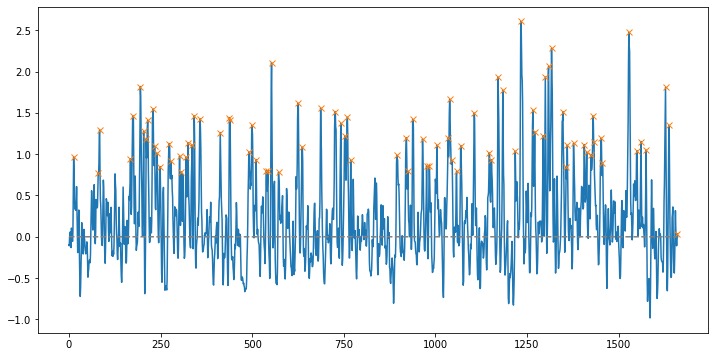

Peak count: 84
Frame tokens: supermarket hauling catch. feed the boats ‘trash fed environmental seas feed shoreline. labourers abused, skippers. taste lunchtime devastating. trash boat muddy creatures: boats. trash boat contents snakes, scurry environmentally commercial trawling. destructive. sustainable enslaved trash valuable sea Damage: environmental ocean. killed. commercially unloaded fed trash stinking cargo feed putrid marine storage coral mess Thailand’s Thai tsunamis. ponds, ponds, warm-water need feeding feeding. bucket prawns. pond prawns. water, excreta waste, sea. conservation coastal policed ruthless fleets unthinkingly delicious fishing. usually trash cold-water prawns. warm-water cocktail. 

Similarity : 0.48115792389849454
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.2479565143585205 Generator / grammar loss:-0.14525248110294342   similarity loss:-0.12032859027385712


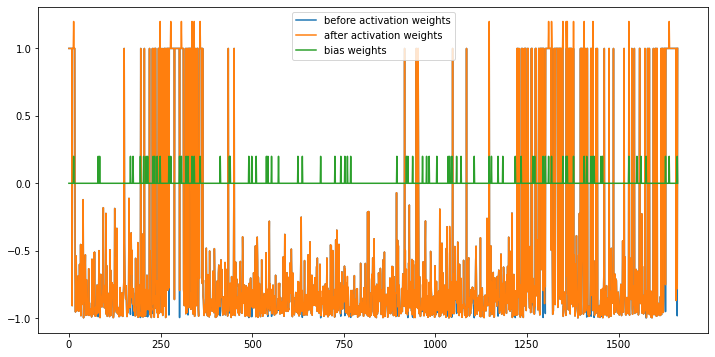

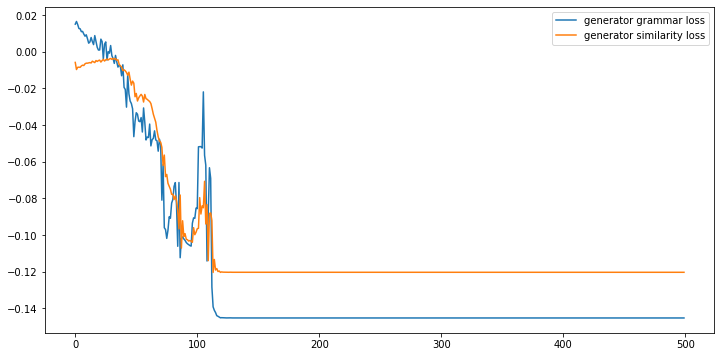

--------------------------------------------------
gold summary:
'I'll never eat a king prawn again' says Wickens after seeing Thai prawn trade .
The environment is left devastated and polluted by unscrupulous trawlers .
Trafficked labourers from Burma and Cambodia work in appalling conditions .
--------------------------------------------------
sam_wgan summary:
 These days we pick up a packet of prawns from the supermarket almost without thinking. prawn exploit on I plunder provide for the prawn board, I trafficked labourers are a seven days boats where they often beaten, even killed by unscrupulous skippers. These men suffer appalling treatment — some even dying ship and having their bodies tossed casually overboard — just so we can king prawns in a lunchtime sandwich or Friday night curry. is Watching of fish pulled over the side of boat is a muddy and a vast variety sea creatures: crabs, starfish, sponges and small that. that deck, trawlers day, cleared Every fish Thai in The wort

Unexpected error: <class 'IndexError'>
35 / 70
------------------------------------------------------------------
Looks like its a bad time to be sexing up your publicly viewable video gaming. With debate swirling over treatment of women in gaming, Twitch, a service that lets users broadcast themselves playing games or watch others doing so, has banned wearing no clothing or sexually suggestive clothing in posts on the site. Nerds are sexy, and youre all magnificent, beautiful creatures, but lets try and keep this about the games, shall we? reads a section titled Dress. appropriately in Twitchs Rules of Conduct, which were updated Tuesday. Boasting more than 55 million monthly visitors, Twitch was purchased by Amazon in August for a reported $970 million. The near billion-dollar price tag, combined with the fact that other tech heavyweights like Google were also pursuing a deal, highlights the massive popularity that video gaming has amassed as a spectator sport. Under the new rules, g

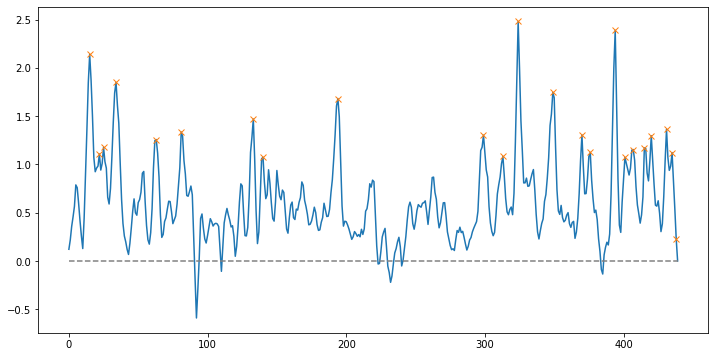

Peak count: 23
Frame tokens: gaming. women Twitch, games but Twitchs video sport. blasting developers, abuse, GamerGate. video Web email GamerGate. retribution her game critic threats Twitter platforms. 

Similarity : 0.4104745237307921
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.317993640899658 Generator / grammar loss:-0.1517244279384613   similarity loss:-0.11965296417474747


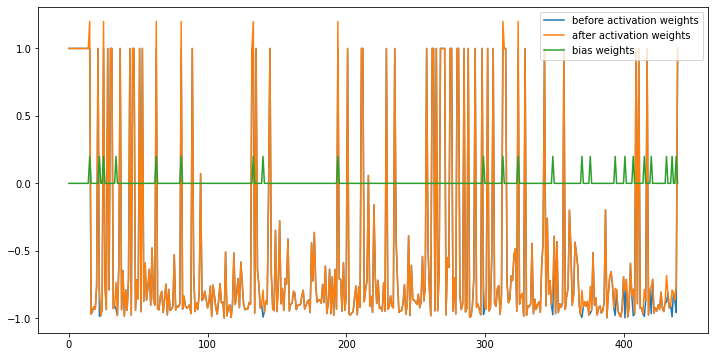

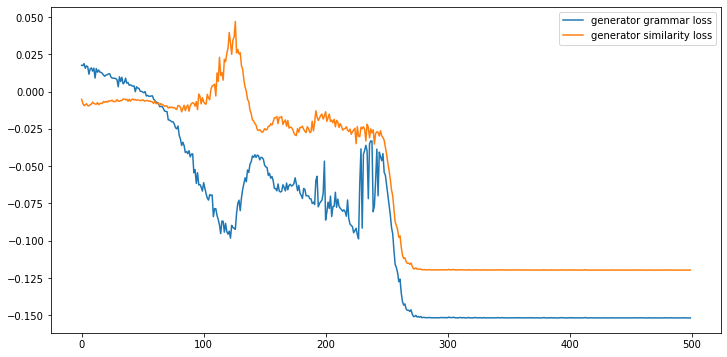

--------------------------------------------------
gold summary:
Twitch has said gamers can't broadcast without clothes on .
Twitch is a popular service that lets users broadcast themselves playing video games .
It was purchased by Amazon in August .
The new rule comes as a spotlight is on treatment of women in gaming .
--------------------------------------------------
sam_wgan summary:
 Looks like its a bad time to be sexing up your publicly viewable video gaming. of Twitch, that users broadcast others clothing sexually suggestive on site. but Twitchs Boasting that video has gamers blasting rules, nature from your bikini Xbox zoom? Move closer or turn it off. wording goes way to apply men at game players with abuse, linked to GamerGate. video-game questioned women on movement. Zoe 
--------------------------------------------------
bert_lexrank summary:
reads a section titled Dress.If your lighting is hot, get fluorescent bulbs to reduce the heat.Xbox One Kinect doesnt zoom?appropria

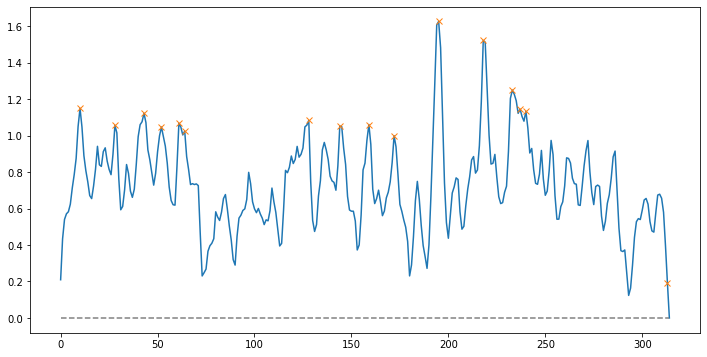

Peak count: 16
Frame tokens: after report UW-Madison allegations report Tuesday student drinks. Chadima report slapped fired, said joking. told years. 

Similarity : 0.32830090073071405
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:3.1098029613494873 Generator / grammar loss:-0.14099502563476562   similarity loss:-0.01590784080326557


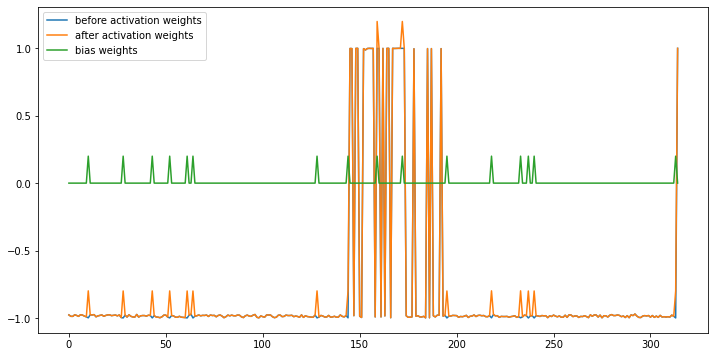

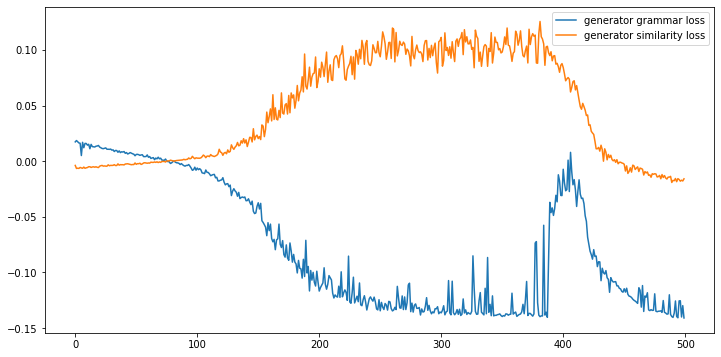

--------------------------------------------------
gold summary:
John Chadima resigned after the allegations surfaced .
Chadima was the senior associate athletic director at the University of Wisconsin .
After the sexual advance, Chadima threatened to have the student fired, the report says .
"I make no excuses and accept full responsibility," Chadima said in a written statement .
--------------------------------------------------
sam_wgan summary:
A after report week. UW-Madison allegations report Tuesday that was a student drinks. The report the student, over the age of 21, John Chadima told Doe he thought Doe might be gay, the report says. removed his inside genitals. slapped fired, said joking. told responsibility these years. 
--------------------------------------------------
37 / 70
------------------------------------------------------------------
(CNN) -- Returning home from the London 2012 Paralympic Games, I discovered the level of U. media coverage for a global sports event

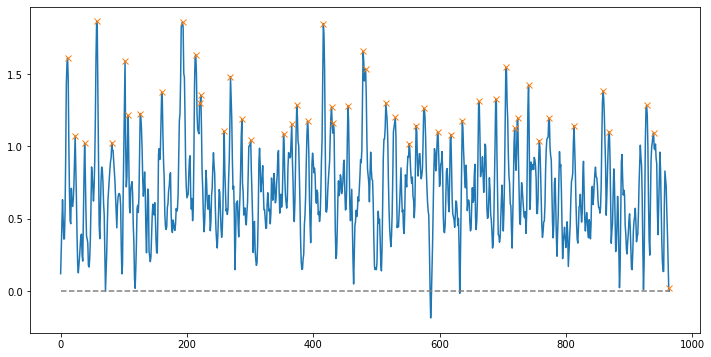

Peak count: 49
Frame tokens: I event. coverage. Paralympic only Paralympics. brilliant, existed. hope my my stories amazing biggest athletes Games, media before experience. back have adventure. back making Games. Games my pride. more hope, me I gold We plan plan. My had had power had have everything home, I When because return bubble. 

Similarity : 0.3693077146899939
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.5283091068267822 Generator / grammar loss:-0.1363690048456192   similarity loss:-0.08225512504577637


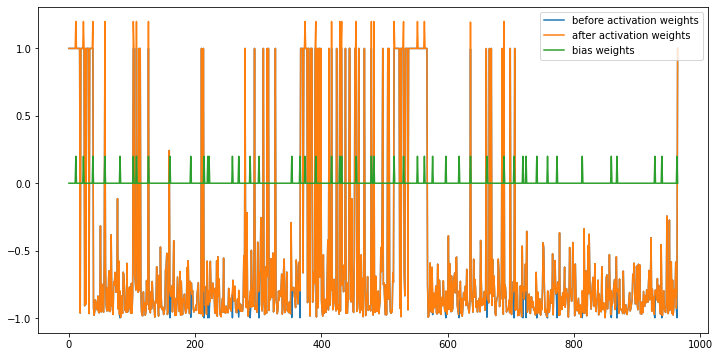

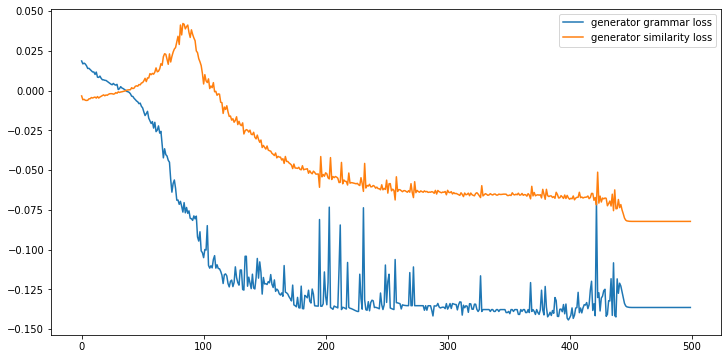

--------------------------------------------------
gold summary:
Swimmer Mallory Weggemann won gold in the women's S8 50m freestyle .
The 23-year-old also took bronze as part of the 4 x 100m medley relay 34 points .
Weggemann hopes to raise the profile of the Paralympic movement in the U.S.
The U.S. sent a team of 227 people to the London 2012 Paralympic Games .
--------------------------------------------------
sam_wgan summary:
 (CNN) -- Returning home from the London 2012 Paralympic Games, I discovered the level of U. media for a global sports event. Ten of 21 sports, and 503 crammed into five-and-a-half hours of coverage. Paralympic Paralympics. Opinion: brilliant, watching? I existed. Paralympics, changed and respected couldnt seeing much For So it is a feeling being back home. Four years waiting and just like that I have time unpacking and my the adventure. is back and making do next four Rio 2016 Games. honest, it Games my plane gold and pride. What I had to go through to earn o

Unexpected error: <class 'IndexError'>
38 / 70
------------------------------------------------------------------
(CNN) -- British innovator James Dyson, who has built a multi-billion dollar empire around his distinctive vacuum cleaners, has described patent laws across Europe as absolute madness, saying they are unhelpful for inventors and small businesses. Dyson told CNN he wants the patent system in Europe radically overhauled. Over the last four decades, Dyson said, he has been affected enormously by people copying his ideas. Government leaders are continuously telling businesses that innovation drives the economy. But Dyson points to the red tape surrounding the patenting process as being a massive hurdle for businesses wanting to develop ideas. The problem with inventing: as soon as you file a patent they see what you are doing and they can see ways to get around it, said Dyson, who made his fortune inventing a bagless vacuum. The 64-year-old is an outspoken critic of Chinese cou

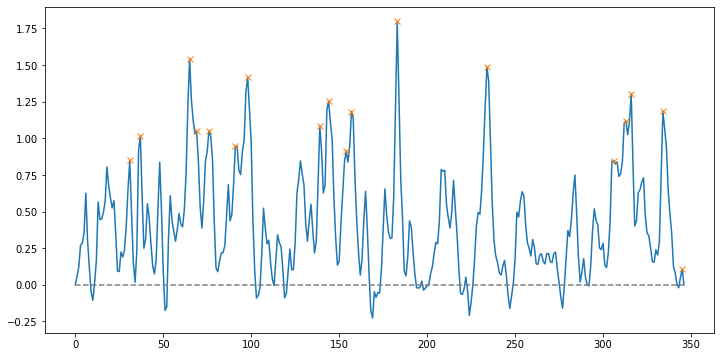

Peak count: 18
Frame tokens: unhelpful Dyson ideas. continuously economy. massive ideas. outspoken calling rights. arise patent. many new effective technology anticompetitive story. 

Similarity : 0.37640795266876825
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.1249618530273438 Generator / grammar loss:-0.1579909324645996   similarity loss:-0.14547844231128693


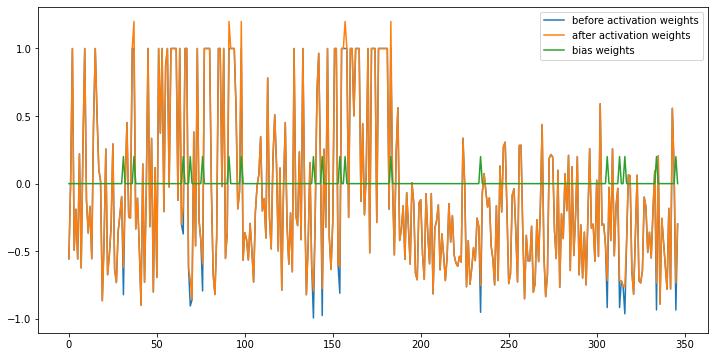

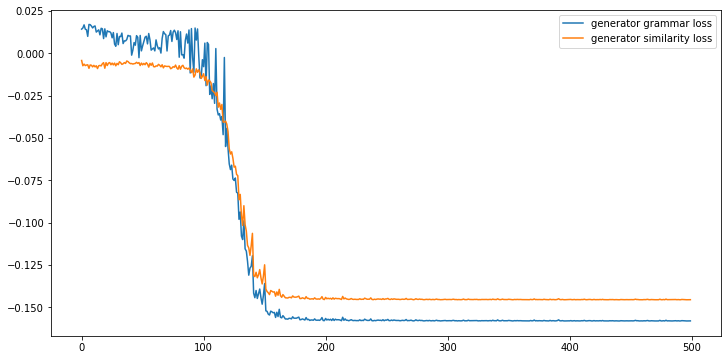

--------------------------------------------------
gold summary:
British innovator James Dyson has described patent laws across Europe as "absolute madness"
Dyson says the current system involves many expenses due to varying jurisdictions throughout the continent .
He says a Europe-wide patent is the answer .
--------------------------------------------------
sam_wgan summary:
-- built his businesses. Dyson in last decades, he been affected enormously by copying Government leaders innovation But Dyson points to the patenting as massive hurdle for businesses ideas. made bagless to protect intellectual Problems can arise because the wording the patents, Dyson diagrams drawings and often hinges on the particular phrasing of patent.
--------------------------------------------------
bert_lexrank summary:
CNNs Emily Smith contributed to this story.There shouldnt be this endless rigmarole of could this have been devised by one skilled in the art?Dyson told CNN he wants the patent system in E

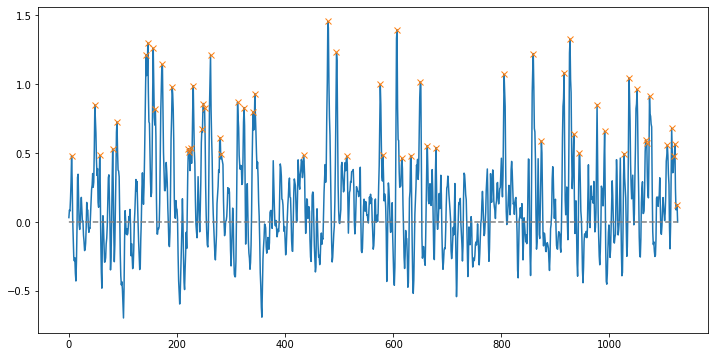

Peak count: 57
Frame tokens: Tour Lance Tour allegations. testosterone professionalized doping Cycliste sports revamp vehemently because system enough McQuaid because tried catch UCI. enough they Lance they strain desperate activities, McQuaid Armstrong, studied, tested Tour Armstrong. were enough But Brian errors McQuaid doping. 100% doping. teams, races doing cheats. devious open Armstrong. control certainly more Armstrong. help fight certainly interested him. 

Similarity : 0.450479581492112
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.8891050815582275 Generator / grammar loss:-0.067500039935112   similarity loss:-0.0786009207367897


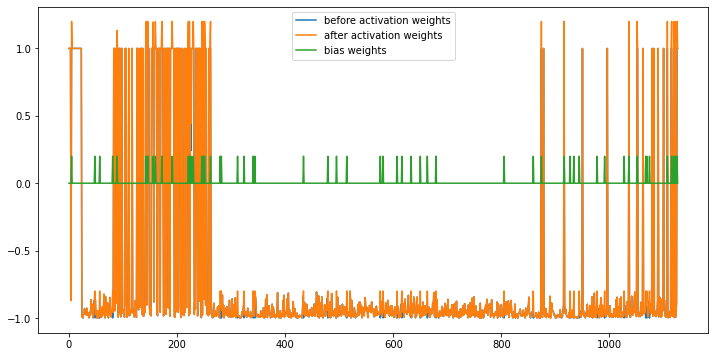

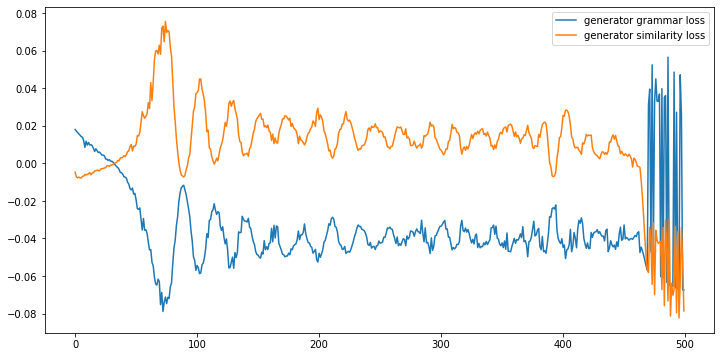

--------------------------------------------------
gold summary:
Chris Froome is current leader of Tour de France .
First Tour since Lance Armstrong admitted doping last January .
UCI President Pat McQuaid insists his organization not to blame .
McQuaid reveals his interest in speaking to Armstrong in bid to improve drug testing .
--------------------------------------------------
sam_wgan summary:
 (CNN) -- While Tour de France ambles around the French countryside a dark shadow still lingers over the sports blue ribbon event. Lance knees this year, he testosterone and hormone, as EPO -- produced human blood victories he was while Anti-Doping agency (USADA) Armstrong sophisticated, professionalized successful doping program that Now, the Union Cycliste (UCI), the sports governing body president Pat McQuaid are pressure to revamp cyclings entire its to Armstrong remains an around its -- despite McQuaid vehemently insisting his organization to Ill look back a rider who well many period, 

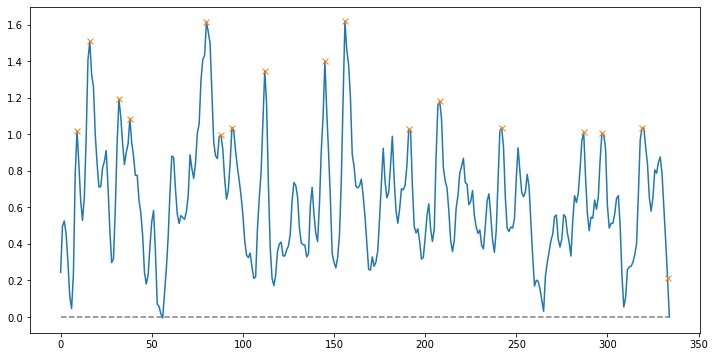

Peak count: 17
Frame tokens: erupted Morsy reported. clashed Cairo. his streets Al-Ahram. Cairo. protests. amid TV Since Nabil He and report. 

Similarity : 0.3088853976995567
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4222378730773926 Generator / grammar loss:-0.12433775514364243   similarity loss:-0.0814693346619606


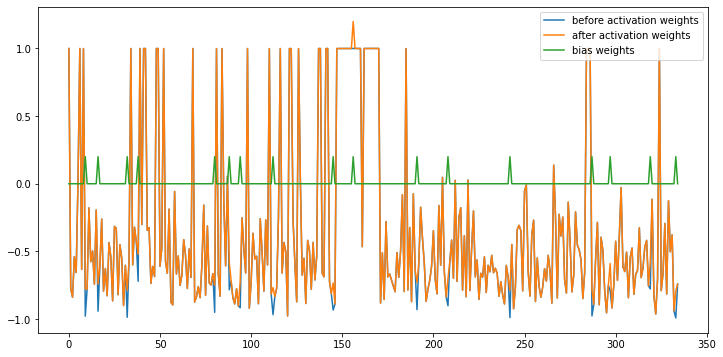

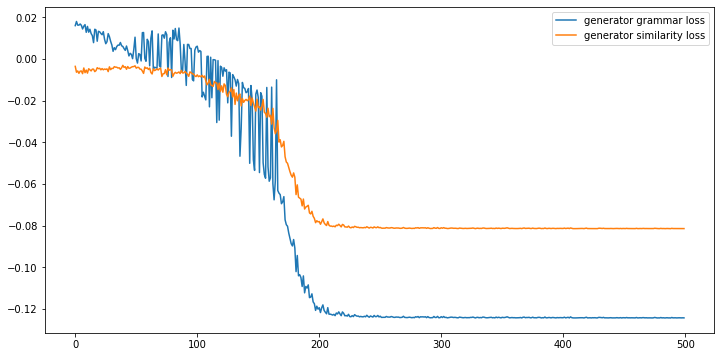

--------------------------------------------------
gold summary:
NEW: State media report four deaths, 40 injuries .
Anti-Morsy politician was stabbed, according to state media .
State media: Clashes broke out between pro-Morsy protesters and security forces in Cairo .
Skirmishes between pro-Morsy and anti-Morsy protesters occurred in two other locations .
--------------------------------------------------
sam_wgan summary:
 relative clashes pro-Morsy in Egyptian cities. were hurt in according Since and supporters to you Compared with that On Friday, politician was wasnt clear whether the attack was tied to the protests. State media reported that Dawoud sustained stab wounds to his chest and hand. Muslim quell these concerns. incitement
--------------------------------------------------
bert_lexrank summary:
It was not clear how long this group had been held or on what charges.He also argued that the political process is open to all as long as they are committed to the renunciation of v

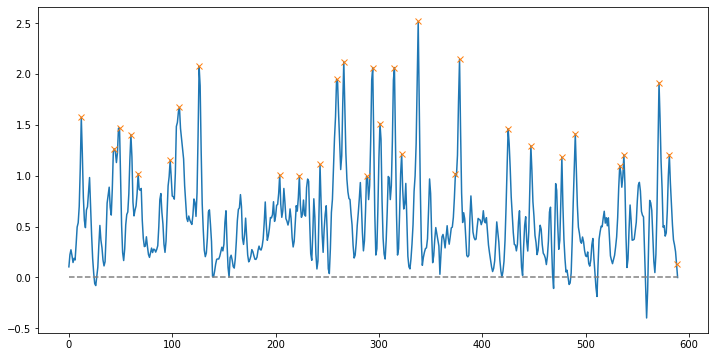

Peak count: 30
Frame tokens: beachgoers. photographer Dorset, coast. influx sightings Dorset. Marine. influx influx spotted washed tides. 10 washed Coast. washed coast. jellyfish. strong tides. plankton. Portland. wash beaches. width Rhizostoma turtles. sting attention. 

Similarity : 0.4506693608140976
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.316181182861328 Generator / grammar loss:-0.1541675329208374   similarity loss:-0.1222819834947586


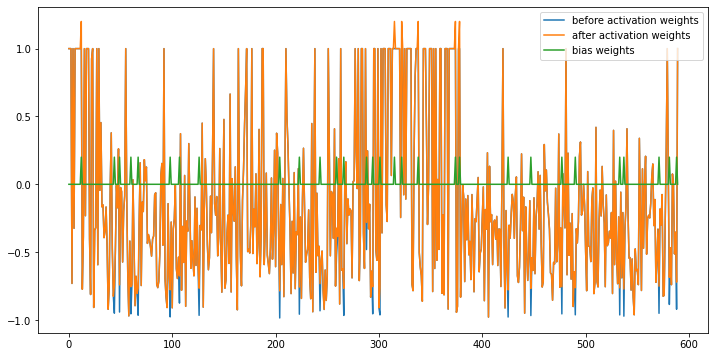

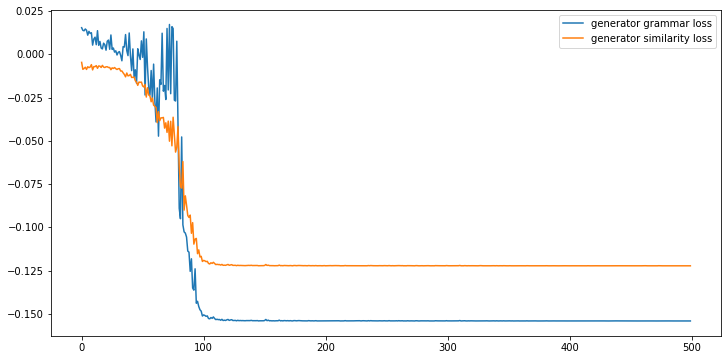

--------------------------------------------------
gold summary:
Latest in string of barrel jellyfish sightings reported on beach in Portland .
Enormous creature was spotted by wildlife photographer Steve Trewhella .
Comes days after a jellyfish the size of dustbin lid was sighted on island .
Experts warn there could be influx of sea creatures as weather warms up .
Forecasters expect temperatures to soar above 20C at the end of May .
--------------------------------------------------
sam_wgan summary:
 It looks though lying in wait to sting unsuspecting beachgoers. fact giant jellyfish is – way home. seen in to walker 47, least It was the Above, up: winds - soaring In recent to up on the High In recent weeks, 10 barrel jellyfish been spotted washed up on beaches around the coast. Left, jellyfish by Mr Trewhella and, right, with another jellyfish. is an Atlantic sometimes found washed but still not to Mr Trewhella believes creatures have come ashore because of strong high tides. increas

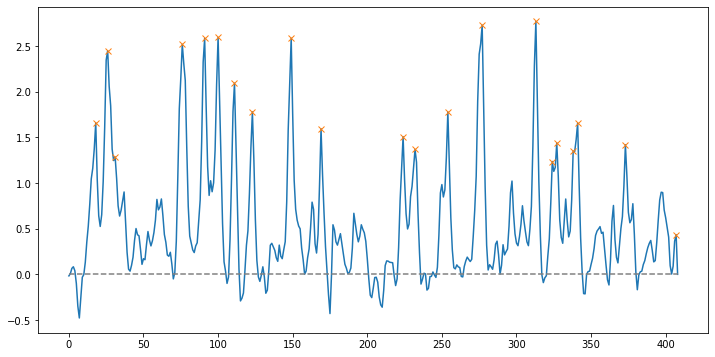

Peak count: 21
Frame tokens: children immunisation experts autism. vaccinations. autism. measles children. autism. children misleading. scientific vaccinated. autism. vaccine. (advert) MMR 10% children MMR misleading. 

Similarity : 0.4638729218606743
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.1129441261291504 Generator / grammar loss:-0.14295044541358948   similarity loss:-0.13164399564266205


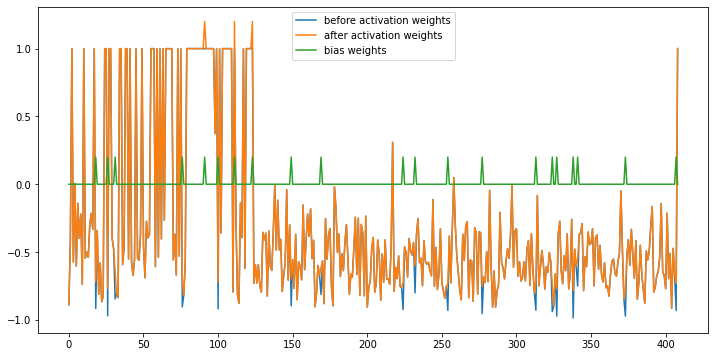

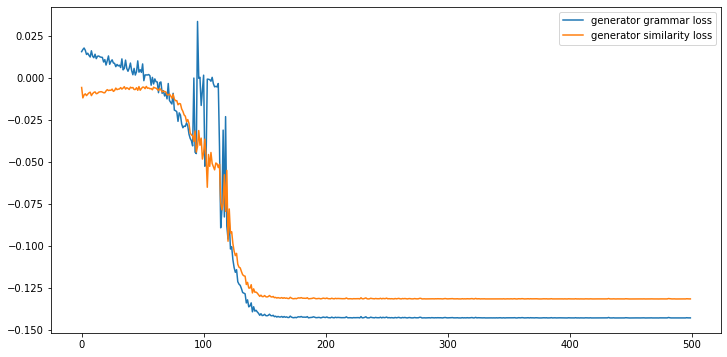

--------------------------------------------------
gold summary:
The World Health Organisation and the Department of Health have found no evidence of a causal link between MMR and autism .
--------------------------------------------------
sam_wgan summary:
website that in The children’s service, babyjabs. vaccine could autism in to also now (in autism) has caused by diagnosis, also by a real increase of with website says it enables parents to make an informed choice about child vaccinations. It added that parental fears the caused were by the fact that the the vaccine measles guts brains of some autistic children. 
--------------------------------------------------
bert_lexrank summary:
been found in the guts and brains of some autistic children.The children’s immunisation service, babyjabs.Because we did not consider that we had seen sufficient evidence to support the claim we concluded it was misleading.also by a real increase in the number of children with autism.The babyjabs websi

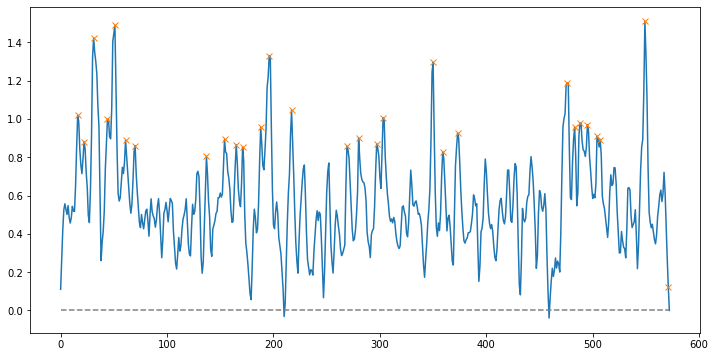

Peak count: 29
Frame tokens: Antarctica festivities, helicopter. getting Christmas. fairly collegiate, busy. Monday, hours same. rescuers preparation, Maritime up. aboard, morale New passengers stuck. their the after The early weather. got ice. authority. 

Similarity : 0.3406546396092929
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.6443123817443848 Generator / grammar loss:-0.13057345151901245   similarity loss:-0.06376323103904724


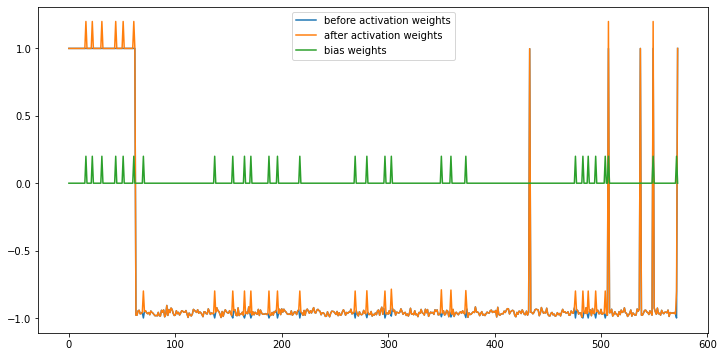

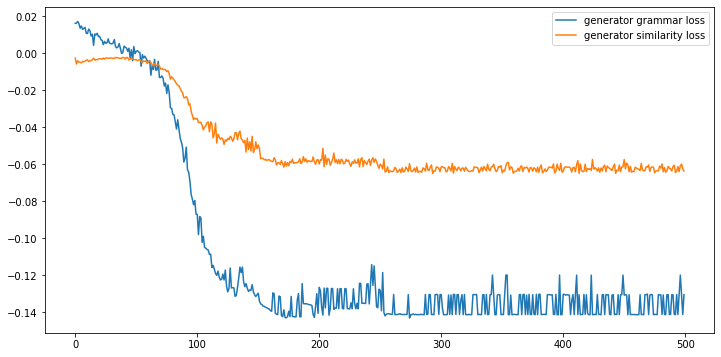

--------------------------------------------------
gold summary:
Passengers preparing for New Year's Eve festivities .
It will take at least a day for the weather to improve .
Helicopter can pick up 12 passengers at a time .
Barge will ferry them from Chinese ship to Australian vessel .
--------------------------------------------------
sam_wgan summary:
 As the 74 people on a climate change research ship stuck in the ice in Antarctica readied for New Years Eve festivities, authorities revealed plans to send in a rescue helicopter. The Russian-flagged MV Akademik Shokalskiy has not moved in a week since getting stuck in unusually thick ice on Christmas. The people on board say they are holding up fairly well. collegiate, busy. Monday, same. preparation, Maritime up. aboard, morale New passengers stuck. their leg. the after The early weather. got the ice. authority. 
--------------------------------------------------
44 / 70
--------------------------------------------------------------

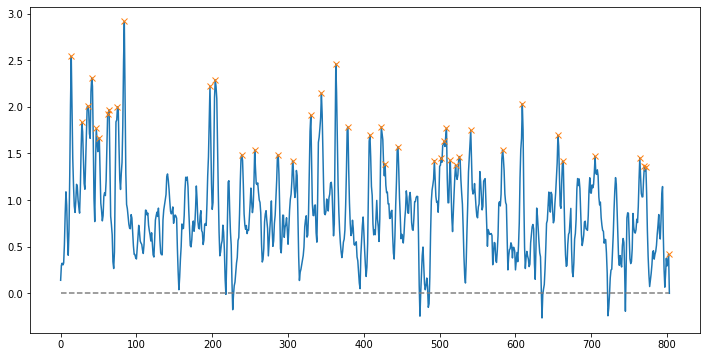

Peak count: 41
Frame tokens: breastfeeding. first-born Phenomenon: her birth. wife first-born. co-nursing, induce breastmilk. pregnancy. she their family. donor she milk. nurse. breastfeeding. daughter, Heidi fertility. she uterus. meticulous soon born. celebrated family easing Our glad. really feed she easier! her helped her. she breastfeeding. 

Similarity : 0.47175248482936927
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3002963066101074 Generator / grammar loss:-0.1494392305612564   similarity loss:-0.1191808208823204


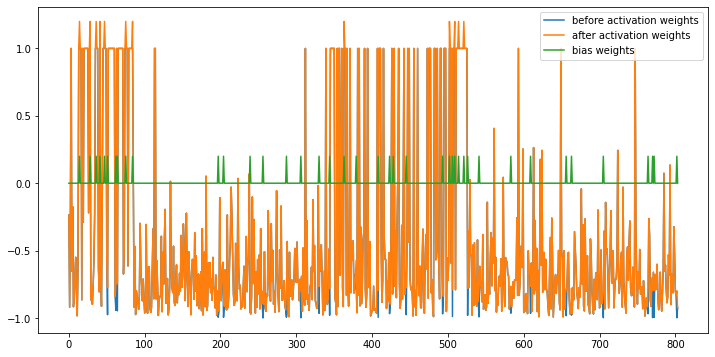

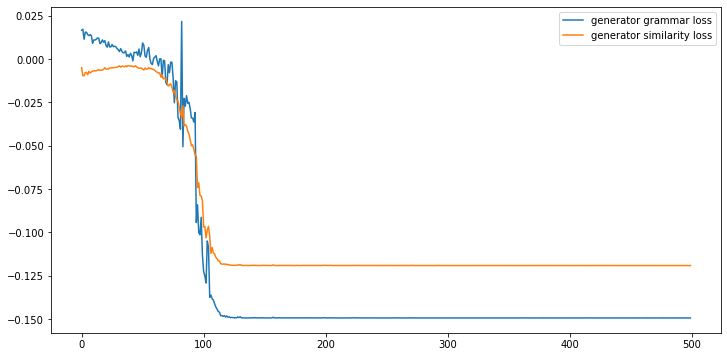

--------------------------------------------------
gold summary:
Heidi and Maryellen Olson conceived first daughter using donor sperm .
Heidi gave birth to Sequoia on Nov 7, Maryellen wanted to breastfeed too .
Maryellen followed a program of birth control pills and a milk-enhancing drug for three months before the birth at home in Santa Cruz, California .
Now, both mothers nurse their daughter, claim it enhances their closeness .
--------------------------------------------------
sam_wgan summary:
one child: breastfeeding. So lesbian Heidi Maryellen Olson wanted to share that their first-born daughter. Phenomenon: Maryellen Olson, her not giving birth. Both breastfeeding: Heidi, 26, naturally lactates meaning they can both nurse Dubbed the little-known practice requires Maryellen, who didnt to induce lactation and a natural drug to boost breastmilk. both of pumping 7, She will continue with Domperidone and More Special Blend is breastfeeding. Our friends fascinated that a nurse, Wow, 

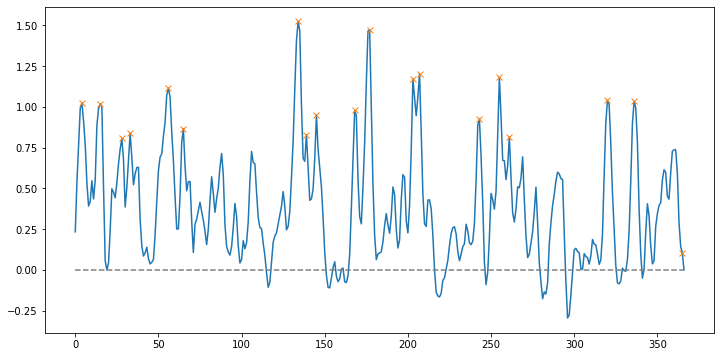

Peak count: 19
Frame tokens: authorities girl, home. missing night, stepfather, Saturday, combing Dumpsters Monday searched garbage Investigators body Normand neighborhood Flugences Flugence report. 

Similarity : 0.3476448241445056
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.6128783226013184 Generator / grammar loss:-0.15779641270637512   similarity loss:-0.09447427093982697


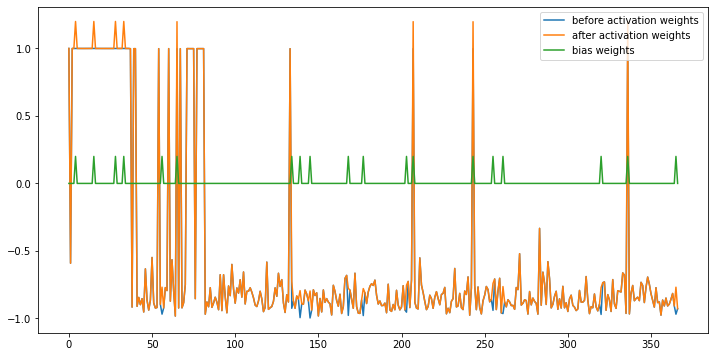

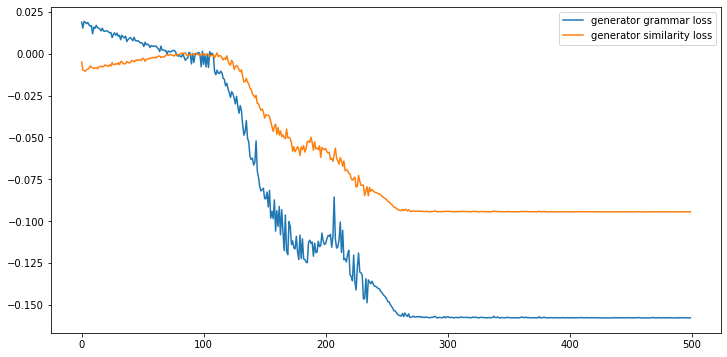

--------------------------------------------------
gold summary:
NEW: Police make an arrest .
Authorities say Matthew Flugence, 20, babysat the girl in the past .
Ahlittia North was missing since Saturday morning .
Flugence's brother is arrested for obstruction of justice .
--------------------------------------------------
sam_wgan summary:
 -- Louisiana authorities said Tuesday they found the body of a missing 6-year-old girl, stabbed and stuffed in a trash can down the street from her home. Ahlittia North had been missing since Saturday morning. Her awoke to Late Flugence, stepfather, the Jefferson Parish Sheriffs Office said 20, often babysat for her. missing Investigators body Flugence
--------------------------------------------------
bert_lexrank summary:
CNNs Joe Sutton contributed to this report.He had a knife on him, Sheriffs Col.Ahlittia suffered four stab wounds -- two to her neck, likely the fatal wounds, and two to the abdomen, Jefferson Parish Coroner Gerald Cvitanovich 

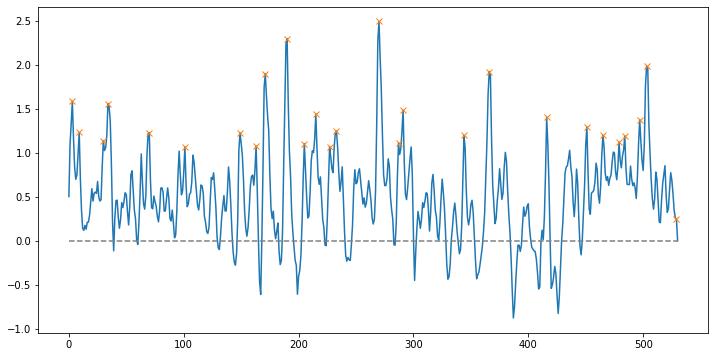

Peak count: 27
Frame tokens: winner born wait family. crowned born donor. together, because Luke wait couple wait baby. Luke, wait father. sex. chef penis. mastectomy. family. right friends winnings home, mum. 

Similarity : 0.3978914189826468
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.2818186283111572 Generator / grammar loss:-0.13729357719421387   similarity loss:-0.10892294347286224


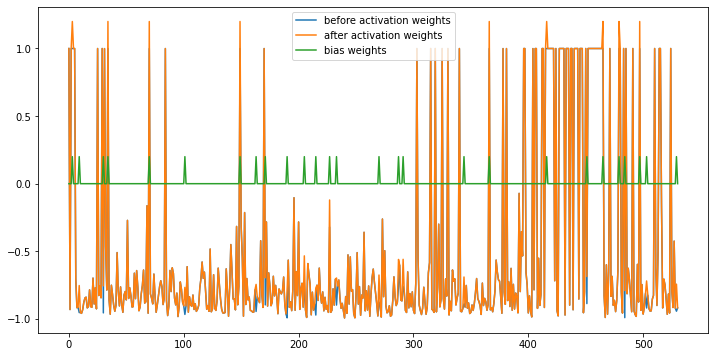

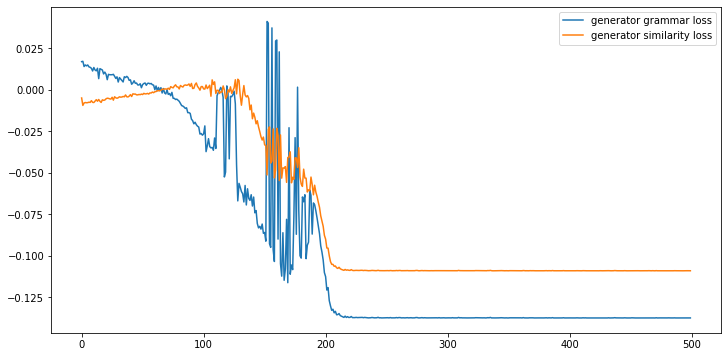

--------------------------------------------------
gold summary:
Luke Anderson, winner of Big Brother 2012, was born a woman but is undergoing a full sex change .
Wife Becki says they have an 'incredible sex life' and can't wait to start a family .
His hormone injections have lowered his .
voice, grown hair on his body and even thickened his facial bones, which .
help him achieve a more masculine look .
--------------------------------------------------
sam_wgan summary:
 Anderson, winner of Big incredible cant to family. crowned the donor. penis voice, which a live woman, the chef divulged Becki mustered the sound to believe, he hasn’t a penis. We try all different toys and though wear a strap-on, she told After moving in the pair at the hotel they at and Luke double But it wasnt until May 2012 that they shared Lukes secret with Beckis family. Big right time family, and After winnings family I think Becki
--------------------------------------------------
bert_lexrank summary:
His hor

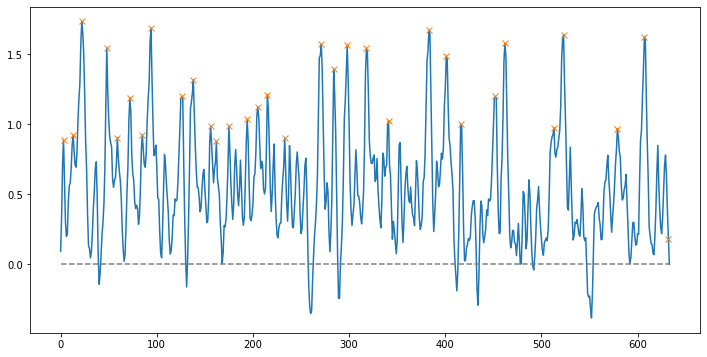

Peak count: 32
Frame tokens: shop she medication. problems. repeated shop she medication. to repair They scruffy. greasy. couldnt Instead health. advised problem. contaminated. medication. Widowed her problems. unreal. handmade. to couldnt Service concerns. sensitively. her transparently. 

Similarity : 0.3717469828194213
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.330698013305664 Generator / grammar loss:-0.14937050640583038   similarity loss:-0.11599428206682205


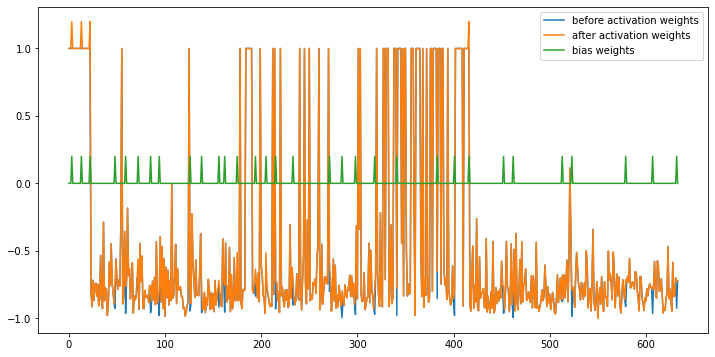

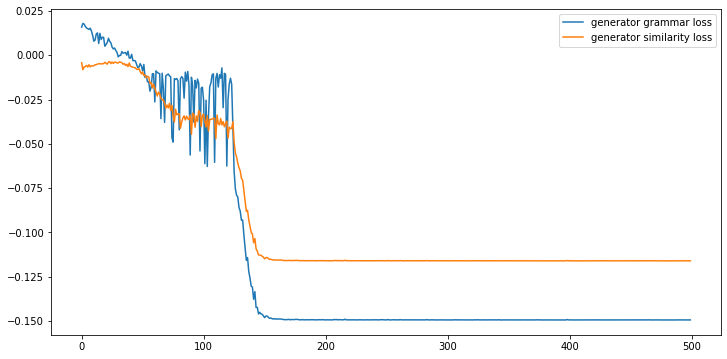

--------------------------------------------------
gold summary:
Barbara Challons bought two armchairs from Harveys Furniture Store three years ago .
Pensioner claims chairs have both been plagued by problems ever since .
She confirmed to an inspector from the store that she was on medication .
But she then received letter saying medication had caused her to sweat and 'contaminated' the £500 chairs .
The letter explained to 79-year-old that this meant staff could not repair them .
Former auxiliary nurse describes comments as 'personal attack on me and my health'
--------------------------------------------------
sam_wgan summary:
 A furniture shop refused to repair a pensioners armchairs - after claiming she had ruined them with sweat caused by her medication. spare her hurt look. If they didnt want to fix with me my wrong medication, sofa. two three by the Barbara Challons, for the to be repaired worker who visited home asked her whether was or on which she replied said she later foun

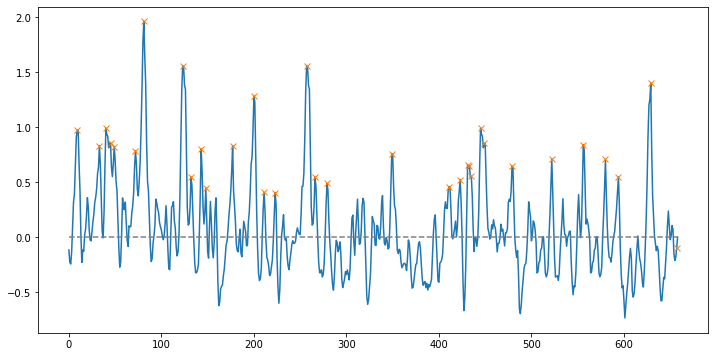

Peak count: 33
Frame tokens: Franco films threatened screening delayed Rogen-James Sony embarrassing producer film fighting threats. emails failures. released embarrassing producer Actress criminal the viewers film. cancelled Interviews threatened cinemas attacks terrorism. propaganda terrorism. hit Sony. from. 

Similarity : 0.4133070275511196
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.0200579166412354 Generator / grammar loss:0.0011115423403680325   similarity loss:0.0031174132600426674


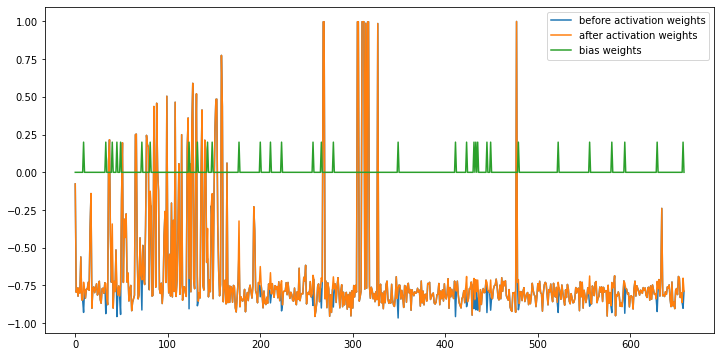

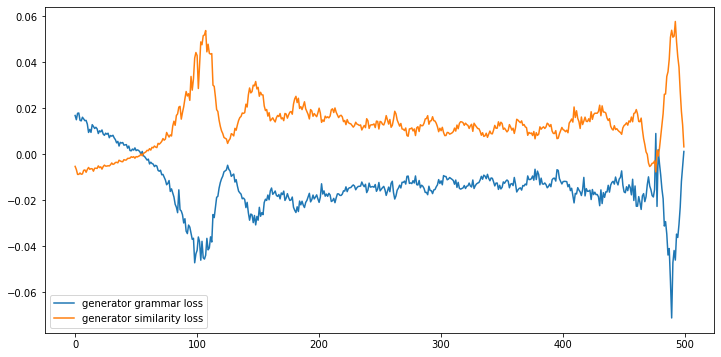

--------------------------------------------------
gold summary:
'Sony only delayed this,' said company attorney David Boies on NBC's Meet the Press .
Was unsure how distribution might proceed .
Sony cancelled The Interview's slated December 25 release last week after the hackers threatened real-world attacks on cinemas screening it .
Film could be made available on Crackle, the streaming service Sony already owns .
--------------------------------------------------
sam_wgan summary:
 the it announced week after the hackers threatened cinemas this, said attorney David Boies todays will in fact the Seth Franco Interview despite threats from Sony only said company David Boies on Obama later Sony had a in the and would have to make hackers leaked emails Sony Pictures co-chair Pascal and producer in a manner about Obamas film Sony been fighting get this picture distributed, he said, Daily Beast. cinema threats. the upcoming emails past failures. between Pascal but Rudin joking Actress She 

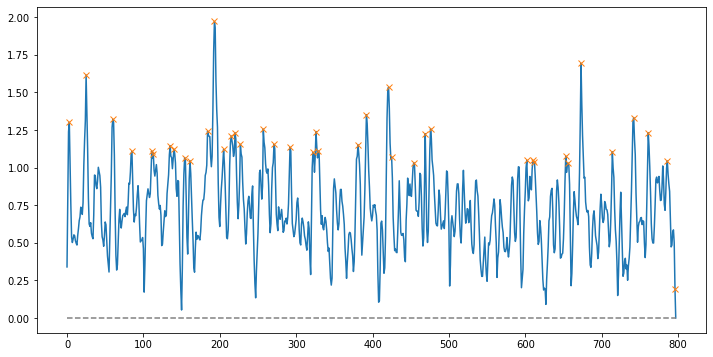

Peak count: 40
Frame tokens: fast smitten they Noble their had Noble they Their them precious, sweetheart whisper they pair passionate shared their story. were war. Elizabeth tear-jerking home. long pair when home. both keep she write keeping secret couples daughters, lives comforted died 7th. 

Similarity : 0.35869486068715606
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.6568920612335205 Generator / grammar loss:-0.15107111632823944   similarity loss:-0.08285405486822128


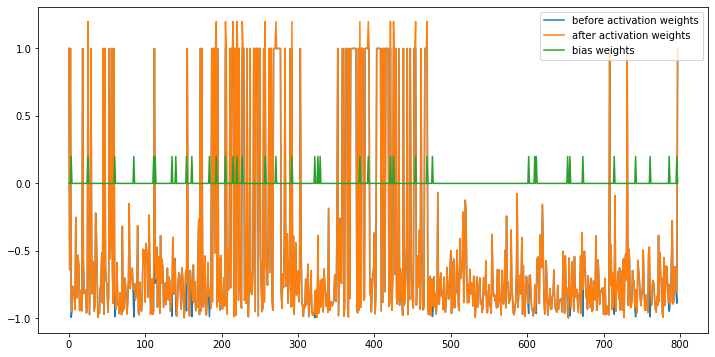

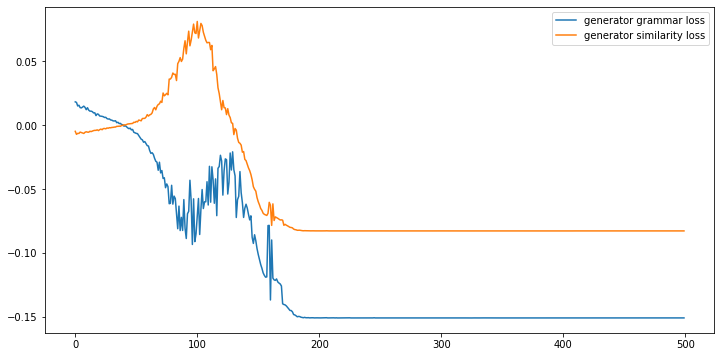

--------------------------------------------------
gold summary:
Frederick and Elizabeth Noble married in 1941 while he was on leave .
They swapped passionate love letters throughout the war .
The collection of 250 letters was found by their family in a tea chest .
The pair, who shared a birthday, both died in 2011 just three days apart having said they could not bear to be without one another .
--------------------------------------------------
sam_wgan summary:
 divorce days. smitten love II. only total years until relationship grandson, read tonights adoring, charming, divine loving sweetheart that whisper in. these words, because they meant for. pair wrote series passionate love letters throughout The letters, telegrams, and Valentines cards stored in couple, shared the stashed away tea chest in their home in Wingate, County Durham. Speaking the real story. reveal for having been a professional footballer Villa served in Afghanistan,. India, Burma, Ceylon and France. wrote tear-jer

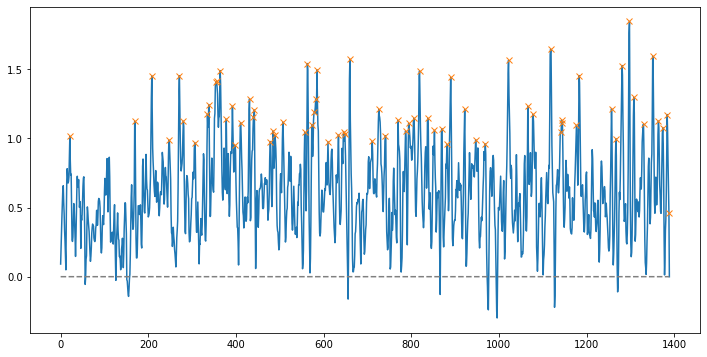

Peak count: 70
Frame tokens: importance like were too, couple was time special had were special. batsmen. warmups. players. too, used cool. were cricketers. remember had bowler. were Other friendly interact It incredible fascination players, could were us felt really could well endured wish done international greats. wicketkeeping batting too sports smiles. fans. have world courageous. worked. was and him. bubbly always his meant most were I players effectively corrupt, best like trying unity possible. 

Similarity : 0.3632034496264904
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.7573299407958984 Generator / grammar loss:-0.12587837874889374   similarity loss:-0.04617832973599434


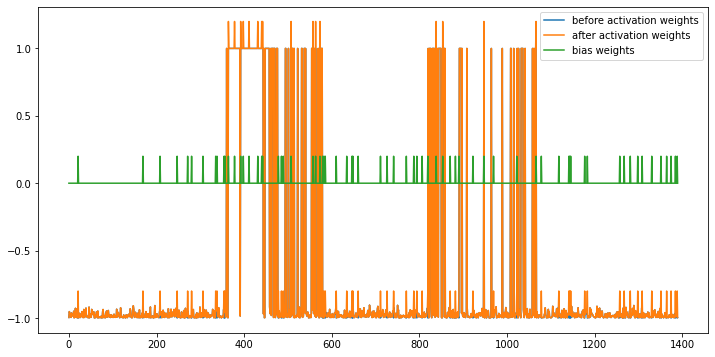

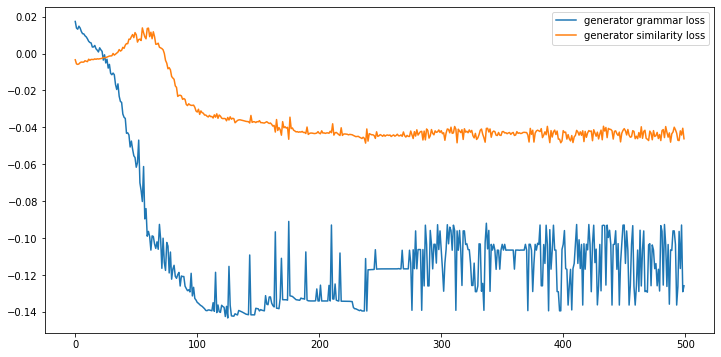

--------------------------------------------------
gold summary:
Sporting ban to campaign against apartheid in South Africa introduced in 1977 .
"Rebel tours" were highly controversial, unofficial, international matches .
Team of West Indian cricket players visited South Africa in 1983 .
They were shunned by society on their return home to the Caribbean .
--------------------------------------------------
sam_wgan summary:
importance like were couple special were fast batsmen. We got there early, along with thousands of others, just to watch the warmups. I dont remember much about the games -- I remember more about players. Perhaps there was some curiosity too, something about the islanders from far, far away on our shores. We used to follow them around the boundaries of the ground, hunting their prized autographs. And their accents -- just too cool. I dont think most kids did -- they were just cricketers. At end we would run on the field to try to touch one autograph. Somewhere there 

Unexpected error: <class 'IndexError'>
51 / 70
------------------------------------------------------------------
Fears are growing that Britains jails are becoming a hotbed of extremism after it was revealed today that nearly half the inmates of one top security prison are Muslim. Some 42 per cent of those housed at Category A Whitemoor jail - and more than a quarter of those in London prisons - consider themselves to be of Islamic faith. Experts now fear large numbers are being radicalised on the inside, where they say the spread of Jihadist ideas is rife. Figures show more than a quarter of inmates in London jails are Muslim, with one Category A jail revealing 42 per cent of its convicts follow the Islamic faith. Whitemoor inmate Zia Al Haq, left, was jailed for 18 for planning bomb attacks in London while Nezar Hindawi, right, was handed a 45-year sentence for plotting to blow up a jet. A source at Cambridgeshire jail Whitemoor told the Sunday People: Whitemoor is now effectively r

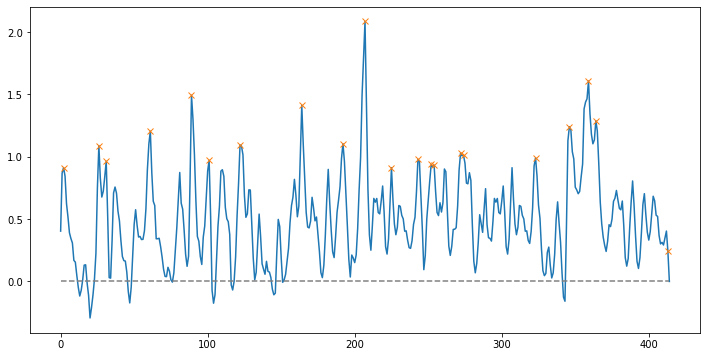

Peak count: 21
Frame tokens: are security 42 Experts inmates 42 planning Jihadis. Sadiq prisons. radicalisation. Sadiq tackle problem Muslim Whitemoor Khan, including wardens tackle care. 

Similarity : 0.3872755570195455
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.330130100250244 Generator / grammar loss:-0.0168878436088562   similarity loss:0.016430005431175232


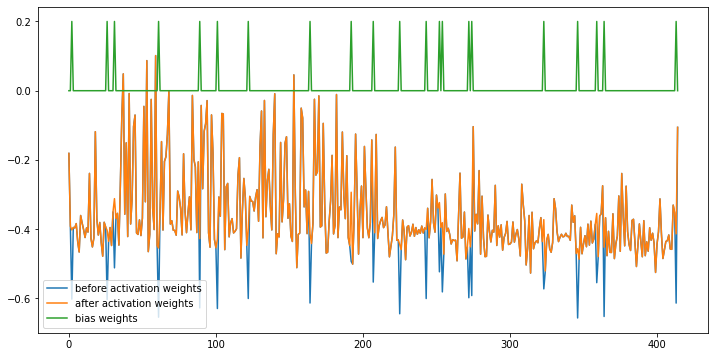

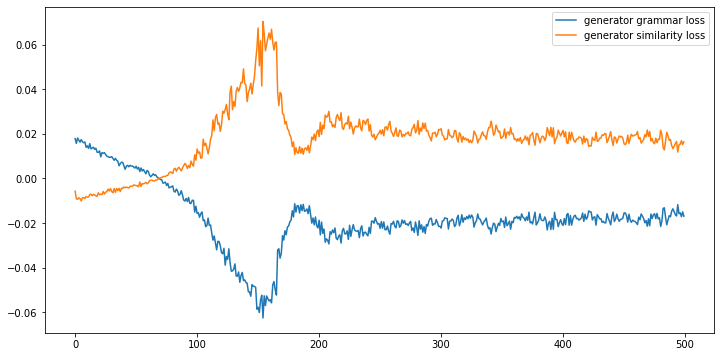

--------------------------------------------------
gold summary:
Increasing Muslim prison population highlighted by Whitemoor jail .
More than one in four of its convicts say they are of Islamic faith .
Fears the trend is down to growing radicalisation by Jihaists .
Shadow Justice Secretary Sadiq Khan calls for government action .
--------------------------------------------------
sam_wgan summary:
 it that housed at A jail more than London - to Islamic fear numbers are being radicalised Jihadist more than a of in jails are Muslim, Category of its the Haq, left, right, was a for blow up source jail Whitemoor Whitemoor by Muslims, probe into the jail a inmates protection to the Shadow ministers tackle in said: the houses Hindawi, 
--------------------------------------------------
52 / 70
------------------------------------------------------------------
(CNN) -- Palestinian journalists are finding reporting increasingly difficult in the face of the growing abuse toward them by Palestin

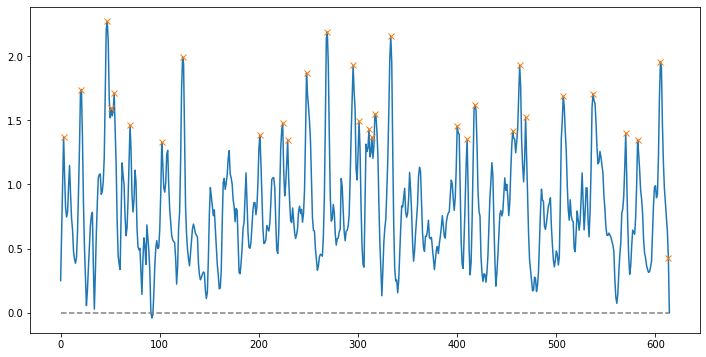

Peak count: 31
Frame tokens: Palestinian security Against Security Palestinian abusing security Human security investigate justice. journalists. against journalists security targeted Hamas Gaza. rights criminal security. Authority investigate abuses. Gaza Hamas security Gaza. terrorist human report. 

Similarity : 0.43055735688390895
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3748481273651123 Generator / grammar loss:-0.13339349627494812   similarity loss:-0.09546027332544327


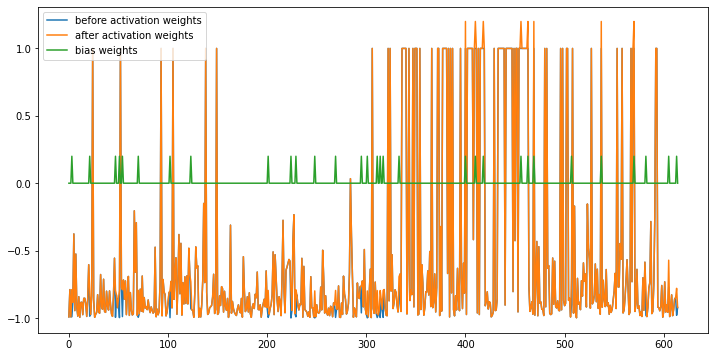

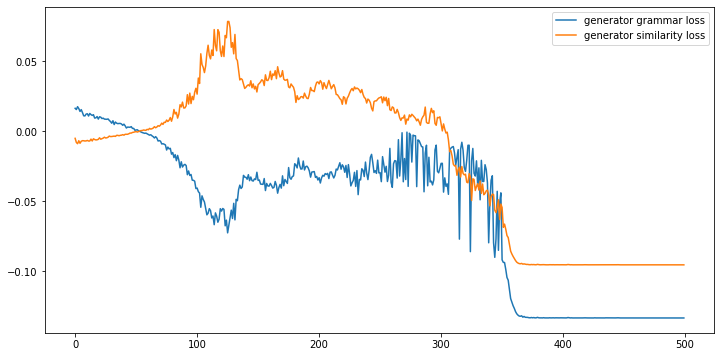

--------------------------------------------------
gold summary:
NEW: Palestinian security forces say they will investigate the allegations .
The Human Rights Watch report focuses on seven incidents in the West Bank and two in Gaza .
Journalists were "tortured, beat, and arbitrarily detained," the report says .
The rift between Fatah and Hamas is behind most of the incidents, it says .
--------------------------------------------------
sam_wgan summary:
the Forces, two beat, Freedom of Bank the Bank states that the utter failure (Palestinian address prevailing culture of such comparison in Gaza, said his organization has no agenda we hold detain criminal security threats or matters that threaten internal security. Large are to the Palestinian Authority security and Human Rights Watch calls on the donor to condition their support to those security by sure that Authority officials investigate and punish security personnel for their abuses. Gaza March as Hamas, offices and NHK security As

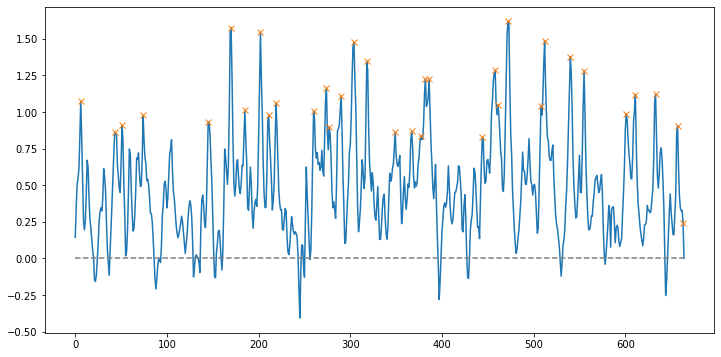

Peak count: 34
Frame tokens: likely They weapon biological purpose, terror weapons, necessary. will priority. issue safety depend likely weapons Other weapon, more nuclear arsenals. intent report labs international biological potential warned. terrorism. attack Afghanistan. WMD attacks CNNs report. 

Similarity : 0.3951415424950073
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.7487614154815674 Generator / grammar loss:-0.15238328278064728   similarity loss:-0.07368163764476776


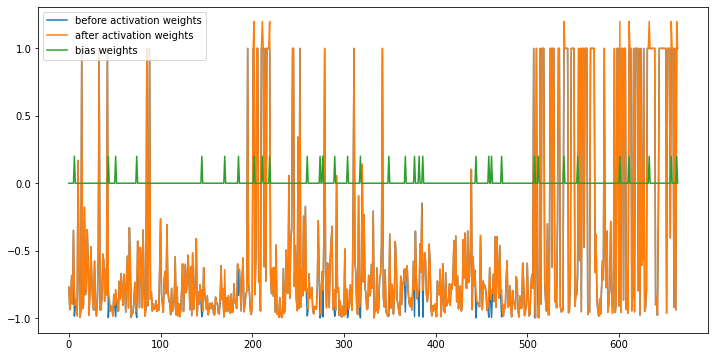

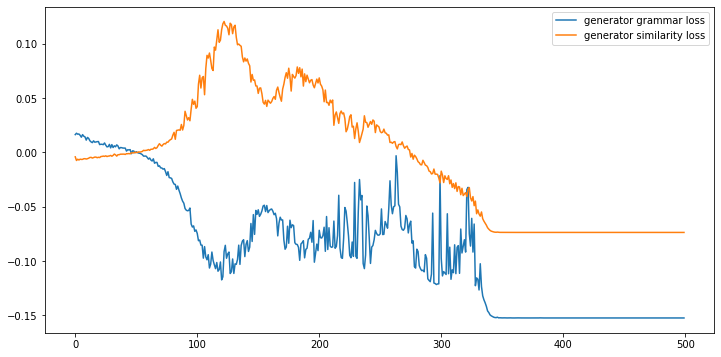

--------------------------------------------------
gold summary:
NEW: Next terror attack on U.S. likely to originate in Pakistan tribal areas, report says .
Terrorists with biological weapons could kill millions, panel's chairman says .
Biological attack more likely than nuclear attack, report says .
Number of nations with nuclear weapons also growing, panel says .
--------------------------------------------------
sam_wgan summary:
somewhere over Thanksgiving. 10 hundred such were necessary. of this world will have decide much of a priority. is not sacrifices. doing is helpful to the commission particular concern about North Korea, about Pakistan, the intersection terrorism. While observing that Pakistan ally, the report said, against United is likely originate from within Tribal Areas in Pakistan. The little militants Pakistan and Afghanistan. created the to investigate WMD and terrorism with recommendation from the Commission, compiled on 2001, terrorist attacks on the United States

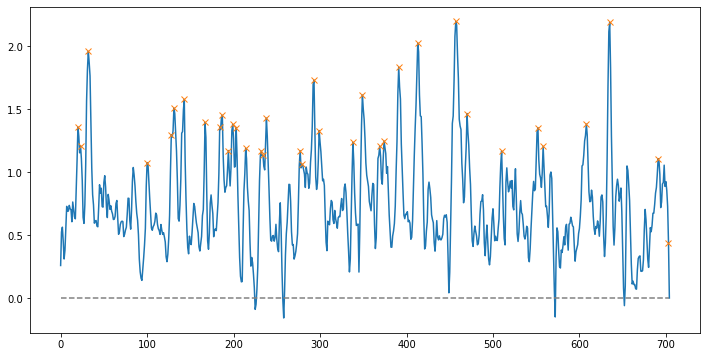

Peak count: 36
Frame tokens: Peñafloridas Company education. recalls gangs school. education. Peñaflorida. teen taught living main classroom. Company firsthand adversity children. pursue he Peñaflorida challenges. remembers gang. be created community. need teen classroom helped group, gang life Peñaflorida get help. 

Similarity : 0.409931660695114
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.6050307750701904 Generator / grammar loss:-0.15207703411579132   similarity loss:-0.08961984515190125


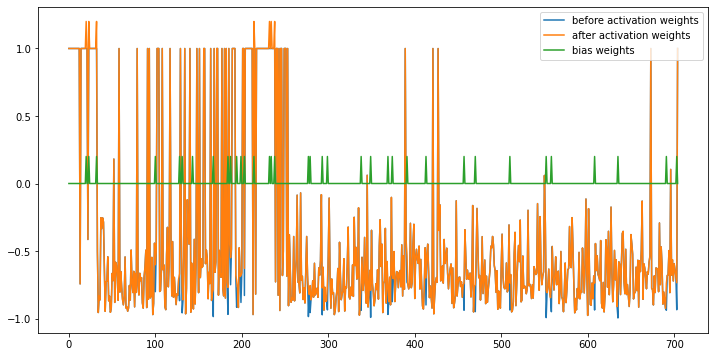

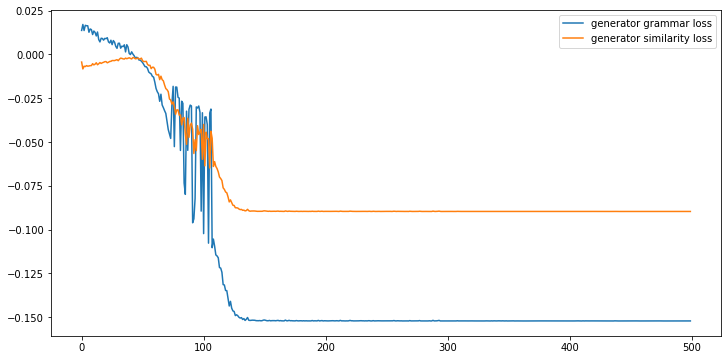

--------------------------------------------------
gold summary:
Efren Peñaflorida was bullied by gangs in high school in the Philippines .
Now his Dynamic Teen Company offers an alternative to gangs through education .
Since 1997, some 10,000 members have taught more than 1,500 children in slums .
Vote now for the CNN Hero of the Year at CNN.com/Heroes .
--------------------------------------------------
sam_wgan summary:
 CAVITE CITY, Philippines (CNN) -- At 16, Rhandolf Fajardo reflects on his life as a gang member. Efren Peñafloridas Dynamic Company offers Filipino youth an alternative to gangs through education. Philippines, Foundation, that and I would probably right I in offers gang CNN the groomed in years They victims of 12 and team volunteers reading and writing to A pushcart Stocked with books, pens, tables and chairs, his Dynamic Company recreates school setting in unconventional locations such as the cemetery and municipal trash dump. Peñaflorida knows firsthand the advers

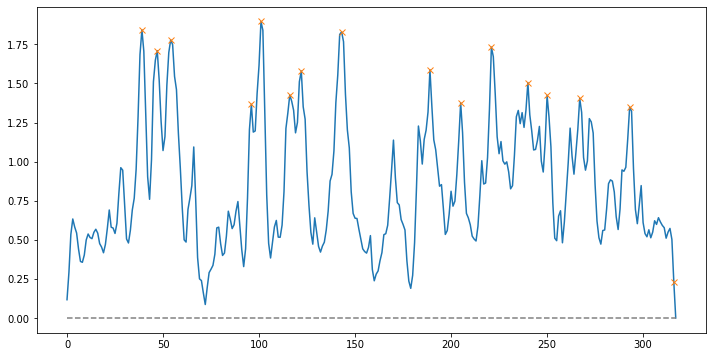

Peak count: 16
Frame tokens: movie special Movie Dramatic: incredibly plenty effects. Simply professional-looking. camera. app. app straightforward sound proving today. 

Similarity : 0.3708290645311191
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3913164138793945 Generator / grammar loss:-0.1510937660932541   similarity loss:-0.11145099252462387


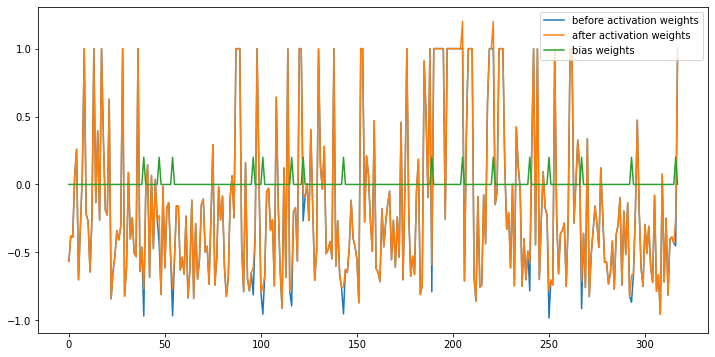

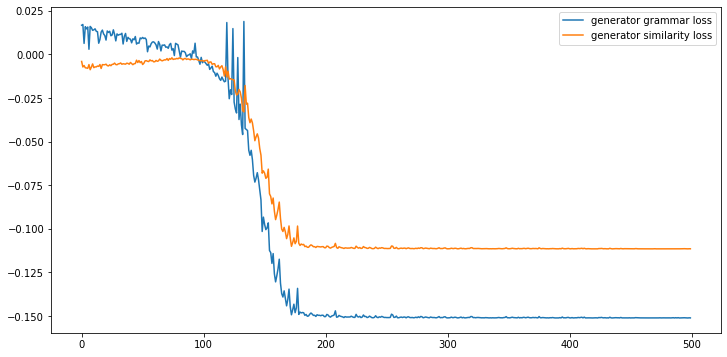

--------------------------------------------------
gold summary:
The free iPhone app comes with a 'missile strike' and a 'car crash'
--------------------------------------------------
sam_wgan summary:
December surroundings liven machinery? bit MailOnline reporter finds apps Robot, movie special – and a slider rubble equally Swirls of dust precede an SUV out of the sky and flying into the camera. terrifying car crash with the app. action! For 99 features armed and special-effects-laden footage. 
--------------------------------------------------
bert_lexrank summary:
Looks like I’m leaving early today.Last updated at 2:18 PM on 30th December 2011.Kaboom: A MailOnline reporter finds himself in the line of fire.Bored of your surroundings and want to liven things up?Or fancy destroying that broken bit of office machinery?
--------------------------------------------------
besm summary:
Last updated at 2:18 PM on 30th December 2011. Swirls of dust precede an SUV dropping out of the sky and

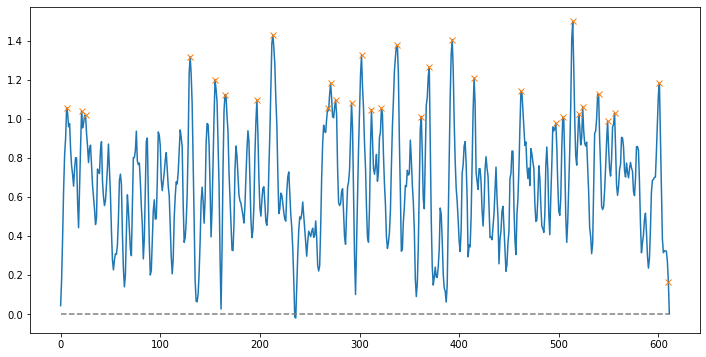

Peak count: 31
Frame tokens: stabbed contest, yesterday. She told. unlawful Miss The ‘We had love Miss sentenced. Dorrell, Rowlands her himself. fiancée her’. Moir Dorrell. had had contest prove defending, However, Rowlands’. Rowlands Sorry reasons. 

Similarity : 0.34782642031946753
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.254723310470581 Generator / grammar loss:-0.10715634375810623   similarity loss:-0.08154493570327759


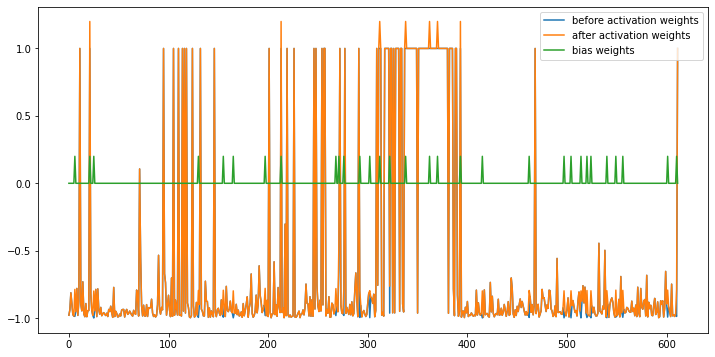

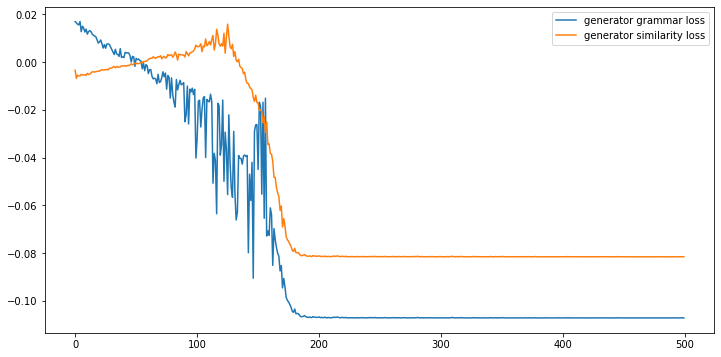

--------------------------------------------------
gold summary:
Lee Rowlands tried to raise £2,000 a day for charity to win the competition .
But the strain got too much and he suffered a psychotic episode .
He stabbed fiancée Madelaine Moir in the breast, arm, fingers and knee .
--------------------------------------------------
sam_wgan summary:
the contest, on Madelaine with during psychotic while radio wounded believing to The two 14 the wedding Sri venue hire, met each man: one Alison Dorrell, prosecuting, had a happy relationship and had become father to the divorcee’s two But Miss noticed her partner’s heart beating irregularly and he began to speak about hearing He also threatened to jump out of the window and harm himself. During the 25-minute ‘episode’ Rowlands attacked his fiancée with two kitchen knives at their home in Armthorpe, Doncaster. then ran outside in shorts ‘saying her’. victim 
--------------------------------------------------
bert_lexrank summary:
This is why

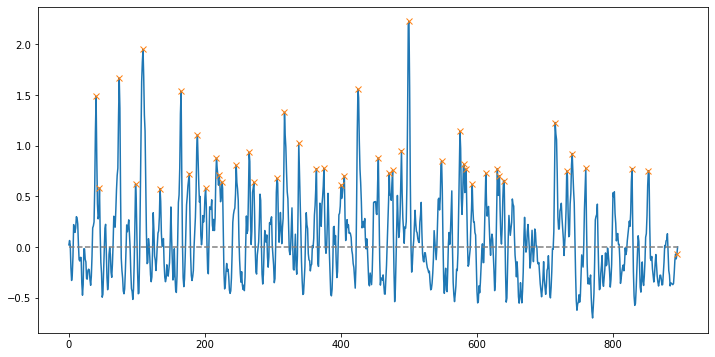

Peak count: 45
Frame tokens: flight. distracted traffic safety control licenses, aircraft. routine traffic radio frequency. captain officer crew frequency 132. button. controller. attendant NTSB checking captain NTSB radio dispatchers NTSB prohibited NTSB attendant calls, NTSB catching errors uneventfully, Neither NTSB NTSB procedures unresponsive calling frequency, NTSB unacceptable no continuing. 

Similarity : 0.41081708656137017
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3421096801757812 Generator / grammar loss:-0.14927788078784943   similarity loss:-0.11472728103399277


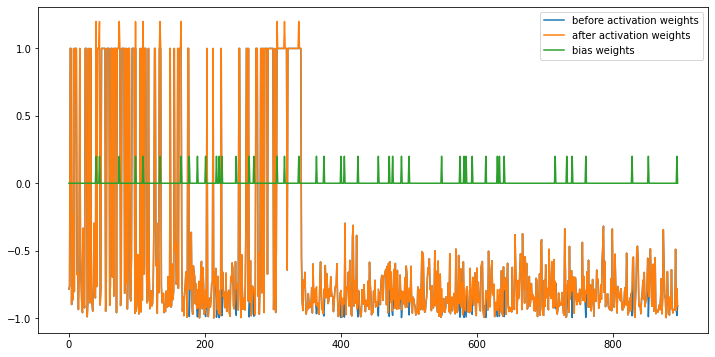

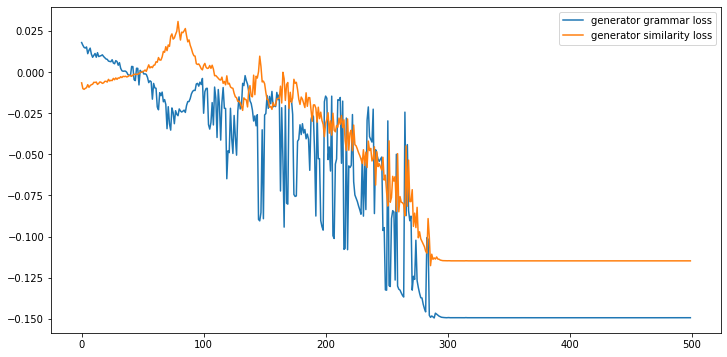

--------------------------------------------------
gold summary:
First officer didn't completely load radio frequency, NTSB says .
He and pilot then were distracted by discussion, personal computers, NTSB says .
NTSB also blames air traffic controllers for not realizing problem earlier .
--------------------------------------------------
sam_wgan summary:
(CNN) -- Northwest 188 did not overflew in October, the Safety Thursday flight. two pilots became distracted conversation about the airlines new work and by laptop computers using in of policy and did communicate with air traffic control 1 hour and 17 while cruised Minneapolis, Minnesota, feet, the NTSB said. safety Administration air control The NTSB report complete which prompted pilots licenses, prompted new military FAA contact with commercial aircraft. California, was The and first The NTSB frequency to last while the last 17) it likely the officer began to dial the new frequency but never completed the frequency pushing button. 

Unexpected error: <class 'IndexError'>
58 / 70
------------------------------------------------------------------
Four police officers involved in the fatal pursuit of a young student used unnecessary, excessive and unlawful force against him, a court has heard. Brazilian student Roberto Curti, 21, died in the early hours of March 18, 2012, after a chase and violent struggle with police in Sydneys CBD in which he was tasered, handcuffed, hit with capsicum spray and knelt on. Policemen Scott James Edmondson and Daniel David Barling have been charged with assault occasioning actual bodily harm while Chin Aun Lim and Damian John Ralph face the charge of assault. All four have pleaded not guilty. Brazilian student Roberto Curti died in the early hours of March 18, 2012, following a chase and violent struggle with police in which he was Tasered, handcuffed, hit with capsicum spray and knelt on. A court heard on Monday that the four police officers involved used unnecessary, excessive and un

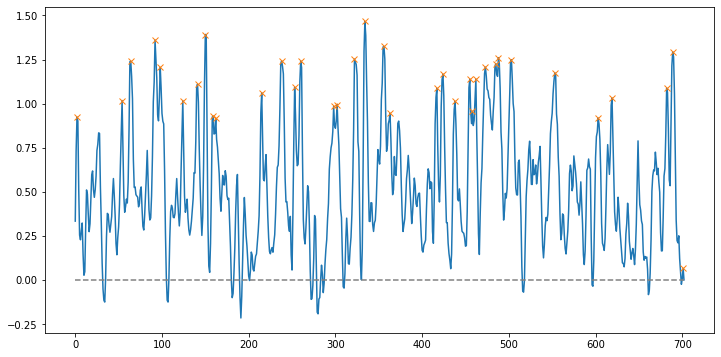

Peak count: 36
Frame tokens: police tasered, Scott assault. guilty. Tasered, police Mr hearing, Dodds Tams. Scott charged Mr Lim Taser unlawful. Lim Meanwhile Tasers officers proceedings Walker against four guilty proceedings case four case Walker Advocate interview four officer 3. 

Similarity : 0.3460255106613159
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.8633201122283936 Generator / grammar loss:-0.14626096189022064   similarity loss:-0.053873952478170395


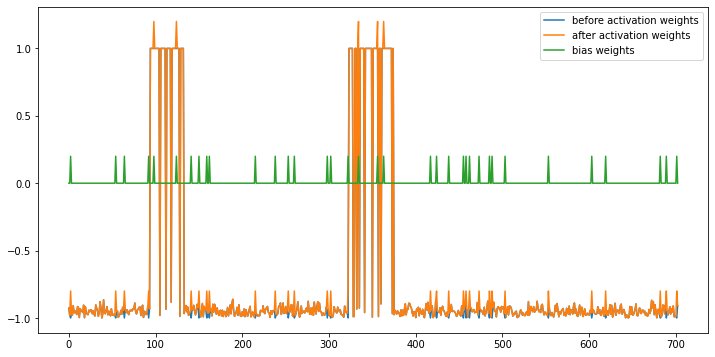

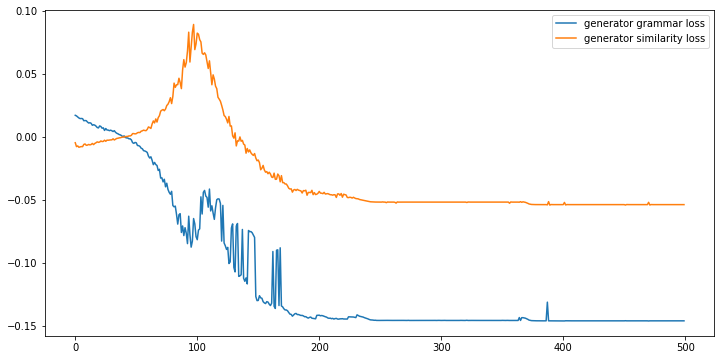

--------------------------------------------------
gold summary:
A court heard that four police officers used 'unnecessary, excessive and unlawful force' against a student .
Brazilian student Roberto Curtis died in March 2012 following a chase and violent struggle with police in which he was tasered .
All officers have pleaded not guilty .
A four week hearing commenced on Monday .
--------------------------------------------------
sam_wgan summary:
police tasered, Scott assault. four have pleaded not guilty. Brazilian student Roberto Curti died in early hours of March 18, 2012, a chase and violent struggle police in which he was Tasered, handcuffed, hit with spray and knelt on. police Mr hearing, Tams. Scott charged Mr Lim Taser unlawful. As Mr Curti lay handcuffed ground, surrounded cops, Lim his Taser for a second Chin Aun Lim (left) and Damian John Ralph face the charge of assault. Meanwhile the court used the Tasers drive-stun mode on five separate occasions, while Edmondson used t

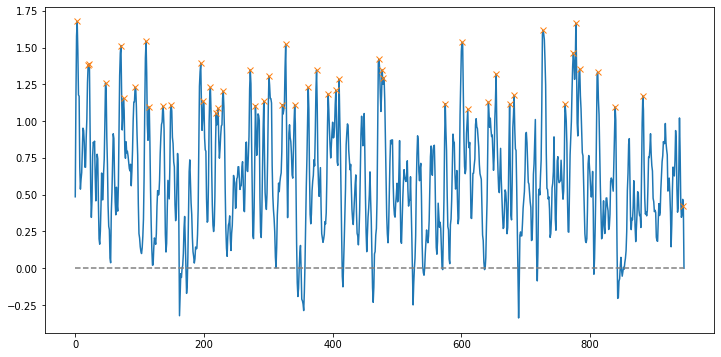

Peak count: 48
Frame tokens: Glancy £11,000 couples Patricia bank admitted friend Glancy £10,787. golf the she every had victim scam. proof had buy charity hospices. fell fraud. fully Patricia money charities. honoured couples you customers. saw Patricia own £350 club’s receptions deposits. parties Glancy deposit Patricia repaid stolen. account. Glancy’s Wentworth cash. 

Similarity : 0.4310317113511698
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.331590414047241 Generator / grammar loss:-0.11116461455821991   similarity loss:-0.07769662886857986


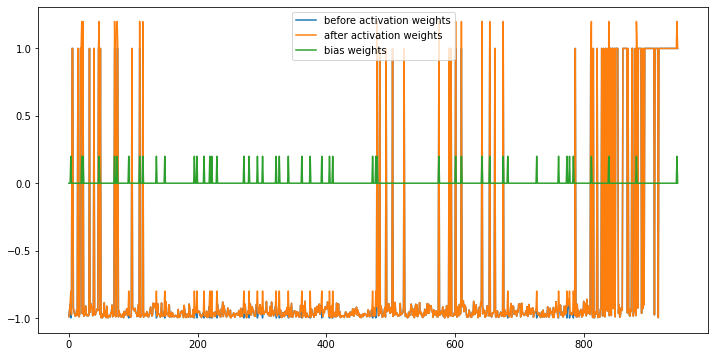

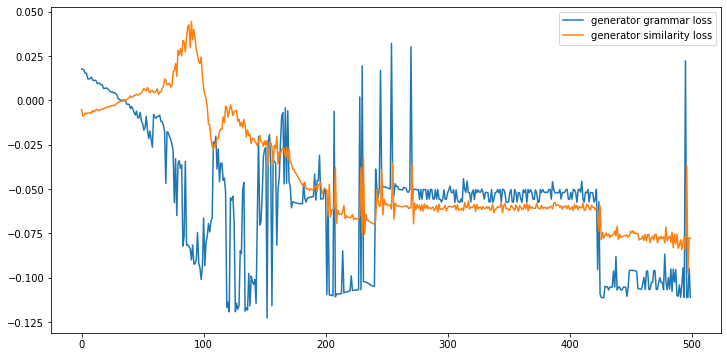

--------------------------------------------------
gold summary:
Patricia Glancy, 36, conned couples out of money at Wentworth Golf Club .
She admitted five counts of fraud, with the stolen money totaling £10,787 .
Glancy was today spared jail after proving how the spent stolen money .
She had donated large sums to charity and took dying friend to New York .
--------------------------------------------------
sam_wgan summary:
Glancy five couples Club. who stole £11,000 couples avoided on cancer. Patricia 36, bank account. admitted stealing to Glancy £10,787. the every had scam. proof had buy hospices. fell fraud. fully Patricia honoured couples customers. saw been personally, and counts Patricia Surrey would own £350 club’s receptions and deposits. parties Glancy deposit Patricia stolen. home club’s account. pounds Martinez’s Maraj Sharif over pounds Glancy’s The frauds, were carried between March and June 6, 2013, Lisa Patel tried to send Glancy an only back saying the Wentworth honou

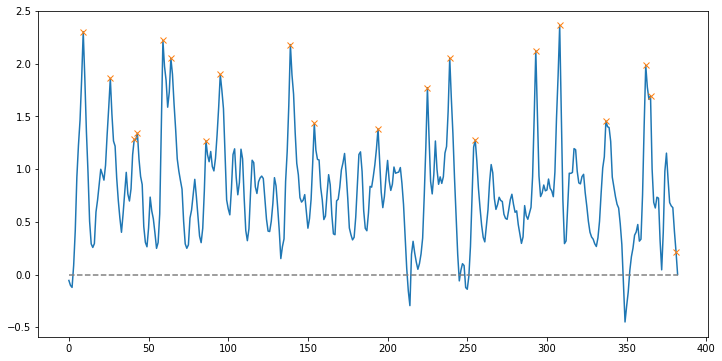

Peak count: 20
Frame tokens: saliva. weight. nickname AMY1. digestion chips, starchy weight. gene. AMY1 AMY1 starch metabolism. may enzyme obesity. advice digest food approaches. 

Similarity : 0.4719339788016851
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.9770548343658447 Generator / grammar loss:-0.07972419261932373   similarity loss:-0.08201882243156433


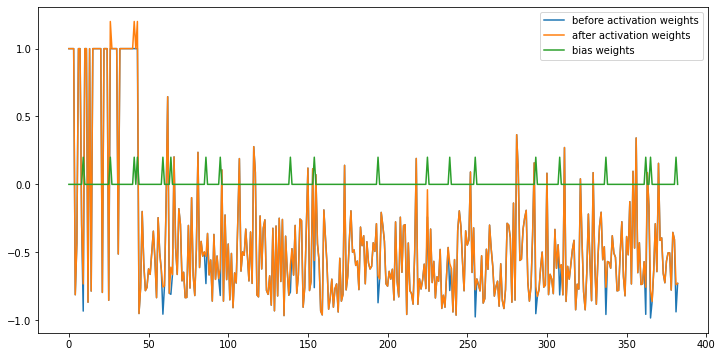

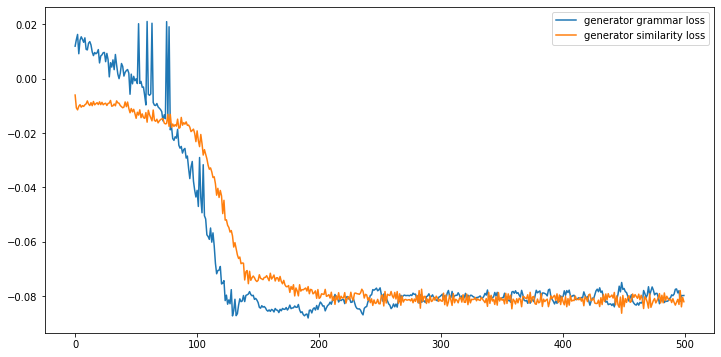

--------------------------------------------------
gold summary:
AMY1 gene makes a carb-busting compound and can influence weight .
Gene makes enzyme in saliva that begins the breakdown of starchy food .
It has been nicknamed the Atkins Gene after the popular diet .
Study finds that those with more copies of the gene are likely to be slim .
--------------------------------------------------
sam_wgan summary:
 The secret to could be Researchers have that gene that makes a carb-busting compound a large influence weight. Nicknamed the Atkins Gene some quarters after the popular diet, its official scientific nickname is AMY1. foods and saliva The gene likely to the the gene, find But starch future step is digestive useful future, to amylase important in and can
--------------------------------------------------
bert_lexrank summary:
Others will have two, three or even more.The secret to staying slim could be in saliva.In the case of the AMY1 gene, it possible to have up to 20 copies.Althou

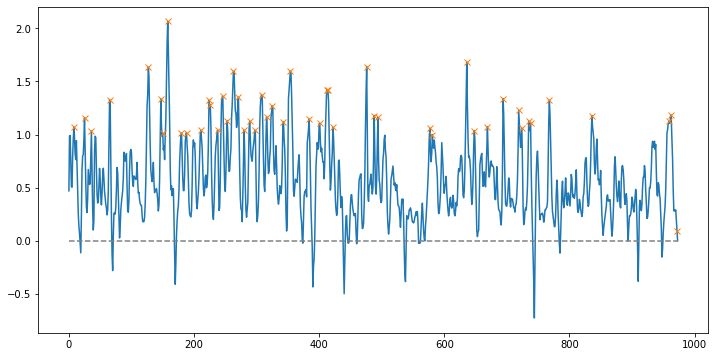

Peak count: 49
Frame tokens: fallen tracing 1914. Frederick his remains found uncle. he found they military 100 digging killed World death. men men Regiment digging Thompson, World his remains. relative, identified. War. fought his he relatives. family. remains cause building burial. Commonwealth perpetuity heroes. men deserve. ceremony men, Regiment military years find: France. 

Similarity : 0.4056897221946997
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.8999220132827759 Generator / grammar loss:-0.07710675150156021   similarity loss:-0.08712289482355118


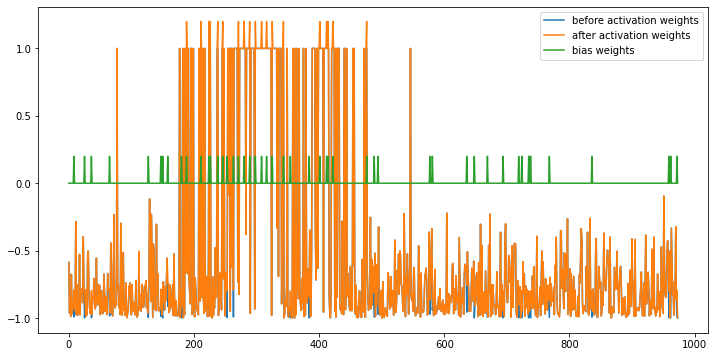

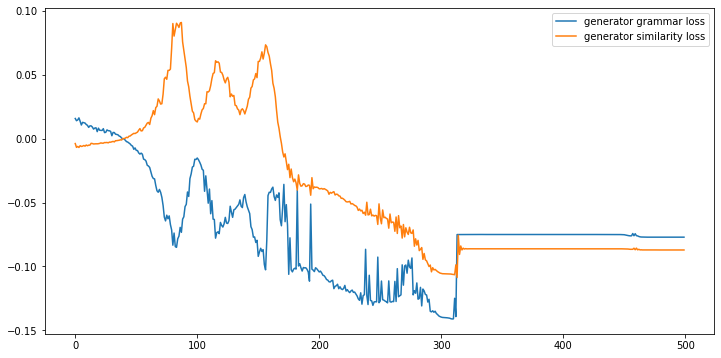

--------------------------------------------------
gold summary:
Historians seeking to identify troop of fallen WWI soldiers found in France .
Eric Saunders provided DNA sample to see if one was his great uncle .
Private Frederick Thompson was reported missing in action at the age of 20 .
--------------------------------------------------
sam_wgan summary:
20. 20. be 15 found in France, historians from War has they will be discover military 100 farmers digging Thompson, killed action War, be identified a century his Archaeologists uncovered partial skeletal remains of men alongside toothbrushes, and brass buttons proving the men belonged to 2nd Battalion York and Lancaster Regiment after their remains were uncovered by digging up sewers in 2009. One young soldier, Private Frederick Thompson, killed in action early in the First World War may be identified nearly a century his death, from DNA provided by his great-nephew, one the first DNA tests soldiers remains. down Mr are awaiting his

Unexpected error: <class 'IndexError'>
62 / 70
------------------------------------------------------------------
A British teenager has been sentenced to eight years in prison over the stabbing death of a British soldier during a nightclub brawl in Cyprus. David Lee Collins, 18, from London, was stabbed to death after a fight broke out in a nightclub in the popular resort of Ayia Napa last November. The court said that Mohamed Abdulkadir Osman, originally from Somalia, but living in London, was provoked and lost. self-control when he pulled out a switchblade and fatally stabbed Mr Collins. Tragic: David Lee Collins, 19, was stabbed to death after a fight broke out in a nightclub in the popular resort of Ayia Napa last November - the photo on the right is thought to be last image taken of him before his death. The three-judge bench said that Collins had confronted Osman and his friends after being punched by an unidentified nightclub patron, raising a clenched fist at the group and tel

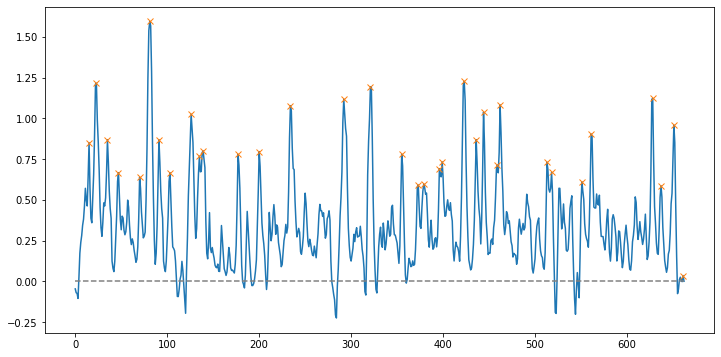

Peak count: 34
Frame tokens: death brawl death resort lost. Mr death resort death. Osman after fight. fight. family. Osmans Osmans friends. Mr Royal post-mortem. off-duty: Mr death nightclub. tourists nightclub. sentencing. attack servicemen clubbing brawl finishing acquitted. article. 

Similarity : 0.356587730555612
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.652681589126587 Generator / grammar loss:-0.15366917848587036   similarity loss:-0.08592372387647629


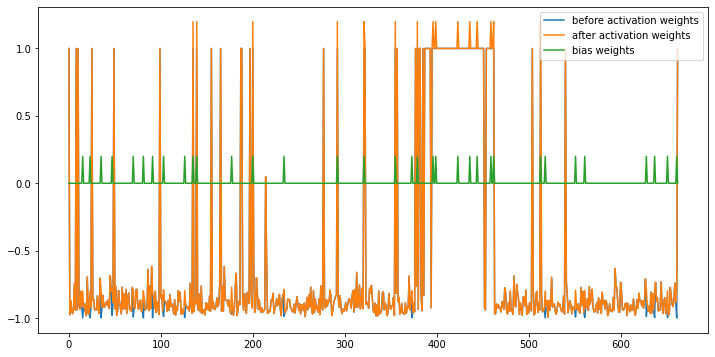

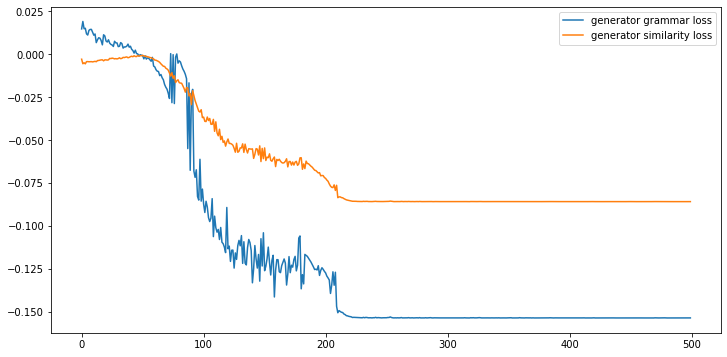

--------------------------------------------------
gold summary:
David Lee Collins, 18, was stabbed to death after a fight broke out .
Died after being stabbed in Ayia Napa nightclub last November .
Mohammed Abdulkadir Osman, 20, .
originally from Somalia was jailed .
Court: Collins' friends - who were all soldiers - started the fights .
--------------------------------------------------
sam_wgan summary:
 eight in Cyprus. Ayia nightclub Osman after telling the friends with that fight. Cypru  Osmans Osmans hotel friends. against 2nd Royal of Fusiliers, a heart caused by a. sharp instrument, according a post-mortem. Killed while off-duty: Tributes have been paid to Mr Collins, second left, on Twitter and a Facebook page has been set up in his memory. Party: Mr Collins (fourth from right in black and red cap) was stabbed to death after a fight broke out in a nightclub. Scene: The stabbing took place during a four soldiers and three British tourists at this nightclub. his sentencing. rape

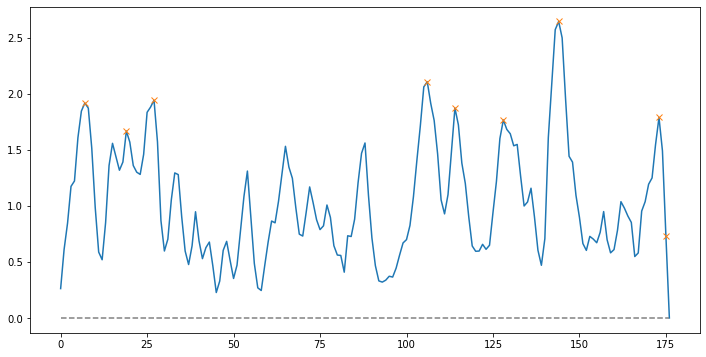

Peak count: 9
Frame tokens: venture brands. company Virgin worldwide, exceeded exceeded $1 deal. 

Similarity : 0.40691930808040444
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.426992893218994 Generator / grammar loss:-0.14913681149482727   similarity loss:-0.10577042400836945


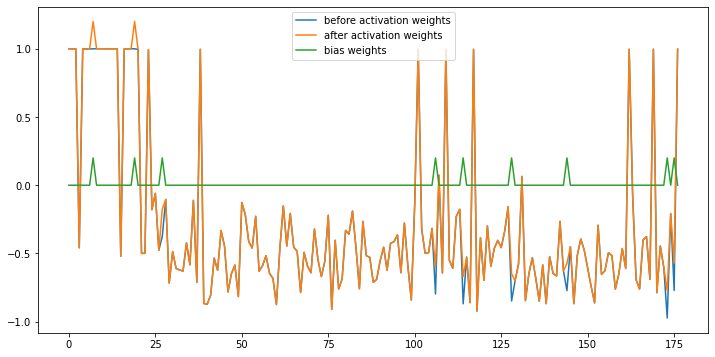

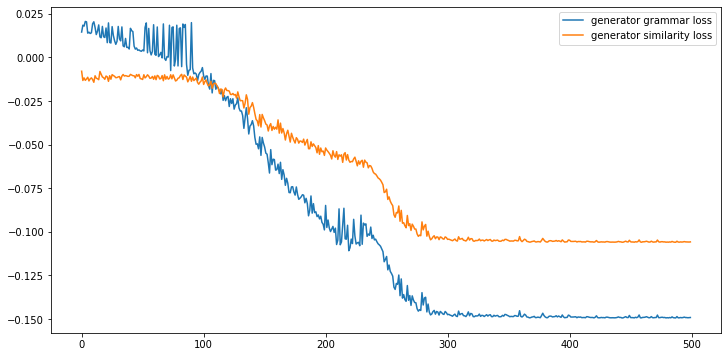

--------------------------------------------------
gold summary:
The Virgin Group was founded by Richard Branson in 1970 .
Student Magazine, started by Branson at 16, was forerunner to the group .
Today Virgin has more than 200 companies in a range of industries .
--------------------------------------------------
sam_wgan summary:
 (CNN) -- a leading branded venture capital organization, is one of the worlds recognized and respected brands. Conceived by Branson music, more 50,000 studios in 
--------------------------------------------------
bert_lexrank summary:
The first recording was the 1973 smash Tubular Bells, by Mike Oldfield.Conceived in 1970 by Richard Branson, the company started out with a magazine four years before that, which Branson began while still at school.The next move was into the music industry, setting up Virgin as a music retailer and then branching out into music production.(CNN) -- Virgin, a leading branded venture capital organization, is one of the worlds mo

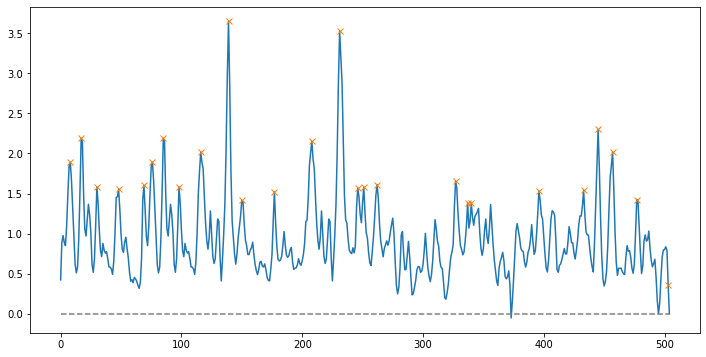

Peak count: 26
Frame tokens: million earliest animals scientists Spherical million earliest animals Megasphaera, fossils. marine multicellular Megasphaera, fossils. years animal years years bacteria, algae, LiveScience. animals, Megasphaera, embryos. LiveScience. today. 

Similarity : 0.49888014751156096
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.134018659591675 Generator / grammar loss:-0.15203918516635895   similarity loss:-0.13861718773841858


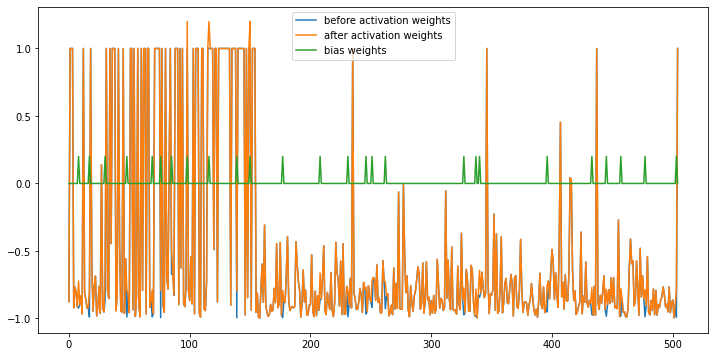

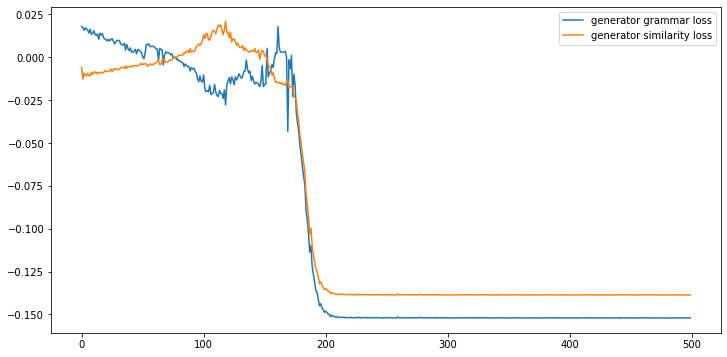

--------------------------------------------------
gold summary:
Called Megasphaera, the fossils were found in rock in southern China .
They are 60 million years older than date skeletal animals appeared .
But the cells are too complex to be belong to bacteria, the study claims .
They may represent shift between single-cell life and multicellular animals .
--------------------------------------------------
sam_wgan summary:
Spherical fossils in the animals. appeared huge spurt of new Earth Cambrian fossils are complex bacteria, instead the embryos an ancient in China dating back 600 years the planets fossils are 60 years than animals growth of new life known as Called Megasphaera, the ancient fossils from a layer in southern China called the Doushantuo Formation and contradict longstanding interpretations of multicellular 7mm) across and originated from what have a marine at the time. or modern Professor 
--------------------------------------------------
bert_lexrank summary:
We will 

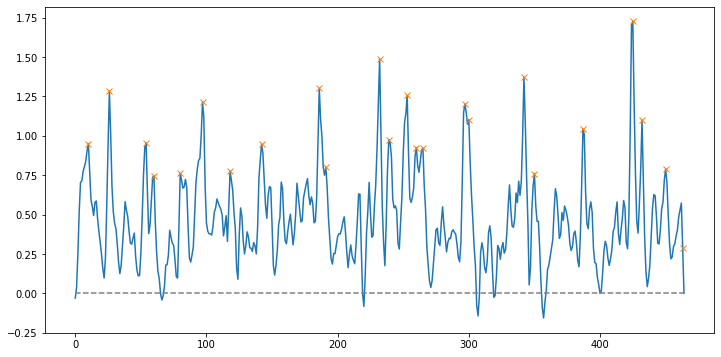

Peak count: 24
Frame tokens: lines ticket. Derby. Ford Stunned: yellow lines Mr ticket. left parked. double bumper. McCrystals blamed Mr Derby, parking. gap lines ticket error. enforcement caused. 

Similarity : 0.39716969204333796
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.3810195922851562 Generator / grammar loss:-0.15646064281463623   similarity loss:-0.11788742244243622


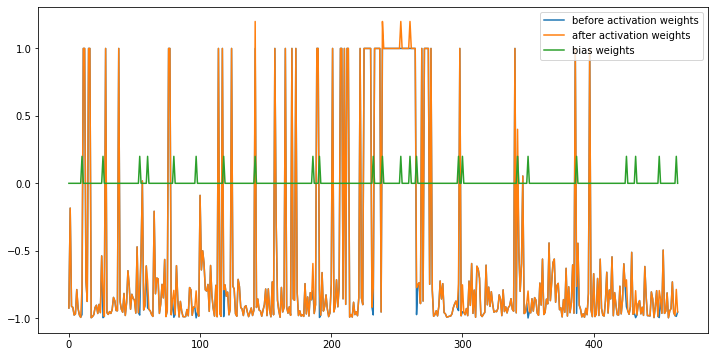

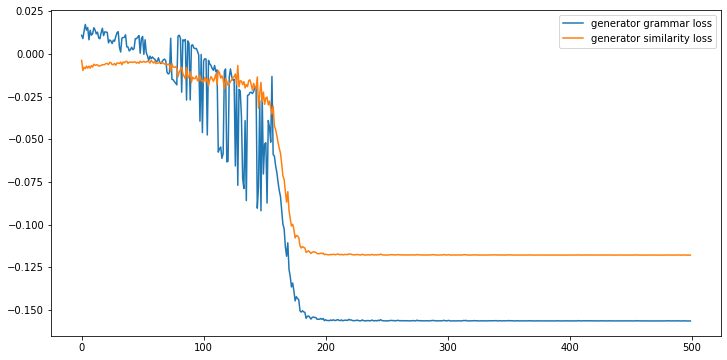

--------------------------------------------------
gold summary:
They even sprayed paint on his Ford Fiesta in calamitous giveaway .
--------------------------------------------------
sam_wgan summary:
had been his car of Patrick works, for he yellow housing Mr break below McCrystals when The workmen as There is paint my front paint There were no lines there when The new lines extended from double yellow lines which had previously ended about two feet from Mr McCrystals front bumper. Apology: The ticket left on Mr McCrystals window. Derby City Council communication has now revoked the fine. McCrystal, stop the traffic
--------------------------------------------------
bert_lexrank summary:
Nothing gave me the impression I couldnt.The 49-year-old had parked his Ford Fiesta in the street near to a Co-operative store and a petrol station, where he works, for three years.There were no lines there when I parked.It appears that there was a communication breakdown between our contractors unde

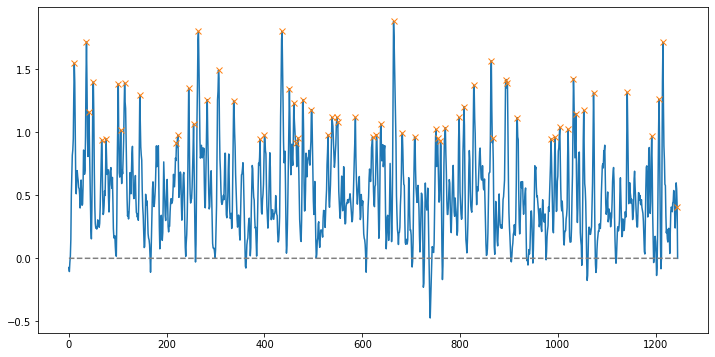

Peak count: 63
Frame tokens: closed’ Rail station. travel Christmas. station cancelled. station, affect passengers Sunday, leaving ‘frustrating’. apologised travel ‘shut already Sunday. apologised travel travel closed station. start journey travel necessary tomorrow. before start terminate diverting travelling London Customers Trains. Underground undertaken Christmas. passengers every holidays. service track yesterday Rail. passenger festive frustrating. buying passengers anger. wrong work. cancelled tomorrow. cancelled unprepared. yesterday. sales. yesterday. Rail closed. 

Similarity : 0.4763739758403305
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.9592254161834717 Generator / grammar loss:-0.10077633708715439   similarity loss:-0.10485436022281647


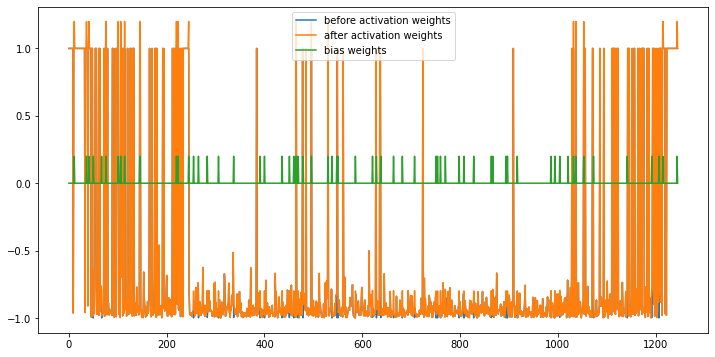

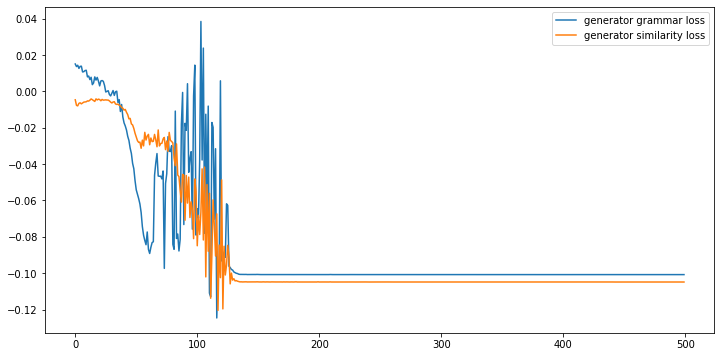

--------------------------------------------------
gold summary:
East Coast, First Hull Trains, Grand Central and Great Northern lines hit .
Planned works in Holloway area of London were not completed in time .
Customers advised to  start and finish journey at Finsbury Park instead .
Thousands expected to make post-Christmas return journey on Saturday .
East Coast Trains apologised for cancellation on a 'very busy travel day'
National Rail said  services would be 'significantly disrupted' tomorrow .
--------------------------------------------------
sam_wgan summary:
 One of the country’s biggest rail terminals will ‘effectively closed’ today because of over-running engineering works. There will be no trains in or out of King’s Cross in London due to to Network Rail works north the station. The disruption comes on of the year, as thousands return after of Kings Cross station cancelled London station, in where services are cancelled. station, which managed Rail, affect East Grand Centra

Unexpected error: <class 'IndexError'>
67 / 70
------------------------------------------------------------------
Veteran actor Victor Spinetti, who starred in all three Beatles films, has died at the age of 82. The Welsh star, who also appeared in a string of acclaimed movies as well as taking roles in the West End and on Broadway, died after a fight with pancreatic cancer. Close friend Barbara Windsor, on whose Radio 2 show he made a recent appearance, was one of his final visitors before his death this morning at a hospice in Monmouth. Respected: Victor Spinetti was told by the late George Harrison he had to star in all the Beatles films, pictured here in 1972. Tributes: Actor Victor Spinetti, pictured left in 2010, died today at a hospice - one of his last visitors was close friend Barbara Windsor, pictured right with the actor in the 1960s. Spinetti’s agent, Barry Burnett, said: He had cancer for a year, but he was very cheerful to the end. I spoke to him on Friday and he was talk

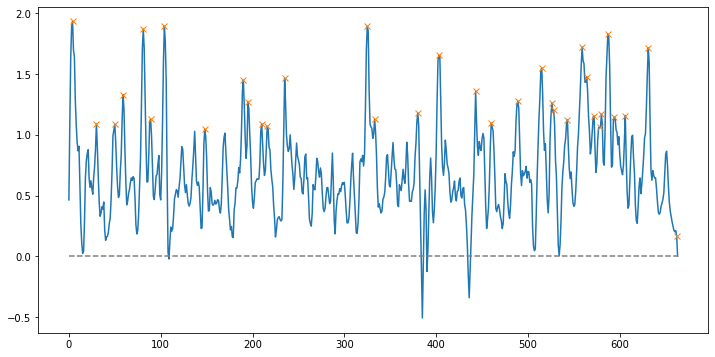

Peak count: 34
Frame tokens: Spinetti, movies Close he Victor Harrison Actor was He successful Cake Jaffa actor Spinetti 1963. our career, Victor many for also Rex. also he Victor numerous co-authored Write, he also and sitcom Victor War. 

Similarity : 0.3634251372869476
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:1.8521718978881836 Generator / grammar loss:-0.06340724974870682   similarity loss:-0.07821705937385559


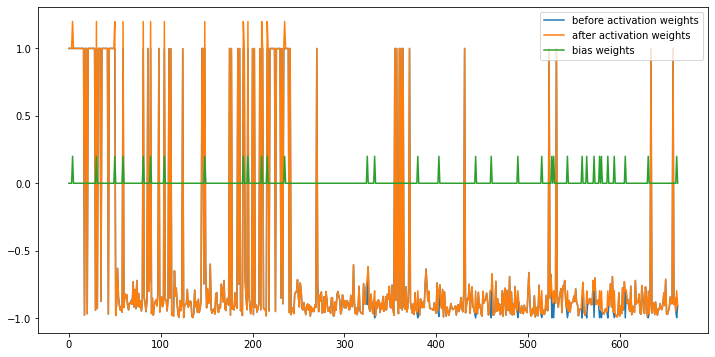

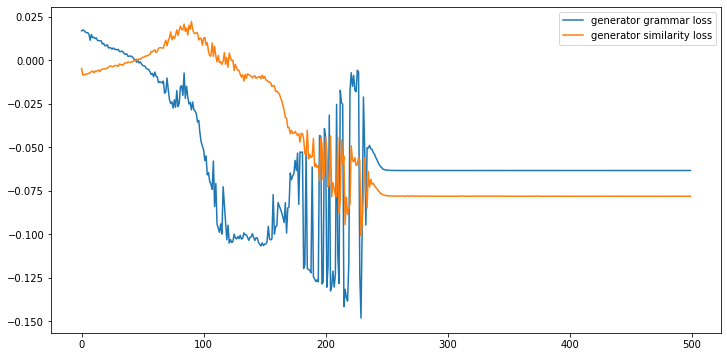

--------------------------------------------------
gold summary:
Sprang to prominence in three Beatles films of the 1960s: Hard Day’s Night, Help! and Magical Mystery Tour .
Close friend Barbara Windsor was one of the last people to visit the veteran actor .
His agent Barry Burnett, said: 'He was very cheerful to the end'
--------------------------------------------------
sam_wgan summary:
 Veteran actor Victor Spinetti, who starred in all three Beatles films, has died at the age 82. The star, who also appeared in a string of movies well as taking in the West End and on Broadway, after a fight with pancreatic cancer. Close he Victor the Harrison films, Actor in died friend year, but was easily his comedy and He was successful and became a Cake ad Jaffa Cake Star: Victor with John Lennon and Ono at the National Theatre, 1969 the actor starred in all three films. Tour. the Hard Help! Magical Tour. to The feminist Broadway Front, Oh!
--------------------------------------------------
bert

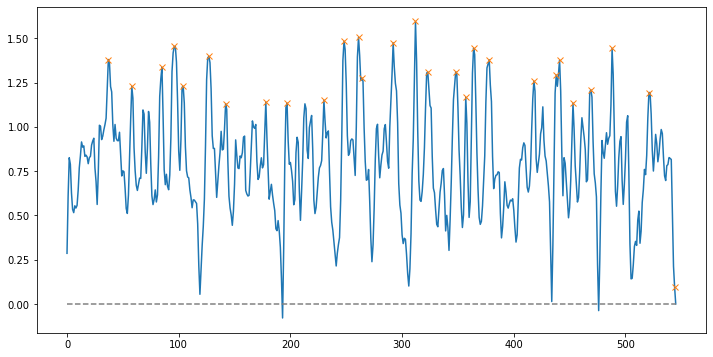

Peak count: 28
Frame tokens: Cameron Minister braved Feat: Brook Success: race. Great Cut: race. Support: exploits. fun torrent. Father. was announced celebrate. Mr Great Mr runner medallist race. Brook stream. competitor Siberia. 

Similarity : 0.36330736517958295
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.577425241470337 Generator / grammar loss:-0.13378357887268066   similarity loss:-0.07435134053230286


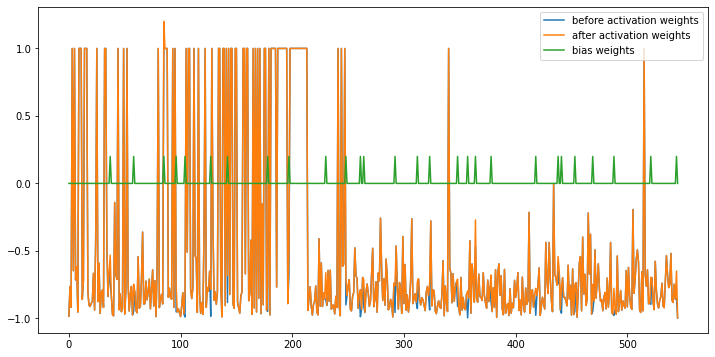

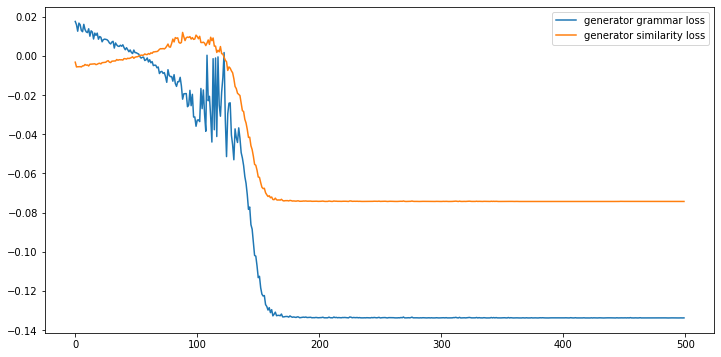

--------------------------------------------------
gold summary:
Prime Minister took part in Great Brook Run for the third time .
Participating for first time in Oxfordshire run since becoming PM in 2010 .
Russian President Putin is renowned for his macho exploits .
Putin has been pictured competing in judo and holding a rifle while topless .
--------------------------------------------------
sam_wgan summary:
enjoys bare-chested with hunting rifles his macho image. Russian does it. soaking a  stream in braved muddy conditions and Chadlington Run. Run Thursday afternoon. Minister climb part Mr Samantha after medal for the competitors cover a over a involved considerably water than heavy The close the known as Brook, raging so much this year children normally allowed to compete were barred from wading The Prime Ministers knee support did not stop him sustaining a nasty-looking graze on his shin. photographs end race. his Prime
--------------------------------------------------
bert_lexr

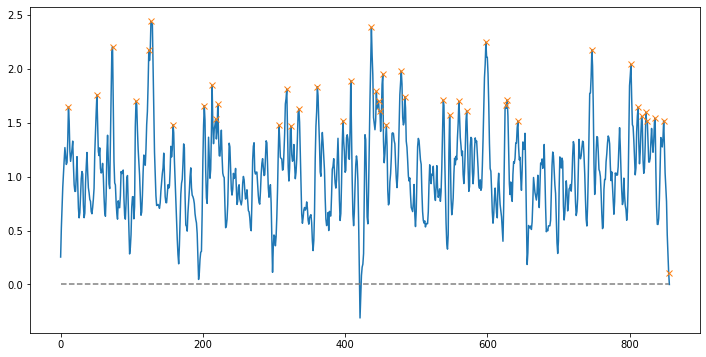

Peak count: 43
Frame tokens: capital stability, beauty, experience. bustling beaches tropical walkway surroundings. visit largest park Africa. economic slave Africa. heritage. robust Accra. perfect up African entertained Drumming, local Kwame nightlife. boasts cuisines. goers. celebrates ingredients. bar seasoned Africa. tranquil. restaurants all accomodation, offers Golden Hotels 2013. 

Similarity : 0.4682650511722586
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.4959347248077393 Generator / grammar loss:-0.15333248674869537   similarity loss:-0.10268332064151764


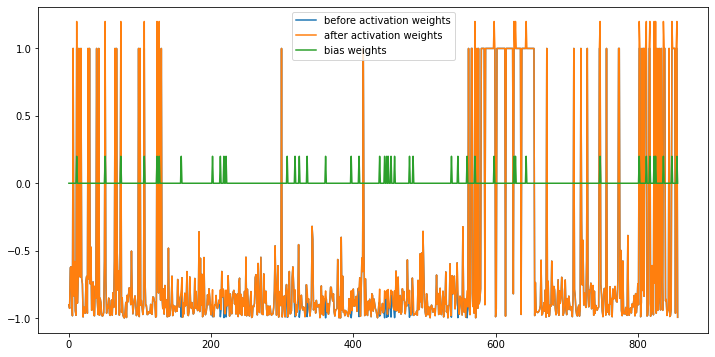

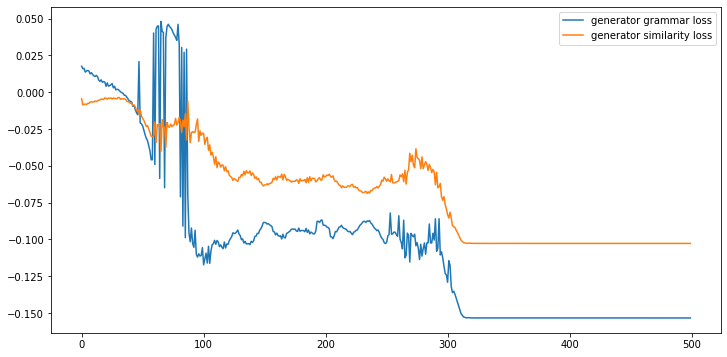

--------------------------------------------------
gold summary:
Ghana is a country rich in history, culture and natural beauty .
Mole National Park is home to more than 93 species of mammal .
Elmina Castle is the oldest remaining slave castle in Africa .
Osu, in Accra, offers visitors a vibrant nightlife .
--------------------------------------------------
sam_wgan summary:
Kotoka capital you greeted -- this beautiful country. stability, its Rich beauty, the circuit, experience. bustling beaches nightlife. known amount are for club goers. the additions Accra is Republic Bar and With indoor and outdoor seating the bar has a retro vibe, and celebrates Ghanaian culture and art. Republic has a wonderful list of drinks, ranging from local beers, to exotic cocktails and herbal teas made with ingredients. The bar also serves a wonderful menu of finger including fried yam/cassava, kelewele (fried plantain seasoned with delicious spices) and chicken wings seasoned with local spices. Read to yo

Unexpected error: <class 'IndexError'>
70 / 70
------------------------------------------------------------------
(CNN) -- Two separate incidents at coal mines in Southwest China over the weekend left at least three miners dead and 42 trapped, state media reported. Days of heavy rain caused a mine at Niupeng in Guizhou province to flood on Saturday morning; while rain-saturated earth on the surface collapsed into a shaft at another pit in Guangxi around noon the same day, killing three miners, Xinhua said. The report added that more than 1,000 police, firemen, and paramilitary personnel joined the mission to rescue the trapped workers at Niupeng. By Monday the water level at the mine had dropped but was still 40 meters (131ft) higher than where 23 of the miners are believed trapped, according to reports from China National Radio. Local authorities said the heavy rain may have caused a previously dry river to rise, while possibly increasing the water level in underground rivers around t

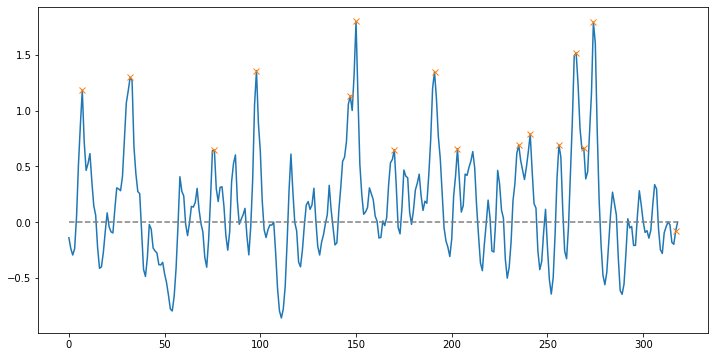

Peak count: 16
Frame tokens: coal a police, mine rivers mines. gas China cave-in. Bureau, accidents safety Mine 2,500 mine report. 

Similarity : 0.31372907549873086
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, beta:2.0282835960388184 Generator / grammar loss:-0.12168075889348984   similarity loss:-0.11885221302509308


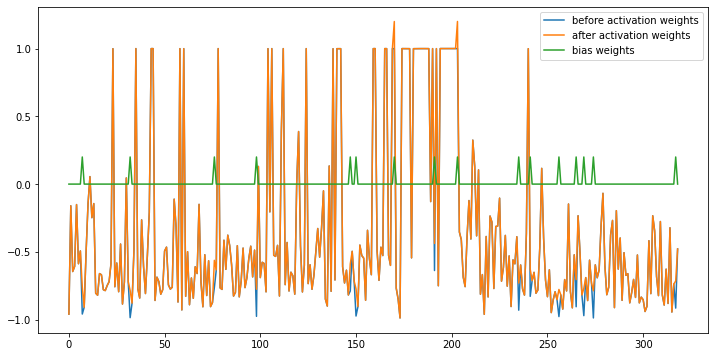

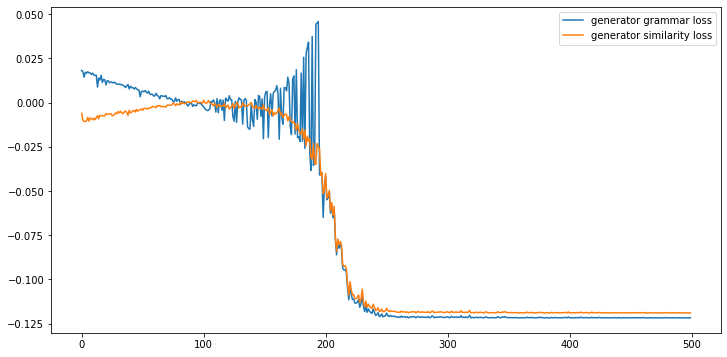

--------------------------------------------------
gold summary:
42 miners remain trapped in the two coal mines in southwestern China .
Days of heavy rain caused a mine at Niupeng in Guizhou province to flood .
"Rain-saturated earth on the surface collapsed into a shaft" at another pit in Guangxi .
--------------------------------------------------
sam_wgan summary:
trapped, Niupeng morning; while Guangxi noon and 40 (131ft) the Local rise, possibly increasing the already been At Guangxi, of gas using machines to dig out 19 trapped miners trapped at a depth of 390 (1,200ft), Daily 50 other miners were reported to have escaped the cave-in. Mining
--------------------------------------------------
bert_lexrank summary:
Michele Philips contributed to this report.Continued rain on Sunday further complicated the rescue effort, it added.According to Xinhua, the Niupeng mines investors have already been detained by the police.50 other miners were reported to have escaped the cave-in.However, 

,method,comp rate,intro,body,conclusion,isthmus,simlirality,grammarity,R1,R2,RL
0,SAM+WGAN,0.158253,0.506419,0.448863,0.430264,0.007686,0.456102,0.953091,0.291310,0.060910,0.162784
1,BERT+LexRank,0.167912,0.311308,0.305100,0.292123,0.002411,0.305251,0.999982,0.210805,0.045882,0.125866
2,BESM,0.197771,0.618408,0.456636,0.456943,0.013653,0.490931,0.999958,0.308563,0.112068,0.197624
3,BESM+kobert,0.213483,0.616672,0.465873,0.449583,0.013468,0.494624,0.999972,0.327421,0.130512,0.205137
4,Transformer,0.134369,0.554987,0.423551,0.359864,0.011636,0.434131,0.999977,0.459092,0.255277,0.321842
5,T5,0.107548,0.572267,0.391250,0.331849,0.016157,0.413379,0.999914,0.428582,0.224513,0.318238


In [95]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

step = 0
for g_summ,intro,body,end in document:
    step += 1
    print("=" * 50)
    print(str(step),"/",len(document))
    print("=" * 50)
    
    org_text_1 = intro
    org_text_2 = body
    org_text_3 = end

    try:
        df1,dct1 = sam_wgan(g_summ,[org_text_1,org_text_2,org_text_3],init_bias=0.2,display= True)
        if dct1['grammar'][0] > 0.0:
            df2,dct2 = bert_lexrank_sum(g_summ,[org_text_1,org_text_2,org_text_3])
            df3,dct3 = besm(g_summ,[org_text_1,org_text_2,org_text_3])
            df4,dct4 = besm_bert(g_summ,[org_text_1,org_text_2,org_text_3])
            df5,dct5 = abstract_method_1(g_summ,[org_text_1,org_text_2,org_text_3])
            df6,dct6 = abstract_method_2(g_summ,[org_text_1,org_text_2,org_text_3])

            test_result['SAM+WGAN'].append(get_features(dct1))
            test_result['BERT+LexRank'].append(get_features(dct2))
            test_result['BESM'].append(get_features(dct3))
            test_result['BESM+kobert'].append(get_features(dct4))
            test_result['Transformer'].append(get_features(dct5))
            test_result['T5'].append(get_features(dct6))
            result = pd.concat([df1, df2, df3, df4, df5, df6 ], ignore_index=True)
            #result = pd.concat([df1, df2, df3, df5, df6 ], ignore_index=True)
            
            print(result)
            
            print("Current result","=" * 50)
            print("Sample count:",len(test_result['SAM+WGAN']))
            print(get_test_statistics(test_result))
        
    except KeyboardInterrupt as ki:
        raise ki
    except :
        print("Unexpected error:", sys.exc_info()[0])
        #raise e
        pass

get_test_statistics(test_result)

## Reference

[1] Rada Mihalcea and Paul Tarau, (2004). TextRank: Bringing Order into Texts <br>
[2] G¨une¸s Erkan. (2004). LexRank: Graph-based Lexical Centrality as Salience in Text Summarization <br>
[3] Susan T. Dumais (2005). "Latent Semantic Analysis". Annual Review of Information Science and Technology. 38: 188–230. <br>
[4] Hans Peter Luhn (1960). Keyword-in-context index for technical literature. American Documentation, 11(4):288–295. ISSN 0002-823 <br>
[5] Aria Haghighi, (2009). Exploring Content Models for Multi-Document Summarization <br>
[6] Colin Raffel. (2020). Exploring the Limits of Transfer Learning with a Unified Text-to-Text Transformer <br>
[7] Mike Lewis, (2019). BART: Denoising Sequence-to-Sequence Pre-training for Natural Language Generation, Translation, and Comprehension <br>
[8] Alec Radford, (2018). Language Models are Unsupervised Multitask Learners <br>
[9] Guillaume Lample, (2019). Cross-lingual Language Model Pretraining <br>
[10] Nils Reimers and Iryna Gurevych, (2019). Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks <br>
[11] Sharma, P., & Li, Y. (2019). Self-Supervised Contextual Keyword and Keyphrase Retrieval with Self-Labelling <br>
[12] Jacob Devlin, (2019). BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding <br>
[13] Ian J. Goodfellow, (2014). Generative Adversarial Nets <br>
[14] Yau-ShianWang, (2018). Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks <br>
[15] Martin Arjovsky, (2017). Wasserstein GAN <br>